# Code used for generating figures
All figures apart from pathway illustrations and plots based on previously published data can be generated with the code below. Note that they are not created in the order they appear in the text for computational ease.

We reuse functions defined in the document "IterativeConstruction_SharedFunctions.ipynb" here and in other files. The respective functions are defined and explained in the shared notebook

We use data generated by executing "IterativeConstruction_NutrientRichEnsemble.ipynb" here. Please execute the respective code before generating figures here.

Note that the data resource allocation data is generated from stochastically parameterizations, and among these, representative examples are randomly chosen (at times with suitable constraints to display the whole chain in the fixed field of view of individual panels). For this reason, representative illustrations will look different from the figures displayed in the manuscript, but should still exhibit the key features of the printed figures.

Also note, that this code is not commented in detail, as it does not contain key calculations. Instead, the relevant calculations are performed in the other two code filed.

Please download the relevant datasets as indicated and replace the file paths to match the downloaded files.

In [1]:
# Specify the folder in which files are saved here
data_folder = "/Users/leonseeger/Desktop/GithubCode/" #"/Users/leonseeger/Desktop/largeDBFiles/"

In [3]:
# The notebook which holds the shared functions first needs to be converted to an .py file to be imported
!jupyter nbconvert IterativeConstruction_SharedFunctions.ipynb --to python

#Import of required packages and the shared functions
from IterativeConstruction_SharedFunctions import *;

import numpy as np
import pandas as pd
import scipy as scp
import random
from scipy.optimize import curve_fit
from scipy.optimize import minimize
from scipy.stats import linregress
from scipy.signal import savgol_filter
from scipy.interpolate import UnivariateSpline
from scipy.interpolate import CubicSpline
from itertools import permutations
from scipy.stats import gaussian_kde
from scipy.stats import kstest #Kolmogorov Smirnov Test

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.colors
from matplotlib.colors import ListedColormap
from  matplotlib.colors import LinearSegmentedColormap
import matplotlib.ticker as mticker
import seaborn as sns
import string
import warnings

import requests
from scipy.stats import rankdata

from matplotlib import cm
from matplotlib.ticker import LinearLocator

warnings.filterwarnings("ignore")

font = {'size'   : 30} #20
plt.rcParams.update({'axes.titlesize': 'medium'})
plt.rc('font', **font)

#defining colormaps
cmaprbg=LinearSegmentedColormap.from_list('rg',["r", "k", "g"], N=256)
cm = plt.cm.get_cmap('Spectral_r')

N = 256
vals = np.ones((N, 4)) #default alpha = 1
xs = np.linspace(0, 1, N)
vals[:, 0] = np.zeros(N)  #red
vals[:, 1] = 1-xs  #green
vals[:, 2] = 1-xs/3  #blue

Qcm = ListedColormap(vals[::-1])
cmQ = Qcm

N = 4096*2
vmin = 0
vmax = 4#3
vals = cm((np.log10(1/(1/xs-1))-vmin)/(vmax-vmin))#cm(xs**3)
cm3 = ListedColormap(vals)

def multicolor_xlabel(ax,list_of_strings,list_of_colors,anchorpad=0, short = False, **kw):
    from matplotlib.offsetbox import AnchoredOffsetbox, TextArea, HPacker, VPacker

    boxes = [TextArea(text, textprops=dict(color=color, ha='left',va='bottom',**kw)) 
                for text,color in zip(list_of_strings,list_of_colors) ]
    xbox = HPacker(children=boxes,align="center",pad=0, sep=5)
    anchored_xbox = AnchoredOffsetbox(loc=3, child=xbox, pad=anchorpad,frameon=False,bbox_to_anchor=(0.25-0.1*short, -0.27-0.05*short),
                                      bbox_transform=ax.transAxes, borderpad=0.)
    ax.add_artist(anchored_xbox)


[NbConvertApp] Converting notebook IterativeConstruction_SharedFunctions.ipynb to python
[NbConvertApp] Writing 16834 bytes to IterativeConstruction_SharedFunctions.py


In [5]:
### simulation data import and reshaping into an array of structure

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation_reducedVariance.npy"
Nenzymes = 20
fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset_reducedVariance.npy")
print("Initial data structure: ", np.shape(fullensemble), np.shape(parameters))


parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]


meancolors = ["k", "dimgrey"]

KMmean = np.exp(np.mean(np.log(fullensemble[:, 0, 1, :])))

efficiencybins = np.logspace(-2.2 , 2.2, 12)#np.logspace(-1, 1, 6)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 4, 0]/fullensemble[j, :, 1, 0]/(fullensemble[j, :, 3, 0]/fullensemble[j, :, 1, 0])/(1+fullensemble[j, :, 3, 0]/fullensemble[j, :, 1, 0]).T-40).T
    #halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    #iloc = np.where(np.abs(fullensemble[j, :, 5, 0]-maxgr/2)==np.min(np.abs(fullensemble[j, :, 5, 0]-maxgr/2)))
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

print("final data structure: ", np.shape(ensemble))

print("Ensemble structure: (parameterization, growth limitation, state variable, branch, enzyme position)")
print("")
print("There are 5000 parameterizations")
print("... a variable number of degrees of growth limitation, here 3")
print("... six state variables in index-order kappamax, Km, b {legacy parameter, always 1}, rhos, phis, js")
print("... up to three branches, here 1")
print("... of 10 or 20 enzymes each, here 20.")

Initial data structure:  (5000, 1000, 3, 20) (5000, 42)
final data structure:  (5000, 3, 6, 1, 20)
Ensemble structure: (parameterization, growth limitation, state variable, branch, enzyme position)

There are 5000 parameterizations
... a variable number of degrees of growth limitation, here 3
... six state variables in index-order kappamax, Km, b {legacy parameter, always 1}, rhos, phis, js
... up to three branches, here 1
... of 10 or 20 enzymes each, here 20.


In [7]:
### proteomics data import and reshaping into an array of structure

grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

data = dataset[columnsall].to_numpy()
grs = np.array(grsall)
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()

means = np.mean(data, 1)
#means[means == 0] = np.nan
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

#ax = axs[0, 2]
#x = means[~np.isnan(offsets)]
#y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
x = (data[:, 0])[~np.isnan(means)]
y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
validdata = np.all(np.array([x>0, y>0]), 0)
y = np.log(y[validdata])
x = np.log(x[validdata])

x_data = np.copy(x)
y_data = np.copy(y)
#print(np.sum([y>1]/np.shape(y)[0]))

#Test for a (weak) correlation signal on all proteomics data
#slope, intercept, r_value, p_value, std_err = linregress(x,y)
#print(slope, p_value)

exportarray = np.array([UniIDs[:, 0][~np.isnan(means)], x_data, y_data])
np.save("UniprotIDsAndSlopes", exportarray) #save the fitted data for easier reloading

In [9]:
#create a database of all KEGG pathways and their corresponding uniprot ids in e coli metabolism

# Get KEGG gene IDs for all eco modules and pathways
link_genes_url = f"https://rest.kegg.jp/link/eco/md"
gene_response = requests.get(link_genes_url)
gene_lines = gene_response.text.strip().split("\n")

link_genes_url2 = f"https://rest.kegg.jp/link/eco/pathway"
gene_response2 = requests.get(link_genes_url2)
gene_lines2 = gene_response2.text.strip().split("\n")

# Extract gene IDs (e.g., hsa:3098)
path_ids = [line.split("\t")[0] for line in gene_lines]
gene_ids = [line.split("\t")[1] for line in gene_lines]
path_ids2 = [line.split("\t")[0] for line in gene_lines2]
gene_ids2 = [line.split("\t")[1] for line in gene_lines2]
path_ids = path_ids+path_ids2
gene_ids = gene_ids+gene_ids2


# Download and define a converter dictionary to get uniprot ids
converter_url = f"https://rest.kegg.jp/conv/uniprot/eco"
conv_response = requests.get(converter_url)
conv_lines = conv_response.text.strip().split("\n")
kegg_ids = [line.split("\t")[0] for line in conv_lines]
uni_ids = [line.split("\tup:")[1] for line in conv_lines]
converter = dict(zip(kegg_ids, uni_ids))

# Get all ecoli modules and pathways and parse response into a dictionary
response = requests.get("https://rest.kegg.jp/list/module")
response2 = requests.get("https://rest.kegg.jp/list/pathway/eco")

pathway_names = {}
if response.status_code == 200:
    lines = response.text.strip().split("\n")
    #print(lines)
    for line in lines:
        kegg_id, name = line.split("\t")
        #print(name)
        #pathway_names[kegg_id] = name
        pathway_names["eco_%s"%kegg_id] = name

if response2.status_code == 200:
    lines = response2.text.strip().split("\n")
    #print(lines)
    for line in lines:
        kegg_id, name = line.split("\t")
        #print(name)
        pathway_names[kegg_id] = name

#convert all genes belonging to a pathway to uniprot ids
pathdb = []
nondescript = []
for path_id in sorted(list(set(path_ids))):
    if path_id[:2] == "md" or path_id == "path:eco03010":
        pathgenes = np.array(gene_ids)[np.array(path_ids) == path_id]
        pathunis = []
        for gene in pathgenes:
            try:
                pathunis.append(converter[gene])
            except: nondescript.append(gene)
        pathdb.append([path_id, pathunis])
#print(set(nondescript))
print("Number of paths with matched IDs: ", len(pathdb))

#find all metabolic proteins

pathgenes = np.array(gene_ids)[np.array(path_ids) == "path:eco01100"]
metabolicunis = []
nondescript = []
for gene in pathgenes:
    try:
        metabolicunis.append(converter[gene])
    except: nondescript.append(gene)
print("Number of metabolic IDs identified: ", len(set(metabolicunis)))#, set(nondescript))


Number of paths with matched IDs:  112
Number of metabolic IDs identified:  931


In [11]:
# Import metabolomics data 
Bennett_names = []
Bennett_metabolites = []
Bennett_ECs = []
Bennett_KMs = []
Bennett_concs = []
count = 0
with open('BennettTableRaw.txt', 'r') as file:
    for line in file:
        if "E-" in line:
            parts1 = line.split(" ")
            parts2 = line.split(".")
            try:
                KM = parts1[-2]
                conc = parts1[-1]
                EC3 = parts2[3].split(" ")[0]
                EC = parts2[0][-1]+"."+parts2[1][0]+"."+parts2[2][0]+"."+EC3
                metabolite = (line.split(KM)[0].split(".")[-1].split(EC3)[-1])[1:-1]
                if metabolite == "ATP":
                    count = count+1
                elif metabolite == "ADP":
                    count = count+1
                elif metabolite == "AMP":
                    count = count+1
                elif metabolite[:3] == "NAD":
                    count = count+1
                else:
                    Bennett_concs.append(float(conc))
                    Bennett_ECs.append(EC)
                    Bennett_names.append(parts2[0][:-2])
                    Bennett_KMs.append(float(KM))
                    Bennett_metabolites.append(metabolite)
            except:
                pass#print(line)



#Match metabolomics data with uniprot IDs
def query_uniprot_EC(EC, organism="Escherichia coli", printer = False):
    base_url = f"https://rest.uniprot.org/uniprotkb/search?query=ec:{EC}%20AND%20taxonomy_id:83333"
    response = requests.get(base_url)
    if response.status_code != 200:
        print(f"Failed to fetch data for {enzyme_name}: {response.status_code}")
        return []
    #print(response.json().get("results", []))
    results = []
    accessions = []
    for entry in response.json().get("results", []):
        accession = entry.get("primaryAccession")
        
        try:
            s_accessions = entry.get("secondaryAccessions")
        except (KeyError, TypeError):
            pass

        if s_accessions == None:
            accessions = accessions+[accession]
        else:
            accessions = accessions+[accession]+s_accessions
    
    results.append({
        "ec_numbers": EC,
        "uniprot_id": np.array(accessions)
    })
    return results

longlist = []
dictionary = {}
# Query and display results
count = 0
for i in range(len(Bennett_names)):
    enzyme = Bennett_names[i]
    matches = query_uniprot_EC(Bennett_ECs[i])
    IDs = []
    EC = ""
    for match in matches:
        IDs.append(match["uniprot_id"])
        EC = Bennett_ECs[i]
    if len(IDs[0])==0:
        count+=1
        print(f"\n No results for '{enzyme}'", i)
    else:
        for IDlist in IDs:
            for ID in IDlist:
                longlist.append([ID, Bennett_concs[i], Bennett_KMs[i]])

print("Total not found: ", count, " of ", i+1)



 No results for '(2,3-dihydroxybenzoyl)adenylate synthase' 0

 No results for 'citrate (Si)-synthase' 10

 No results for 'ADP-sugar diphosphatase' 17

 No results for 'cytidylate kinase' 41

 No results for 'tRNA cytidylyltransferase' 47

 No results for 'T2-induced deoxynucleotide kinase' 58

 No results for 'dihydroorotate oxidase' 62

 No results for 'T2-induced deoxynucleotide kinase' 64

 No results for 'malate oxidase' 66

 No results for 'FMN reductase' 67

 No results for 'FMN reductase' 70

 No results for 'glucosamine-6-phosphate deaminase' 76

 No results for 'glucosamine-6-phosphate deaminase' 83

 No results for 'GMP synthase' 108

 No results for 'glycerol-3-phosphate dehydrogenase' 113

 No results for 'guanylate cyclase' 120

 No results for 'carboxylate synthase' 141

 No results for 'guanylate cyclase' 151

 No results for 'carboxylate synthase' 172

 No results for 'malate oxidase' 186

 No results for 'nicotinate phosphoribosyltransferase' 208

 No results for 'FM

In [13]:
#reshape metabolomics data into the structure of the proteomics data
dictionary = {}
longlist = np.array(longlist)
for p in list(set(longlist[:,0])): #loop over all found proteins
    if p in UniIDs:
        indices = np.where(longlist[:,0]==p)[0]
        localconcs = np.array(list(set(longlist[indices,1].astype(float))))#remove duplicate assignments of metabolites to the same protein
        localKs = np.array(list(set(longlist[indices,2].astype(float))))

        meanconc = np.exp(np.mean(np.log(localconcs)))
        meanKM = np.exp(np.mean(np.log(localKs)))
        dictionary[p] = [meanconc, meanKM] #assign geometric mean saturation and KM to each protein, raise if entries appear more than once for the same protein


KMs = []
concs = []
for uniID in UniIDs[:,0]: #assign computed concentrations to the proteins found by proteomics
    try:
        concs.append(dictionary[uniID][0])
        KMs.append(dictionary[uniID][1])
    except:
        KMs.append(np.nan)
        concs.append(np.nan)

print("Number of proteins with matched metabolomics data: ", np.sum(~np.isnan(concs)))
#print(len(set(concs)))

Number of proteins with matched metabolomics data:  218


In [15]:
### Compute statistics on the proteomics dataset

#linear fits to all metabolic proteins:
dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

data = dataset[["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]].to_numpy()
grs = np.array([0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34])
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

maskA = []
index = 0
for UniID in UniIDs:
    if UniID not in metabolicunis:
        maskA.append(index)
    index += 1

offsetsA = np.copy(offsets)
offsetsA[maskA] = np.nan
allvalidIDs = UniIDs[~np.isnan(means)][:, 0]
nonvalidIDs = UniIDs[np.isnan(means)][:, 0]
allmetabolicoffsets = offsetsA[~np.isnan(offsetsA)]

sigma = 0.107 ###set relative standard deviation between biological replicates

Pathways with too little data
PRPP biosynthesis, ribose 5P => PRPP 1
Pentose phosphate pathway, oxidative phase, glucose 6P => ribulose 5P 3
Entner-Doudoroff pathway, glucose-6P => glyceraldehyde-3P + pyruvate 4
Citrate cycle, first carbon oxidation, oxaloacetate => 2-oxoglutarate 4
Proline biosynthesis, glutamate => proline 3
Serine biosynthesis, glycerate-3P => serine 3
Cysteine biosynthesis, serine => cysteine 2
Phenylalanine biosynthesis, chorismate => phenylpyruvate => phenylalanine 3
Tyrosine biosynthesis, chorismate => HPP => tyrosine 3
GABA (gamma-Aminobutyrate) shunt 2
Adenine ribonucleotide biosynthesis, IMP => ADP,ATP 4
Guanine ribonucleotide biosynthesis, IMP => GDP,GTP 4
Pyrimidine ribonucleotide biosynthesis, UMP => UDP/UTP,CDP/CTP 3
Deoxyribonucleotide biosynthesis, ADP/GDP/CDP/UDP => dATP/dGTP/dCTP/dUTP 4
CMP-KDO biosynthesis, ribulose-5P => CMP-KDO 4
ADP-LDmanHep biosynthesis, sedoheptulose-7P => ADP-LDmanHep 4
beta-Oxidation, acyl-CoA synthesis 1
beta-Oxidation 4
Phos

Text(0.5, 0, 'Repetitions of the same \nprotein in the pathway set')

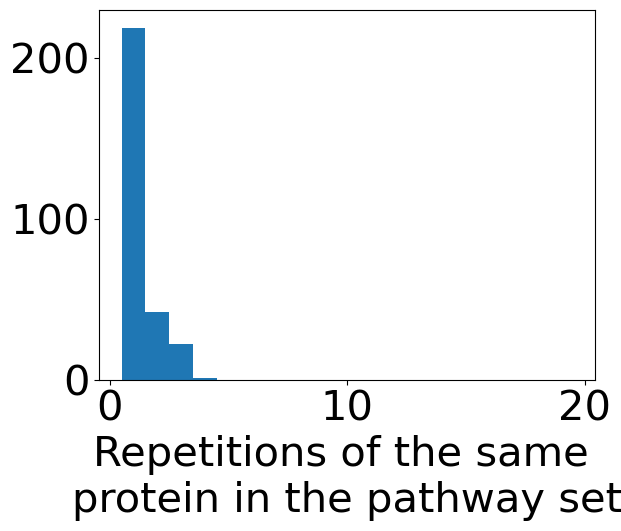

In [39]:
#Identify pathways suitable for the pure proteomics analysis (find pathways with more than 4 proteins, exclude the overarching modules to prevent excessive overlap).
gooddb = []
lens = []
print("Pathways with too little data")
for x in pathdb:
    if (len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1]))>4 and int(x[0][-4])<1) or x[0]=="path:eco03010":
        if len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1]))<901:
            gooddb.append([x[0], list(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1]))])
            lens.append(len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1])))
        else:
            name = pathway_names[x[0].split(":")[1]].split(" - ")[0]
            print(name, len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1])))
    else: 
        name = pathway_names[x[0].split(":")[1]].split(" - ")[0]
        print(name, len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(x[1])))

allunis = []
for i in range(len(gooddb)):
    path, unis = gooddb[i]
    allunis += unis

#check whether uniprotIDs appear repeatedly in the set of analyzed pathways.
uniqueunis = list(set(allunis))
print("Relevant proteins in pathways: ", len(uniqueunis), len(set(UniIDs[:, 0][~np.isnan(means)]).intersection(allunis)))
allunis = np.array(allunis)
counts = []
for uniqueuni in uniqueunis:
    counts.append(np.sum(allunis == uniqueuni))
print("Average occurrences of the same protein: ", np.mean(counts))
plt.hist(counts, bins = np.arange(20)+0.5)
plt.xlabel("Repetitions of the same \nprotein in the pathway set")


In [57]:
#Remove pathways with large overlap to other pathways
print(len(gooddb))
finaldb = []
overlap = np.zeros((len(gooddb), len(gooddb)))
for i in range(len(gooddb)):
    for j in range(len(gooddb)):
        if len(set(gooddb[i][1]).intersection(set(gooddb[j][1])))/len(set(gooddb[i][1]))>0.5:
            if i!=j:
                overlap[i, j] = len(set(gooddb[i][1]).intersection(set(gooddb[j][1])))/len(set(gooddb[i][1]))

for i in range(len(gooddb)):
    for j in range(len(gooddb)):
        if overlap[i, j]>overlap[j, i]:
            overlap[j, i] = 0
        else:
            overlap[i, j] = 0

#plt.pcolormesh(overlap)
remove = np.sum(overlap, axis = 1)
removals = []

for i in range(len(gooddb)):
    if remove[i]>0:
        name = pathway_names[gooddb[i][0].split(":")[1]].split(" - ")[0]#.split(", ")[0]
        if len(set(np.where(overlap[i, :]>0)[0])-set(removals))>0:
            print("removed:", name, len(gooddb[i][1]))
            removals.append(i)
            for j in np.where(overlap[i, :]>0)[0]:
                name = pathway_names[gooddb[j][0].split(":")[1]].split(" - ")[0]#.split(", ")[0]
                print("in: ", gooddb[j][0], name, len(gooddb[j][1]))
                #gooddb[j][1] = list(set(gooddb[j][1])+set(gooddb[i][1]))
        else:
            finaldb.append(gooddb[i])
    else:
        finaldb.append(gooddb[i])
        #print(np.where(overlap[:, i]>0))

print(len(finaldb))

gooddb = finaldb

41
removed: Glycolysis, core module involving three-carbon compounds 9
in:  md:eco_M00001 Glycolysis (Embden-Meyerhof pathway), glucose => pyruvate 15
in:  md:eco_M00003 Gluconeogenesis, oxaloacetate => fructose-6P 12
removed: Gluconeogenesis, oxaloacetate => fructose-6P 12
in:  md:eco_M00001 Glycolysis (Embden-Meyerhof pathway), glucose => pyruvate 15
removed: Pentose phosphate pathway, non-oxidative phase, fructose 6P => ribose 5P 7
in:  md:eco_M00004 Pentose phosphate pathway (Pentose phosphate cycle) 11
removed: Citrate cycle, second carbon oxidation, 2-oxoglutarate => oxaloacetate 15
in:  md:eco_M00009 Citrate cycle (TCA cycle, Krebs cycle) 19
removed: Glyoxylate cycle 7
in:  md:eco_M00009 Citrate cycle (TCA cycle, Krebs cycle) 19
in:  md:eco_M00982 Methylcitrate cycle 13
removed: Threonine biosynthesis, aspartate => homoserine => threonine 6
in:  md:eco_M00016 Lysine biosynthesis, succinyl-DAP pathway, aspartate => lysine 11
in:  md:eco_M00017 Methionine biosynthesis, aspartate =

In [59]:
for path, unis in gooddb:
    name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
    print(path, name)

md:eco_M00001 Glycolysis 
md:eco_M00004 Pentose phosphate pathway 
md:eco_M00009 Citrate cycle 
md:eco_M00016 Lysine biosynthesis
md:eco_M00017 Methionine biosynthesis
md:eco_M00022 Shikimate pathway
md:eco_M00023 Tryptophan biosynthesis
md:eco_M00026 Histidine biosynthesis
md:eco_M00028 Ornithine biosynthesis
md:eco_M00048 De novo purine biosynthesis
md:eco_M00051 De novo pyrimidine biosynthesis
md:eco_M00060 KDO2-lipid A biosynthesis
md:eco_M00061 D-Glucuronate degradation
md:eco_M00082 Fatty acid biosynthesis
md:eco_M00083 Fatty acid biosynthesis
md:eco_M00096 C5 isoprenoid biosynthesis
md:eco_M00117 Ubiquinone biosynthesis
md:eco_M00121 Heme biosynthesis
md:eco_M00124 Pyridoxal-P biosynthesis
md:eco_M00125 Riboflavin biosynthesis
md:eco_M00126 Tetrahydrofolate biosynthesis
md:eco_M00144 NADH:quinone oxidoreductase
md:eco_M00157 F-type ATPase
md:eco_M00176 Assimilatory sulfate reduction
md:eco_M00570 Isoleucine biosynthesis
md:eco_M00880 Molybdenum cofactor biosynthesis
md:eco_M0093

In [31]:
print("Detected: ", len(set(UniIDs[:, 0])))
print("Valid (reliably detected in all conditions): ", len(allvalidIDs))
print("All Metabolic: ", len(metabolicunis))
print("Valid Metabolic: ", len(set(metabolicunis).intersection(set(allvalidIDs))))
print("Invalid Metabolic: ", len(set(metabolicunis).intersection(set(nonvalidIDs))))
print(len(allmetabolicoffsets))
validmetabolic = set(metabolicunis).intersection(set(allvalidIDs))
#len(set(metabolicunis)), len(UniIDs)-len(maskA), len(allvalidIDs), len(allmetabolicoffsets))
#validmetabolic = set(metabolicunis).intersection(set(allvalidIDs))

Detected:  4222
Valid (reliably detected in all conditions):  1647
All Metabolic:  931
Valid Metabolic:  548
Invalid Metabolic:  381
548


Fractions of proteins best explained by a constant, linear or quadratic model
0.46715328467153283 0.39963503649635035 0.1332116788321168
Proteins explained within error bars by a linear model:  515
Analyzed proteins: 548
Note that constat expression is also explained by a linear model.

Plot: Proteins not explained within 3 std by the linear model, sorted by best model.


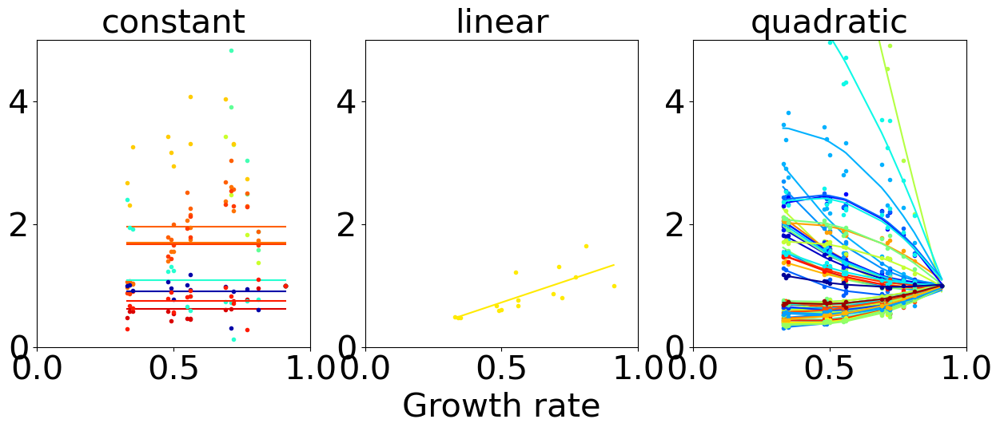

In [49]:
#Testing linearity against alternative hypotheses by bayesian model interference
cmjet = plt.cm.get_cmap('jet')

#Illustration of response curves potentially better described by alternative models.
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
SSQ_0s = []
SSQ_1s = []
SSQ_2s = []
n0, n1, n2 = 0, 0, 0
for i in range(len(UniIDs)):
    if UniIDs[i] in list(validmetabolic):
        model0 = np.poly1d(np.polyfit(grs, data[i], 0)) 
        SSQ_0 = np.sum((1-data[i]/model0(grs))**2)
        SSQ_0s.append(SSQ_0)
        model1 = np.poly1d(np.polyfit(grs, data[i], 1)) 
        SSQ_1 = np.sum((1-data[i]/model1(grs))**2)
        SSQ_1s.append(SSQ_1)
        model2 = np.poly1d(np.polyfit(grs, data[i], 2)) 
        SSQ_2 = np.sum((1-data[i]/model2(grs))**2)
        SSQ_2s.append(SSQ_2)
        color = cmjet(np.random.uniform())
        if min(np.log(SSQ_0), np.log(SSQ_1)+1, np.log(SSQ_2)+2)== np.log(SSQ_0):
            if SSQ_1>sigma**2*len(grs)*3:
                axs[0].plot(grs, data[i]/data[i, 0], ".", color= color)
                axs[0].plot(np.sort(grs), model0(np.sort(grs))/data[i, 0], "-", color= color)
                axs[0].set_title("constant")
            n0 +=1
        if min(np.log(SSQ_0), np.log(SSQ_1)+1, np.log(SSQ_2)+2)== np.log(SSQ_1)+1:
            if SSQ_1>sigma**2*len(grs)*3:
                axs[1].plot(grs, data[i]/data[i, 0], ".", color= color)
                axs[1].plot(np.sort(grs), model1(np.sort(grs))/data[i, 0], "-", color= color)
                axs[1].set_title("linear")
            n1 +=1
        if min(np.log(SSQ_0), np.log(SSQ_1)+1, np.log(SSQ_2)+2)== np.log(SSQ_2)+2:
            if SSQ_1<sigma**2*len(grs)*3:
                axs[2].plot(grs, data[i]/data[i, 0], ".", color= color)
                axs[2].plot(np.sort(grs), model2(np.sort(grs))/data[i, 0], "-", color= color)
                axs[2].set_title("quadratic")
            n2 +=1

axs[0].set_ylim(0, 5)
axs[1].set_ylim(0, 5)
axs[2].set_ylim(0, 5)
axs[0].set_xlim(0, 1)
axs[1].set_xlim(0, 1)
axs[2].set_xlim(0, 1)

axs[1].set_xlabel("Growth rate")



print("Fractions of proteins best explained by a constant, linear or quadratic model")
print(n0/(n0+n1+n2), n1/(n0+n1+n2), n2/(n0+n1+n2))
#print(np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)>1), np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)<1), n0+n1+n2)

#print(np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)>2))
#print(np.sum(np.log(SSQ_1s)-np.log(SSQ_2s)<2))

#Find the number of proteins explained by a linear model and the number of all admissible proteins
print("Proteins explained within error bars by a linear model: ",np.sum((np.array(SSQ_1s)<(len(grs)-2)*sigma**2*3)))
print("Analyzed proteins:", len(SSQ_1s))
print("Note that constat expression is also explained by a linear model.")

print()
print("Plot: Proteins not explained within 3 std by the linear model, sorted by best model.")

-0.12831751370295258 1.254022141712238e-42
30


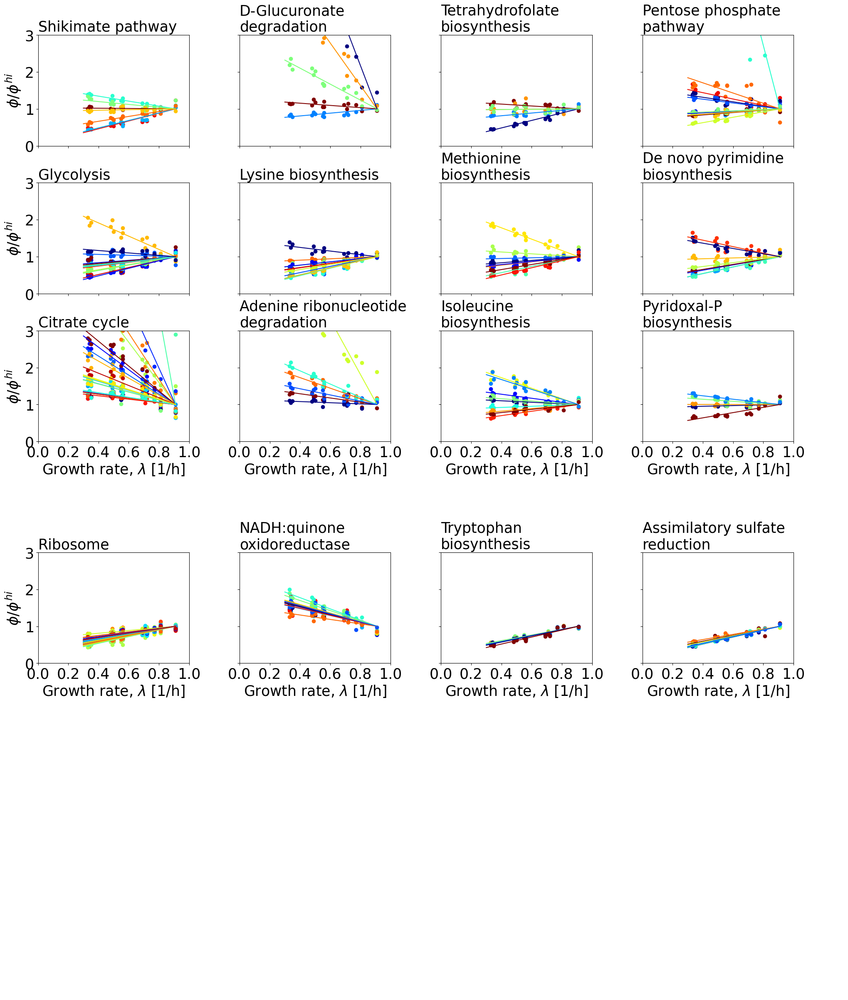

In [61]:
#Figure 1, without the pathway schematic, note that colors outside the shikimate pathway are selected randomly

fig, axs = plt.subplots(18, 1, figsize = (25, 30))
for ax in axs.flatten():
    ax.axis("off")

gs = fig.add_gridspec(26, 16)
gs.update(wspace=0, hspace=0)

for i in range(12):
    axs[i] = plt.subplot(gs[4*int(i/4):3+4*int(i/4), 4*(i%4):3+4*(i%4)])

for i in range(4):
    axs[i+12] = plt.subplot(gs[14+4*int(i/4):17+4*int(i/4), 0+4*(i%4):3+4*(i%4)])
    
#for i in range(4):
#    axs[i+14] = plt.subplot(gs[21+4*int(i/4):24+4*int(i/4), 0+4*(i%4):3+4*(i%4)])

font = {'size'   : 25} #20
plt.rcParams.update({'axes.titlesize': int(25)})
plt.rc('font', **font)

ax = axs[0]

dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

data = dataset[["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]].to_numpy()
grs = np.array([0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34])
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
#means[means == 0] = np.nan
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

#ax = axs[0, 2]
#x = means[~np.isnan(offsets)]
#y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
x = (data[:, 0])[~np.isnan(offsets)]
y = (data[:, -1]/data[:, 0])[~np.isnan(offsets)]
validdata = np.all(np.array([x>0, y>0]), 0)
y = np.log(y[validdata])
x = np.log(x[validdata])

x_data = np.copy(x)
y_data = np.copy(y)

slope, intercept, r_value, p_value, std_err = linregress(x,y)
print(slope, p_value)

cmjet = plt.cm.get_cmap('jet')

vars = []
for g in gooddb:
    path, unis = g 
    mask = []
    index = 0
    locals = ""
    for UniID in UniIDs:
        if UniID not in unis:
            mask.append(index)
        else:
            locals+=(UniID[0]+", ")
        index += 1
    #offsetsC = offsets+slopes*np.max(grs)
    offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
    offsetsC[mask] = np.nan
    vars.append(np.nanvar(np.log(offsetsC)))
    
original_list = vars[:-1]
sorted_list = sorted(original_list)
sorting_list = list(range(len(original_list)))
sorting_list.sort(key=lambda x: original_list[x])
sorting_list = sorting_list[::-1]
sorting_list.append(len(vars)-1)
print(len(gooddb))

deviations = []
basedeviations = []
siglevels = []
for n in range(16):
    if n<12:
        path, unis = gooddb[sorting_list[n]]#[sorting_list[(n+1)%len(gooddb)]]
    else:
        #Bpathways = ["path:eco03010", "md:eco_M00144", "md:eco_M00157", "md:eco_M00023", "md:eco_M00026", "md:eco_M00176"]
        Bpathways = ["path:eco03010", "md:eco_M00144", "md:eco_M00023", "md:eco_M00176"]
        allpathways = np.array([x[0] for x in gooddb])
        path = Bpathways[n-12]
        nlocal = np.where(allpathways == path)[0][0]
        unis = gooddb[nlocal][1]
    name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
    ax = axs.flatten()[n]
    
    mask = []
    index = 0
    locals = ""
    for UniID in UniIDs:
        if UniID not in unis:
            mask.append(index)
        else:
            locals+=(UniID[0]+", ")
        index += 1
    
    #print(locals)
    meansC = np.copy(means)
    meansC[mask] = np.nan
    
    xs = data[~np.isnan(meansC)]
    localoffsets = offsets[~np.isnan(meansC)]
    localslopes = slopes[~np.isnan(meansC)]
    localnames = names[~np.isnan(meansC)]
    rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
    ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])

    colors = np.random.permutation(np.linspace(0, 1, len(xs)))
    for i in range(len(xs)):
        if n==0:
            shikicolors = {"aroF": 0.1, "aroG": 0.2, "aroH": 0.3, "aroB": 0.4, "aroD": 0.5, "aroL": 0.7, "aroK": 0.8, "aroA": 0.9, "aroC": 1.0, }
            color = cmjet(shikicolors[localnames[i][0]])
        else:
            color = cmjet(colors[i])
        #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
        deviation = np.mean((((localoffsets[i]+localslopes[i]*grs)-xs[i])/xs[i])**2)
        basedeviation = np.mean(((np.mean(xs[i])-xs[i])/xs[i])**2)
        deviations.append(deviation)
        basedeviations.append(basedeviation)
        if deviation<10:#0.1:
            if localoffsets[i]>0 and localoffsets[i]+localslopes[i]*grs[0]>0:
                ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
        else:
            ax.scatter(grs, xs[i]/xs[i][0], color = color)
        #if n == 0:
        #    ax.text(-0.31, -0.15+0.31*rankdata(ys)[i], localnames[i][0], color = color)
    

    if len(name)<20:
        ax.set_title(name, loc = "left")
    else:
        parts = name[int(len(name)/2)-2:].split(" ")
        sep = ""
        for part in parts[1:]:
            sep = sep+" "+part
        try:
            ax.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")
        except:
            sep = name.split(" ")[-2]
            ax.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")

    
    
    ax.set_ylim(0, 3)
    ax.set_xlim(0, 1)
        
    if n not in [0, 4, 8, 12, 16]:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel(r"$\phi/\phi^{hi}$")
        
    if n in [0, 1, 2, 3, 4, 5, 6, 7]:#, 12, 13, 14, 15]:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel(r"Growth rate, $\lambda$ [1/h]")

    ax.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])

fig.tight_layout()
#plt.savefig("VariableExpressionChanges.pdf")

732


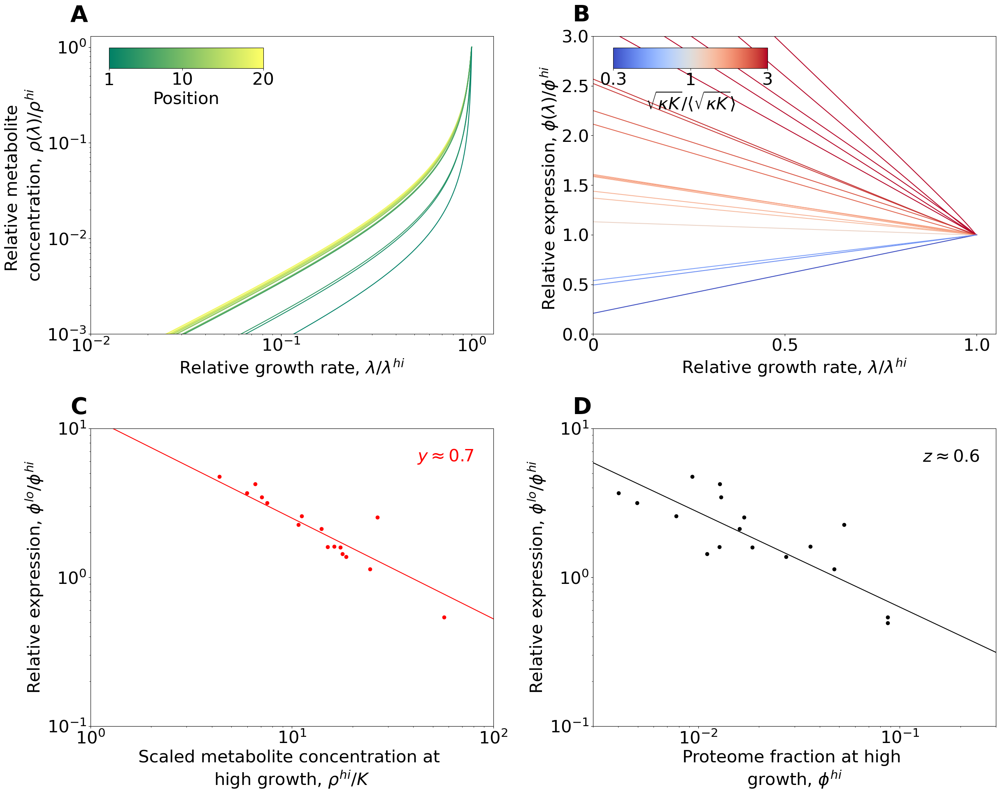

In [65]:
### Figure 2
eps = 0.05

font = {'size'   : 30} #30
plt.rc('font', **font)
fig, axs = plt.subplots(2, 2, figsize = (25, 20))

cmplasma = plt.cm.get_cmap('plasma')
cmInferno = plt.cm.get_cmap('Oranges')
cmYlGn = plt.cm.get_cmap('YlGn_r')

ax2 = axs[0, 0]
ax1 = axs[0, 1]
ax4 = axs[1, 0]
ax3 = axs[1, 1]
#1: growth response proteome
#2: growth response metabolome
#3: growth law proteome
#4: growth law metabolome

betas = ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]/(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])/(1+ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])


allbetas = np.logspace(-np.log10(Nenzymes), 0, 100)
rhorichOverKM = 1/eps*4.2e-2
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
alllambdas = np.logspace(-.2, np.log10(1-eps), 100)

coolwarm = plt.cm.get_cmap('coolwarm')
summer = plt.cm.get_cmap('summer_r')
corrcoeffs = np.mean((np.log(fullensemble[:, 0, 1, 1:])-np.mean(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)[:, None])*(np.log(fullensemble[:, 0, 0, 1:])-np.mean(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)[:, None]), axis = 1)/np.std(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)/np.std(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)
j = random.choice(np.where((corrcoeffs>0.2)*(corrcoeffs<0.4))[0])
print(j)
#j = 4913
for q in np.arange(18)+1:
    fc = fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q]
    color = coolwarm(np.log2(fc)/3+1/2)
    color2 = summer(((q+2)/20)**2)
    ax1.plot(fullensemble[j, :, 5, q]/fullensemble[j, 0, 5, q], fullensemble[j, :, 4, q]/fullensemble[j, 0, 4, q], color = color)
    ax2.plot(fullensemble[j, :, 5, q]/fullensemble[j, 0, 5, q], fullensemble[j, :, 3, q]/fullensemble[j, 0, 3, q], color = color2)
    ax3.scatter(fullensemble[j, 0, 4, q], fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q], color = "k")
    ax4.scatter(fullensemble[j, 0, 3, q]/fullensemble[j, 0, 1, q], fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q], color = "r")

axins2 =fig.add_axes([0.12, 0.90, 0.15, 0.025])
axins1 =fig.add_axes([0.61, 0.90, 0.15, 0.025])

axins1.xaxis.set_ticks_position("top")
im1 = ax1.scatter(np.linspace(0, 1, 100), np.linspace(10, 11, 100), c = np.linspace(0, 1, 100), cmap = "coolwarm")
fig.colorbar(im1, cax=axins1, orientation="horizontal", ticks=[0, 0.5, 1], format=mticker.FixedFormatter(['0.3', '1', '3']), label = r"$\sqrt{\kappa K}/\langle\sqrt{\kappa K}\rangle$")#label=r'$\sqrt{B^{-1}\kappa K}/Z$')


axins2.xaxis.set_ticks_position("top")
im2 = ax2.scatter(np.linspace(0, 1, 100), np.linspace(10, 11, 100), c = np.linspace(1, 20, 100), cmap = "summer")
fig.colorbar(im2, cax=axins2, orientation="horizontal", ticks=[1, 10, 20], label='Position')

xs = np.linspace(-10, 10, 100)
slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 4, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
ax3.plot(np.exp(xs), np.exp(slope*xs+intercept), "k-")
#ax3.plot(np.exp(xs+np.nanmean(np.log(fullensemble[j, 0, 4, :-1]))), np.exp(-1/2*xs+np.nanmean(np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))), color = "k", linestyle = "--", alpha = 0.5)
ax3.text(2.5e-1, 6, r"$z \approx $"+"%.1f"%(-slope), horizontalalignment='right')

xs = np.linspace(-10, 10, 100)
slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 3, :-1]/fullensemble[j, 0, 1, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
ax4.plot(np.exp(xs), np.exp(slope*xs+intercept), "r-")
#ax4.plot(np.exp(xs+np.nanmean(np.log(fullensemble[j, 0, 3, :-1]/fullensemble[j, 0, 1, :-1]))), np.exp(-1*xs+np.nanmean(np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))), color = "r", linestyle = "--", alpha = 0.5)
ax4.text(8e1, 6, r"$y \approx $"+"%.1f"%(-slope), color = "r", horizontalalignment='right')

ax1.set_xlim(0, 1.05)
ax1.set_ylim(0, 3)
ax1.set_xlabel("Relative growth rate, "+r"$\lambda/\lambda^{hi}$")
ax1.set_ylabel("Relative expression, "+r"$\phi(\lambda)/\phi^{hi}$  ")
ax1.set_xticks([0.0, 0.5, 1.0])
ax1.set_xticklabels([0, 0.5, 1.0])
ax2.set_xlim(1e-2, 1.3)
ax2.set_ylim(1e-3, 1.3)
ax2.set_xscale("log")
ax2.set_yscale("log")
ax3.set_xlim(3e-3, 3e-1)
ax3.set_ylim(1e-1, 1e1)
ax3.set_xscale("log")
ax3.set_yscale("log")
ax3.set_xlabel("Proteome fraction at high \ngrowth, "+r"$\phi^{hi}$")
ax3.set_ylabel("Relative expression, "+r"$\phi^{lo}/\phi^{hi}$")
ax2.set_xlabel("Relative growth rate, "+r"$\lambda/\lambda^{hi}$")
ax2.set_ylabel("Relative metabolite \nconcentration, "+r"$\rho(\lambda)/\rho^{hi}$")
ax4.set_xlim(1e0, 1e2)
ax4.set_ylim(1e-1, 1e1)
ax4.set_xscale("log")
ax4.set_yscale("log")
ax4.set_xlabel("Scaled metabolite concentration at \nhigh growth, "+r"$\rho^{hi}/K$")
ax4.set_ylabel("Relative expression, "+r"$\phi^{lo}/\phi^{hi}$")
#axs[0, 0].text(-0.1, 1.015, string.ascii_uppercase[0], transform=axs[0, 0].transAxes, weight='bold', size = 40)
ax1.text(-0.05, 1.05, string.ascii_uppercase[1], transform=ax1.transAxes, weight='bold', size = 40)
ax2.text(-0.05, 1.05, string.ascii_uppercase[0], transform=ax2.transAxes, weight='bold', size = 40)
ax3.text(-0.05, 1.05, string.ascii_uppercase[3], transform=ax3.transAxes, weight='bold', size = 40)
ax4.text(-0.05, 1.05, string.ascii_uppercase[2], transform=ax4.transAxes, weight='bold', size = 40)

fig.tight_layout()
#plt.savefig("MainTextPredictions.pdf", bbox_inches="tight", format = 'pdf')


3014
3355
803
3130
2678


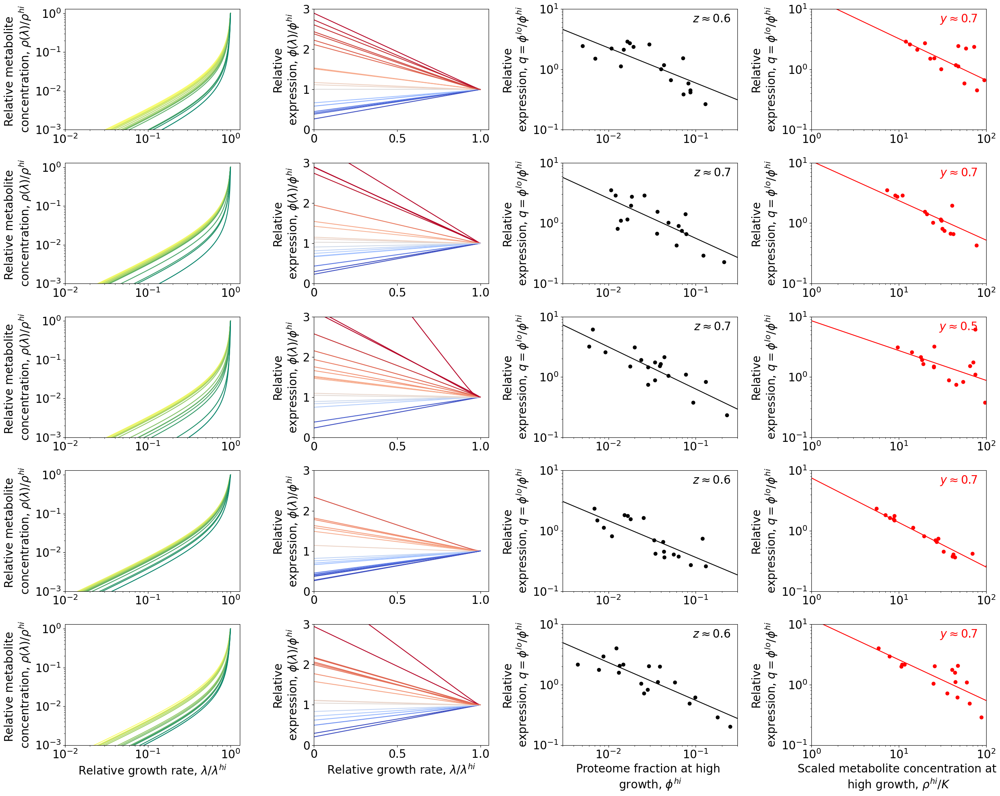

In [70]:
### Extended Data Figure 5 
eps = 0.05

font = {'size'   : 20} #30
plt.rc('font', **font)
fig, axs = plt.subplots(5, 4, figsize = (25, 20))

cmplasma = plt.cm.get_cmap('plasma')
cmInferno = plt.cm.get_cmap('Oranges')
cmYlGn = plt.cm.get_cmap('YlGn_r')


betas = ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]/(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])/(1+ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])


allbetas = np.logspace(-np.log10(Nenzymes), 0, 100)
rhorichOverKM = 1/eps*4.2e-2
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
alllambdas = np.logspace(-.2, np.log10(1-eps), 100)

coolwarm = plt.cm.get_cmap('coolwarm')
summer = plt.cm.get_cmap('summer_r')
corrcoeffs = np.mean((np.log(fullensemble[:, 0, 1, 1:])-np.mean(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)[:, None])*(np.log(fullensemble[:, 0, 0, 1:])-np.mean(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)[:, None]), axis = 1)/np.std(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)/np.std(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)
for i in range(5):
    j = random.choice(np.where((corrcoeffs>0.2)*(corrcoeffs<0.4))[0])
    print(j)
    #j = [2901, 3990, 1542, 1421, 2185, 4913][i]
    for q in np.arange(18)+1:
        fc = fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q]
        color = coolwarm(np.log2(fc)/3+1/2)
        color2 = summer(((q+2)/20)**2)
        axs[i, 1].plot(fullensemble[j, :, 5, q]/fullensemble[j, 0, 5, q], fullensemble[j, :, 4, q]/fullensemble[j, 0, 4, q], color = color)
        axs[i, 0].plot(fullensemble[j, :, 5, q]/fullensemble[j, 0, 5, q], fullensemble[j, :, 3, q]/fullensemble[j, 0, 3, q], color = color2)
        axs[i, 2].scatter(fullensemble[j, 0, 4, q], fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q], color = "k")
        axs[i, 3].scatter(fullensemble[j, 0, 3, q]/fullensemble[j, 0, 1, q], fullensemble[j, -1, 4, q]/fullensemble[j, 0, 4, q], color = "r")

    
    xs = np.linspace(-10, 10, 100)
    slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 4, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
    axs[i, 2].plot(np.exp(xs), np.exp(slope*xs+intercept), "k-")
    #axs[i, 2].plot(np.exp(xs+np.nanmean(np.log(fullensemble[j, 0, 4, :-1]))), np.exp(-1/2*xs+np.nanmean(np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))), color = "k", linestyle = "--", alpha = 0.5)
    axs[i, 2].text(2.5e-1, 6, r"$z \approx $"+"%.1f"%(-slope), horizontalalignment='right')
    
    xs = np.linspace(-10, 10, 100)
    slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 3, :-1]/fullensemble[j, 0, 1, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
    axs[i, 3].plot(np.exp(xs), np.exp(slope*xs+intercept), "r-")
    #axs[i, 3].plot(np.exp(xs+np.nanmean(np.log(fullensemble[j, 0, 3, :-1]/fullensemble[j, 0, 1, :-1]))), np.exp(-1*xs+np.nanmean(np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))), color = "r", linestyle = "--", alpha = 0.5)
    axs[i, 3].text(8e1, 6, r"$y \approx $"+"%.1f"%(-slope), color = "r", horizontalalignment='right')
    
    axs[i, 1].set_xlim(0, 1.05)
    axs[i, 1].set_ylim(0, 3)
    axs[-1, 1].set_xlabel("Relative growth rate, "+r"$\lambda/\lambda^{hi}$")
    axs[i, 1].set_ylabel("Relative\n expression, "+r"$\phi(\lambda)/\phi^{hi}$  ")
    axs[i, 1].set_xticks([0.0, 0.5, 1.0])
    axs[i, 1].set_xticklabels([0, 0.5, 1.0])
    axs[i, 0].set_xlim(1e-2, 1.3)
    axs[i, 0].set_ylim(1e-3, 1.3)
    axs[i, 0].set_xscale("log")
    axs[i, 0].set_yscale("log")
    axs[i, 2].set_xlim(3e-3, 3e-1)
    axs[i, 2].set_ylim(1e-1, 1e1)
    axs[i, 2].set_xscale("log")
    axs[i, 2].set_yscale("log")
    axs[-1, 2].set_xlabel("Proteome fraction at high \ngrowth, "+r"$\phi^{hi}$")
    axs[i, 2].set_ylabel("Relative\nexpression, "+r"$q = \phi^{lo}/\phi^{hi}$")
    axs[-1, 0].set_xlabel("Relative growth rate, "+r"$\lambda/\lambda^{hi}$")
    axs[i, 0].set_ylabel("Relative metabolite \nconcentration, "+r"$\rho(\lambda)/\rho^{hi}$")
    axs[i, 3].set_xlim(1e0, 1e2)
    axs[i, 3].set_ylim(1e-1, 1e1)
    axs[i, 3].set_xscale("log")
    axs[i, 3].set_yscale("log")
    axs[-1, 3].set_xlabel("Scaled metabolite concentration at \nhigh growth, "+r"$\rho^{hi}/K$")
    axs[i, 3].set_ylabel("Relative\nexpression, "+r"$q = \phi^{lo}/\phi^{hi}$")

fig.tight_layout()
#plt.savefig("RobustPredictions.pdf", bbox_inches="tight", format = 'pdf')


-0.4693705758942934 -0.6451950369698306


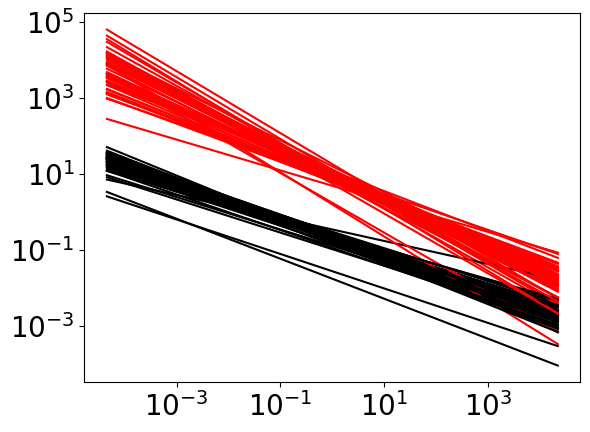

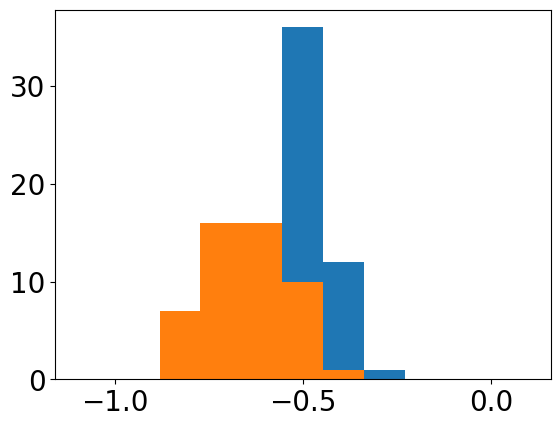

In [72]:
#Compute all slopes of the anticorrelation laws for all parameterizations in the simulation
phislopes = []
rhoslopes = []
for n in np.arange(50):
    j = random.choice(np.where(np.abs(corrcoeffs)<0.1)[0])
    slope, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 4, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
    plt.plot(np.exp(xs), np.exp(slope*xs+intercept), "k-")
    phislopes.append(slope)
    slope2, intercept2, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 3, :-1]/fullensemble[j, 0, 1, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
    plt.plot(np.exp(xs), np.exp(slope2*xs+intercept2), "r-")
    rhoslopes.append(slope2)
plt.xscale("log")
plt.yscale("log")
plt.figure()
phislopes = np.array(phislopes)
plt.hist(phislopes, bins = np.linspace(-1.1, 0.1, 12))
plt.hist(rhoslopes, bins = np.linspace(-1.1, 0.1, 12))
print(np.nanmean(phislopes), np.nanmean(rhoslopes))

(5000, 19)


Text(0.3, 0.11, '$q = 10^2$')

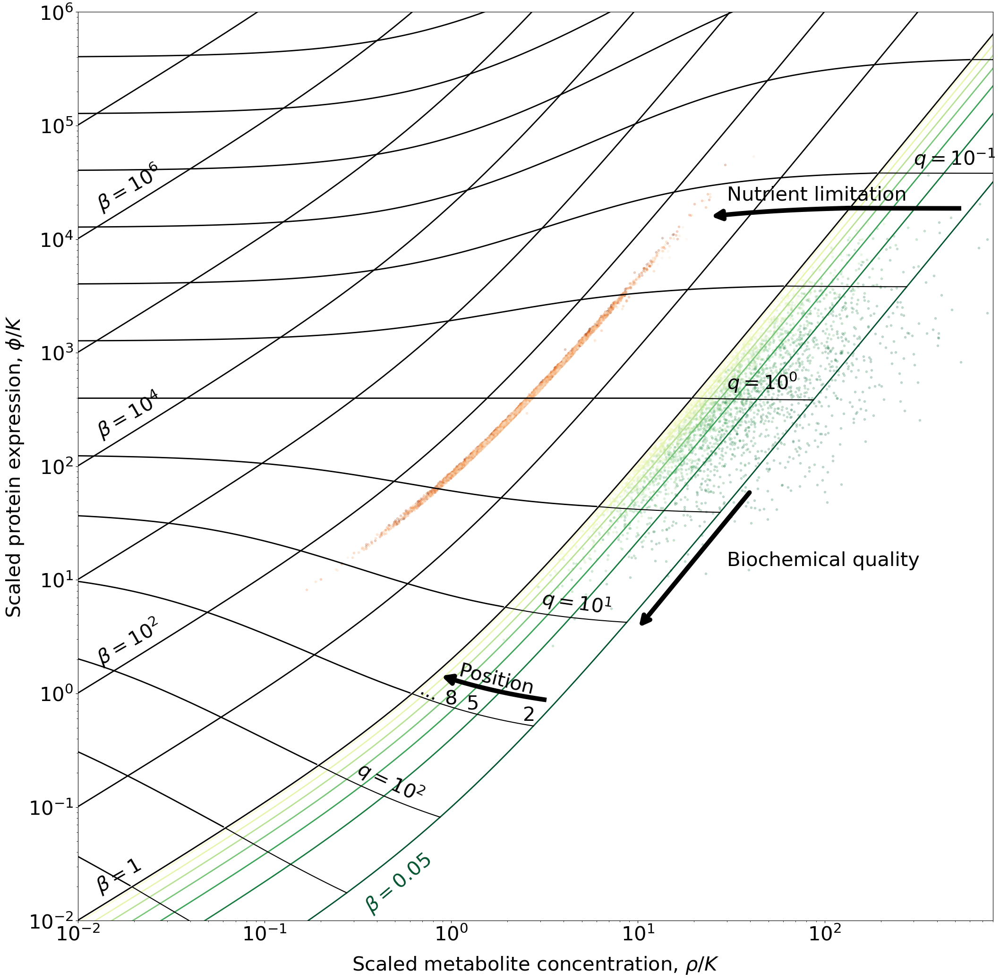

In [74]:
### Extended Data Figure 4
eps = 0.05

fig, axs = plt.subplots(2, 2, figsize = (25, 25))
font = {'size'   : 30} #20
plt.rc('font', **font)
cmplasma = plt.cm.get_cmap('plasma')
cmInferno = plt.cm.get_cmap('Oranges')
cmYlGn = plt.cm.get_cmap('YlGn_r')

for ax in axs.flatten():
    ax.axis("off")

gs = fig.add_gridspec(11, 11)
#gs = gridspec.GridSpec(13, 13)
gs.update(wspace=0, hspace=0)

axs[0, 0] = plt.subplot(gs[:, :])

ax0 = axs[0, 0]
Nenzymes = 20
for i in range(Nenzymes-1):
    for q in range(np.shape(ensemble)[0])[:200]: #display only a subset of points to ensure individual visibility
        ax0.set_xlim(1e-2, 8e2)
        ax0.scatter(ensemble[q, 0, 3, 0, i]/ensemble[q, 0, 1, 0, i], ensemble[q, 0, 4, 0, i]/ensemble[q, 0, 1, 0, i], marker = ".", color = cmYlGn((Nenzymes-i)/Nenzymes), alpha = 0.2)  
        ax0.scatter(ensemble[q, 1, 3, 0, i]/ensemble[q, 1, 1, 0, i], ensemble[q, 1, 4, 0, i]/ensemble[q, 1, 1, 0, i], marker = ".", color = cmInferno((Nenzymes-i)/Nenzymes), alpha = 0.2) 
        #ax0.scatter(ensemble[q, 1, 3, 0, i]/ensemble[q, 0, 1, 0, i], ensemble[q, 1, 4, 0, i]/ensemble[q, 0, 1, 0, i], marker = ".", color = cmInferno((Nenzymes-i)/Nenzymes), alpha = 0.2)
#ax0.scatter(ensemble[q, 0, 3, 0, 10:-1]/ensemble[q, 0, 1, 0, 10:-1], ensemble[q, 0, 4, 0, 10:-1]/ensemble[q, 0, 1, 0, 10:-1], marker = ".", color = cmplasma(15/20), alpha = 0.4, label = r"Catabolism, $i<\ell/2$")   
#ax0.scatter(ensemble[q, 0, 3, 0, :10]/ensemble[q, 0, 1, 0, :10], ensemble[q, 0, 4, 0, :10]/ensemble[q, 0, 1, 0, :10], marker = ".", color = cmplasma(5/20), alpha = 0.4, label = r"Anabolism, $i>\ell/2$")   

#lgnd = ax0.legend(handletextpad=-0.2, loc = "upper left")
#lgnd.legendHandles[0]._sizes = [100]
#lgnd.legendHandles[1]._sizes = [100]
ax0.set_xlim(1e-2, 8e2)
ax0.set_ylim(1e-2, 1e6)
ax0.set_ylabel(r"Scaled protein expression, $\phi/K$")
ax0.set_xlabel(r"Scaled metabolite concentration, $\rho/K$", labelpad = 15)
ax0.set_yscale("log")
ax0.set_xscale("log")
#ax0.plot(np.logspace(-2, 4, 100), np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), "k-", linewidth = 2)
#ax0.plot(np.logspace(-2, 4, 100), 0.1*np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), "--", color = cmplasma(5/20), linewidth = 2)

betas = ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]/(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])/(1+ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])
print(np.shape(betas))

for i in [2, 5, 8, 11, 14, 17, 20]:
    axs[0, 0].plot(np.logspace(-2, 4, 100), (i-1)/20*np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), color = cmYlGn(((i-1))/Nenzymes), linewidth = 2)
   
for beta in np.logspace(0, 7, 8):
    axs[0, 0].plot(np.logspace(-2, 4, 100), beta*np.logspace(-2, 4, 100)*(1+np.logspace(-2, 4, 100)), color = "k", linewidth = 2)
    
allbetas = np.logspace(-np.log10(Nenzymes), 0, 100)
for rhorichOverKM in 1/eps*np.logspace(-3, 3, 13):
    rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
    axs[0, 0].plot(rhoOverKM, allbetas*rhoOverKM*(rhoOverKM+1), "k-")
    
alllambdas = np.logspace(-5, np.log10(1-eps), 1000)
for rhorichOverKM in 1/eps*np.logspace(-3, 3, 13):
    allbetas = ((1-alllambdas)/(np.sqrt(alllambdas)*eps))**2
    rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(alllambdas)
    axs[0, 0].plot(rhoOverKM, allbetas*rhoOverKM*(rhoOverKM+1), "k-", linewidth = 2)
    

allbetas = np.logspace(-np.log10(Nenzymes), 0, 100)
rhorichOverKM = 1/eps*4.2e-2
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
axs[0, 0].plot(rhoOverKM[10:-15], (allbetas*rhoOverKM*(rhoOverKM+1))[10:-15], "k-", linewidth = 7)
axs[0, 0].annotate('', xy=(rhoOverKM[-5], (allbetas*rhoOverKM*(rhoOverKM+1))[-5]), xytext=(rhoOverKM[-15], (allbetas*rhoOverKM*(rhoOverKM+1))[-15]), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 7, linestyle = "-"))
axs[0, 0].text(1, 1, " Position", rotation = -14)


rhorichOverKM = 1/eps*7
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(1-eps)
axs[0, 0].plot(rhoOverKM[10:], (allbetas*rhoOverKM*(rhoOverKM+1))[10:], "k-", linewidth = 7)

alllambdas = np.logspace(-.2, np.log10(1-eps), 100)
rhorichOverKM = 1/eps*7
allbetas = ((1-alllambdas)/(np.sqrt(alllambdas)*eps))**2
rhoOverKM = rhorichOverKM*np.sqrt(1/allbetas)*np.sqrt(alllambdas)
axs[0, 0].plot(rhoOverKM[60:], (allbetas*rhoOverKM*(rhoOverKM+1))[60:], "k-", linewidth = 7)
axs[0, 0].annotate('', xy=(rhoOverKM[50], (allbetas*rhoOverKM*(rhoOverKM+1))[50]), xytext=(rhoOverKM[60], (allbetas*rhoOverKM*(rhoOverKM+1))[60]), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 7, linestyle = "-"))
axs[0, 0].text(30, 2.2e4, r"Nutrient limitation")

axs[0, 0].annotate('', xy=(10, 15/4), xytext=(40, 60), arrowprops=dict(arrowstyle="->", color='k', linewidth = 7, linestyle = "-"))
axs[0, 0].text(90/3, 120/9, "Biochemical quality")

axs[0, 0].text(0.012, 0.018, r"$\beta = 1$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.012, 1.8, r"$\beta = 10^2$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.012, 180, r"$\beta = 10^4$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.012, 18000, r"$\beta = 10^6$", rotation = 30, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.33, 0.012, r"$\beta = 0.05$", rotation = 40, size = 30, color=cmYlGn(1/20))

#2, 5, 8, 11, 14, 17, 20
axs[0, 0].text(2.4, 0.58, r"$2$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(1.2, 0.73, r"$5$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.92, 0.81, r"$8$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(0.65, 0.86, r"...", rotation = -25, color = "k", size = 30)#color=cmplasma(18/20))

axs[0, 0].text(3e2, 4.5e4, r"$q = 10^{-1}$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(3e1, 4.8e2, r"$q = 10^0$", rotation = 0, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(3e0, 5, r"$q = 10^1$", rotation = -8, color = "k", size = 30)#color=cmplasma(18/20))
axs[0, 0].text(3e-1, 1.1e-1, r"$q = 10^2$", rotation = -25, color = "k", size = 30)

#plt.savefig("BigSquare.pdf", bbox_inches="tight", format = 'pdf')

In [80]:
#Import of simulated data for SI figures
Nenzymes = 20
filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)


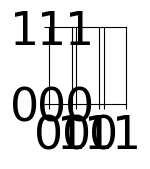

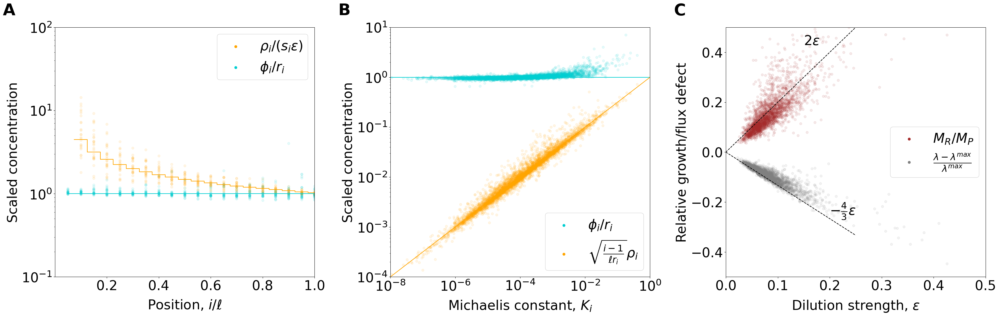

In [81]:
#Extended Data Figure 9
epsilons = np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), axis = 1)/np.sqrt(np.sum(1/fullensemble[:, 0, 0, :], axis = 1))
lammax = 1/np.sum(1/fullensemble[:, 0, 0, :], axis = 1)

font = {'size'   : 33} #20
plt.rc('font', **font)

fig, axs = plt.subplots(1, 3, figsize = (1, 1))
fig = plt.figure(figsize = (35, 11))
gs = gridspec.GridSpec(1, 3)
#gs.update(wspace=0.2, hspace=0.2)

axs[0] = plt.subplot(gs[0, 0])
axs[1] = plt.subplot(gs[0, 1])
#ax00 = axs[0].twinx()
#ax01 = axs[1].twinx()
axs[2] = plt.subplot(gs[0, 2])

positions = np.arange(20)[::-1]+1
newaxis = np.zeros(np.shape(fullensemble)[0])
pos, axis = np.meshgrid(positions, newaxis)
si = ((np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]).T)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), axis = 1)).T
ri = (1/fullensemble[:, 0, 0, :].T/np.sum(1/fullensemble[:, 0, 0, :], axis = 1)).T
qi = (np.sqrt(fullensemble[:, 0, 0, :]*fullensemble[:, 0, 1, :]).T/(epsilons*np.sqrt(lammax))).T
#betai = fullensemble[:, 0, 4, :]/fullensemble[:, 0, 3, :]/(1+fullensemble[:, 0, 3, :]/fullensemble[:, 0, 1, :])
betai = np.arange(Nenzymes)[::-1]/Nenzymes
scaledrhos = ((fullensemble[:, 0, 3, :]/si).T/epsilons).T
scaledphis = fullensemble[:, 0, 4, :]/ri


axs[0].scatter(pos[::200, :]/Nenzymes, scaledrhos[::200], alpha = 0.1, color = "orange", label = r"$\rho_i/(s_i \epsilon)$")
axs[0].step(positions/Nenzymes, np.sqrt(Nenzymes/(positions-1)), color = "orange", where = "mid")
axs[0].scatter(pos[::200, :]/Nenzymes, scaledphis[::200], alpha = 0.1, color = "darkturquoise", label = r"$\phi_i/r_i$")
axs[0].step(positions/Nenzymes, 1+0*positions, color = "darkturquoise", where = "mid")
axs[0].set_xlim(0, 1)
axs[0].set_yscale("log")
axs[0].set_xlabel("Position, $i/\ell$", labelpad=15)
axs[0].set_ylabel("Scaled concentration")
axs[0].set_xticks([0.2, 0.4, 0.6, 0.8, 1])
axs[0].set_ylim(1e-1, 1e2)
axs[0].set_yticks([1e-1, 1e0, 1e1, 1e2])
leg = axs[0].legend(loc = "upper right")
for lh in leg.legendHandles: 
    lh.set_alpha(1)

    
axs[1].scatter(fullensemble[::20, 0, 1, :], fullensemble[::20, 0, 4, :]/ri[::20], alpha = 0.1, color = "darkturquoise", label = r"$\phi_i/r_i$")
axs[1].plot(np.logspace(-10, 0, 10), np.logspace(-10, 0, 10)**0, color = "darkturquoise")
    
#axs[0, 1].scatter((epsilons*qi.T).T, np.sqrt(betai)*fullensemble[:, 0, 3, :]/fullensemble[:, 0, 1, :], alpha = 0.01, color = "orange")
#axs[1].scatter((epsilons*si.T).T, np.sqrt(betai)*fullensemble[:, 0, 3, :], alpha = 0.01, color = "orange")
axs[1].scatter(fullensemble[::20, 0, 1, :], np.sqrt(betai/ri)[::20]*fullensemble[::20, 0, 3, :], alpha = 0.1, color = "orange", label = r"$\sqrt{\frac{i-1}{\ell r_i}}\rho_i$")
axs[1].plot(np.logspace(-10, 0, 10), np.sqrt(np.logspace(-10, 0, 10)), color = "orange")
axs[1].set_xscale("log")
axs[1].set_yscale("log")
axs[1].set_xlim(1e-8, 1e0)
axs[1].set_xlabel(r"Michaelis constant, $K_i$", labelpad=15)
axs[1].set_ylabel("Scaled concentration")
#axs[1].set_ylabel(r"$\sqrt{\frac{i-1}{\ell r_i}}\rho_i$")
axs[1].set_ylim(1e-4, 1e1)


leg = axs[1].legend(loc = "lower right")
for lh in leg.legendHandles: 
    lh.set_alpha(1)

axs[2].scatter(epsilons[::2], np.sum(fullensemble[::2, 0, 3, :-1], 1), alpha = 0.1, color = "brown", label = r"$M_R/M_P$")
axs[2].plot(np.linspace(0, 0.25, 10), 2*np.linspace(0, 0.25, 10), "k--")
axs[2].text(0.15, 0.43, r"$2\epsilon$", color = "k")

axs[2].scatter(epsilons[::2], fullensemble[::2, 0, 5, 0]*np.sum(1/fullensemble[::2, 0, 0, :], 1)-1, alpha = 0.1, color = "grey", label = r"$\frac{\lambda-\lambda^{max}}{\lambda^{max}}$")
axs[2].plot(np.linspace(0, 0.25, 10), -4/3*np.linspace(0, 0.25, 10), "k--")
axs[2].set_xlim(0, 0.5)
axs[2].set_ylim(-0.5, 0.5)
axs[2].set_xlabel(r"Dilution strength, $\epsilon$", labelpad=15)
axs[2].set_ylabel("Relative growth/flux defect")
axs[2].text(0.2, -0.25, r"$-\frac{4}{3}\epsilon$", color = "k")
#ax03 = axs[2].twinx()

leg = axs[2].legend(loc = "center right")
for lh in leg.legendHandles: 
    lh.set_alpha(1)

#ax03.set_xscale("log")
#ax03.set_yscale("log")
fig.tight_layout()

for n, ax in enumerate(axs.flatten()):  
    ax.text(-0.2, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold', size = 40)
    
#plt.savefig("SI_Marginals.pdf", bbox_inches="tight", format = 'pdf')

In [75]:
#Additional plot function for separate plotting of linearity of expression changes and correlation plots

anticorrelation = True
reverse = True
limitation = "Carbon"

def plotModules(limitation, anticorrelation, reverse):
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]
    
    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')
    nx = int(np.sqrt(len(gooddb)))
    ny = int(len(gooddb)/nx)+((len(gooddb)%nx)>0)
    fig, axs = plt.subplots(ny, nx, figsize = (35, 35))
    font = {'size'   : 25} #int(120/nx)} #20
    plt.rc('font', **font)
    plt.rcParams.update({'axes.titlesize': 25})
    
    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb))
    
    deviations = []
    basedeviations = []
    siglevels = []
    for n in range(ny*nx):
        if n<len(gooddb):
            path, unis = gooddb[sorting_list[n]]#[sorting_list[(n+1)%len(gooddb)]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            ax = axs.flatten()[n]
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1
            
            #print(locals)
            meansC = np.copy(means)
            meansC[mask] = np.nan
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            if anticorrelation:
                deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/xs)**2, axis = 1)
    
                if reverse:
                    scatterxs = localoffsets[deviation<0.05]
                    scatterys = xs[deviation<0.05, 0]/localoffsets[deviation<0.05]
                    ax.scatter(scatterxs, scatterys, color = "k")
                    ax.scatter(scatterxs[scatterys<0], (xs[deviation<0.05, 0]/xs[deviation<0.05, -1])[scatterys<0], color = "b", alpha = 0.2)
                    ax.scatter(xs[deviation>0.05, 0], xs[deviation>0.05, 0]/xs[deviation>0.05, -1], color = "r", alpha = 0.2)
                else:    
                    scatterxs = xs[deviation<0.05, 0]
                    scatterys = localoffsets[deviation<0.05]/xs[deviation<0.05, 0]
                    ax.scatter(scatterxs, scatterys, color = "k")
                    ax.scatter(scatterxs[scatterys<0], (xs[deviation<0.05, -1]/xs[deviation<0.05, 0])[scatterys<0], color = "b", alpha = 0.2)
                    ax.scatter(xs[deviation>0.05, 0], xs[deviation>0.05, -1]/xs[deviation>0.05, 0], color = "r", alpha = 0.2)
            
                allxs = np.linspace(-7, 7, 10)
                slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[scatterys>0]), np.log10(scatterys[scatterys>0]))
            
                #ax.text(2e-7, 7e-2, r"$\frac{d\ln \xi}{d \ln \phi^{hi}}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                    ax.text(2e-7, 7e-2, r"$z \approx 0$")
                else:
                    #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                    ax.text(2e-7, 7e-2, r"$z = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err)
                
                    ax.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-", alpha = 0.8)
                #ax.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1/2*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
                
                #print(name, "%.3f"%slope,r_value, p_value, std_err)
                #ax.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-")
                #siglevels.append(slope/std_err)
                siglevels.append(np.log10(p_value)*slope/np.abs(slope))
    
            else:
                for i in range(len(xs)):
                    color = cmjet(np.random.uniform())
                    #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
                    deviation = np.mean((((localoffsets[i]+localslopes[i]*grs)-xs[i])/xs[i])**2)
                    basedeviation = np.mean(((np.mean(xs[i])-xs[i])/xs[i])**2)
                    deviations.append(deviation)
                    basedeviations.append(basedeviation)
                    if deviation<0.1:
                        ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                        if deviation/basedeviation < 0.5:
                            ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                        else:
                            ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color, linestyle = "--")
                        if ys[i]<3 and ys[i]>0:
                            ax.text(0.02+0.14*(rankdata(ys)[i]%2), 1+(ys[i]-1)*0.85-0.03, localnames[i][0], alpha = 0.9-0.2*(rankdata(ys)[i]%2))
                    else:
                        ax.scatter(grs, xs[i]/xs[i][0], color = color)
                    #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = (rich[i], 2*rich[i], 1, 0.9-0.5*(rankdata(ys)[i]%2)))
                    #ax.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = (rich[i], 2*rich[i], 1, 0.9-0.3*(rankdata(ys)[i]%2)))#color = ((1-rankdata(ys)[i]%2)/4, (1+(rankdata(ys)[i]%2))*rich[i], 1, 0.9-0.5*(rankdata(ys)[i]%2)))
                    
            if len(name)<40:
                ax.set_title(name)
            else:
                ax.set_title(name[:38]+"...")
    
        else: 
            ax = axs.flatten()[n]
            ax.axis("off")
        
        if anticorrelation:
            ax.set_ylim(0.03, 30)
            ax.set_xlim(1e-7, 1e-1)
            ax.set_xscale("log")
            ax.set_yscale("log")
        else:
            ax.set_ylim(0, 3)
            ax.set_xlim(0, 1)
            
        if n not in np.arange(ny)*nx:
            ax.set_yticklabels([])
        if n in np.arange(len(gooddb)-nx):
            ax.set_xticklabels([])
    
    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    if anticorrelation:
        coolwarm = plt.cm.get_cmap('coolwarm')
        siglevels = np.array(siglevels)
        siglevels[np.abs(siglevels)>10] = 0
        #colors = siglevels/np.nanmax(np.abs(siglevels))/2+1/2
        colors = siglevels/5/2+1/2
        colors[colors>1] = 1
        colors[colors<0] = 0
        colors[np.isnan(colors)] = 1/2
        #print(siglevels, colors)
        for n in range(len(gooddb)):
            ax = axs.flatten()[n]
            #ax.set_facecolor(coolwarm(colors[n]))
    
        if reverse:
            plt.xlabel(r"Proteome fraction in a nutrient poor environment, $\phi^{lo}$")
            plt.ylabel(r"Relative expression change under nutrient addition, $\hat q^{-1} = \phi^{hi}/\phi^{lo}$")
            fig.tight_layout()
            #plt.savefig("AllAnticorrelations_%s_modules_reverse.pdf"%limitation)
    
        else:
            plt.xlabel("Proteome fraction in a nutrient rich environment")
            plt.ylabel("Expression fold-change under nutrient limitation")
            fig.tight_layout()
            #plt.savefig("AllAnticorrelations_%s_modules.pdf"%limitation)
    else:
        plt.xlabel("Growth rate [1/h]")
        plt.ylabel("Relative expression")
        fig.tight_layout()
        #plt.savefig("AllFoldchanges_%s_modules.pdf"%limitation)

    return 

['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
-0.12831751370295258 1.254022141712238e-42
35
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
-0.12831751370295258 1.254022141712238e-42
35
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
-0.12831751370295258 1.254022141712238e-42
35


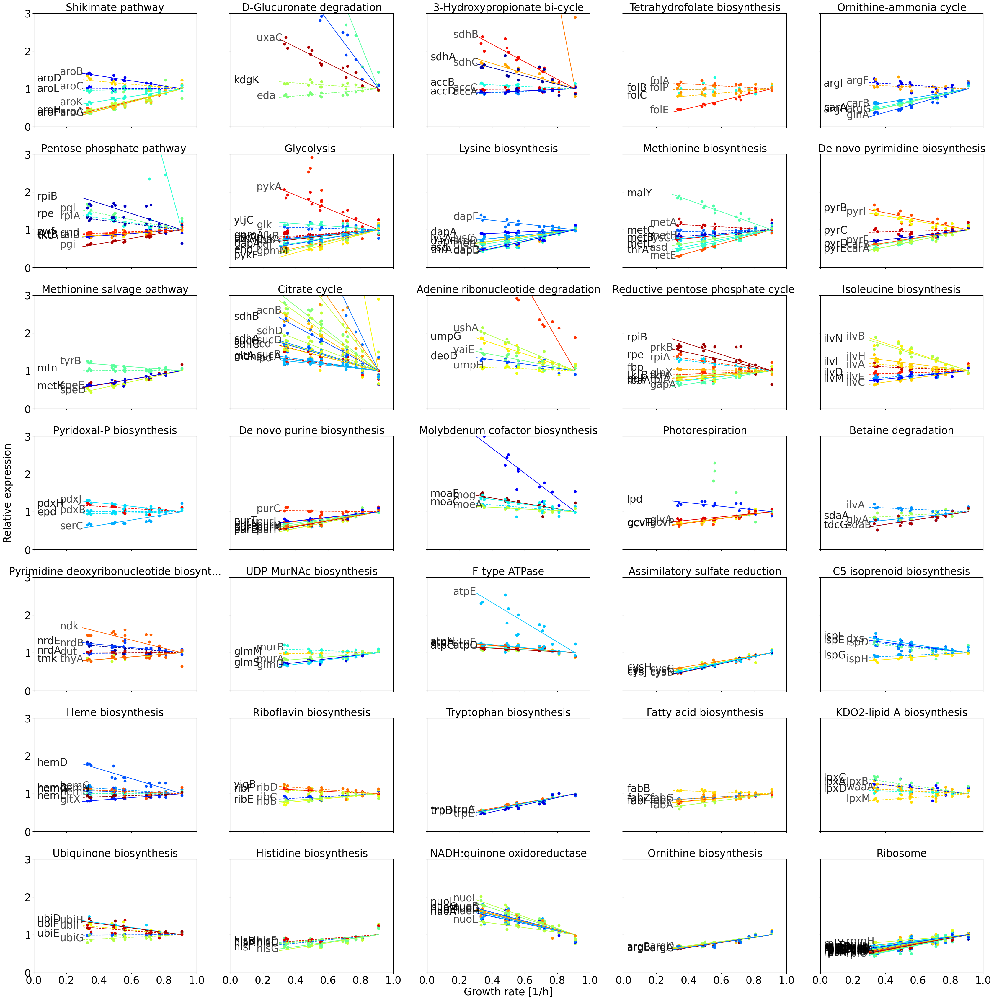

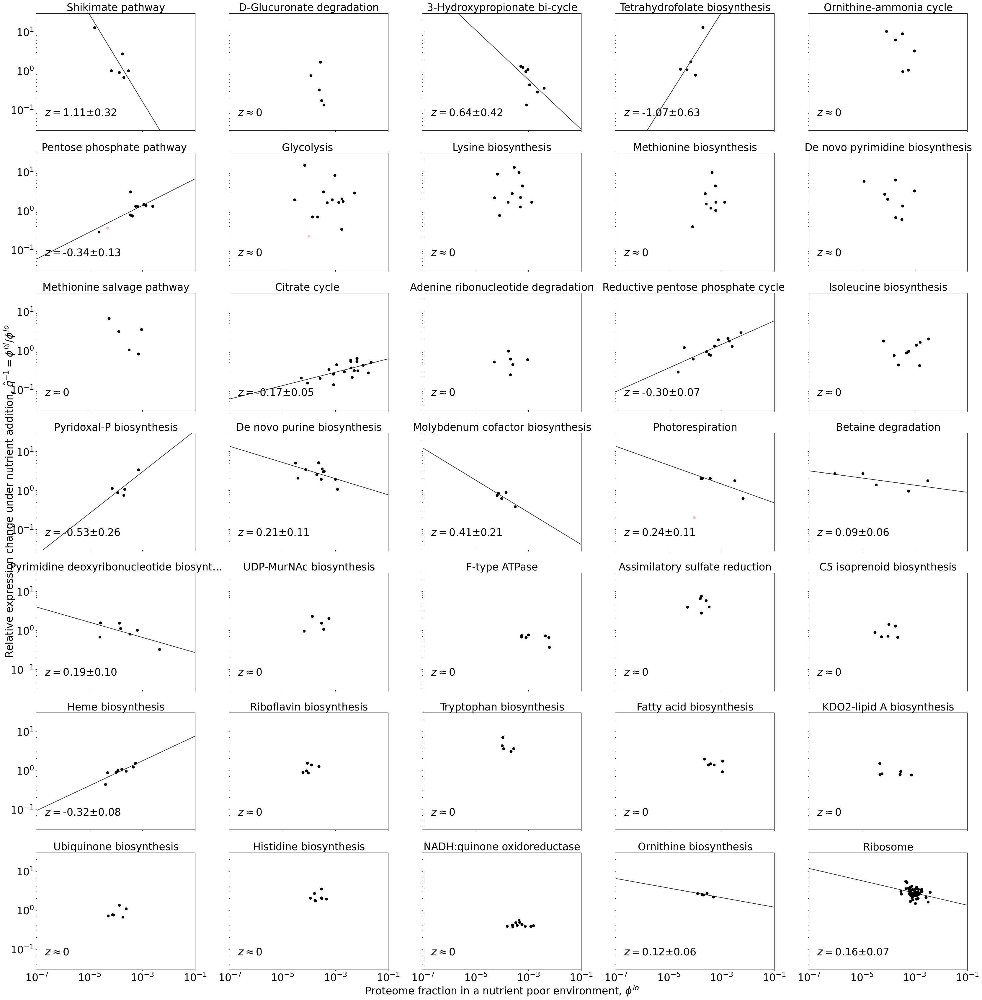

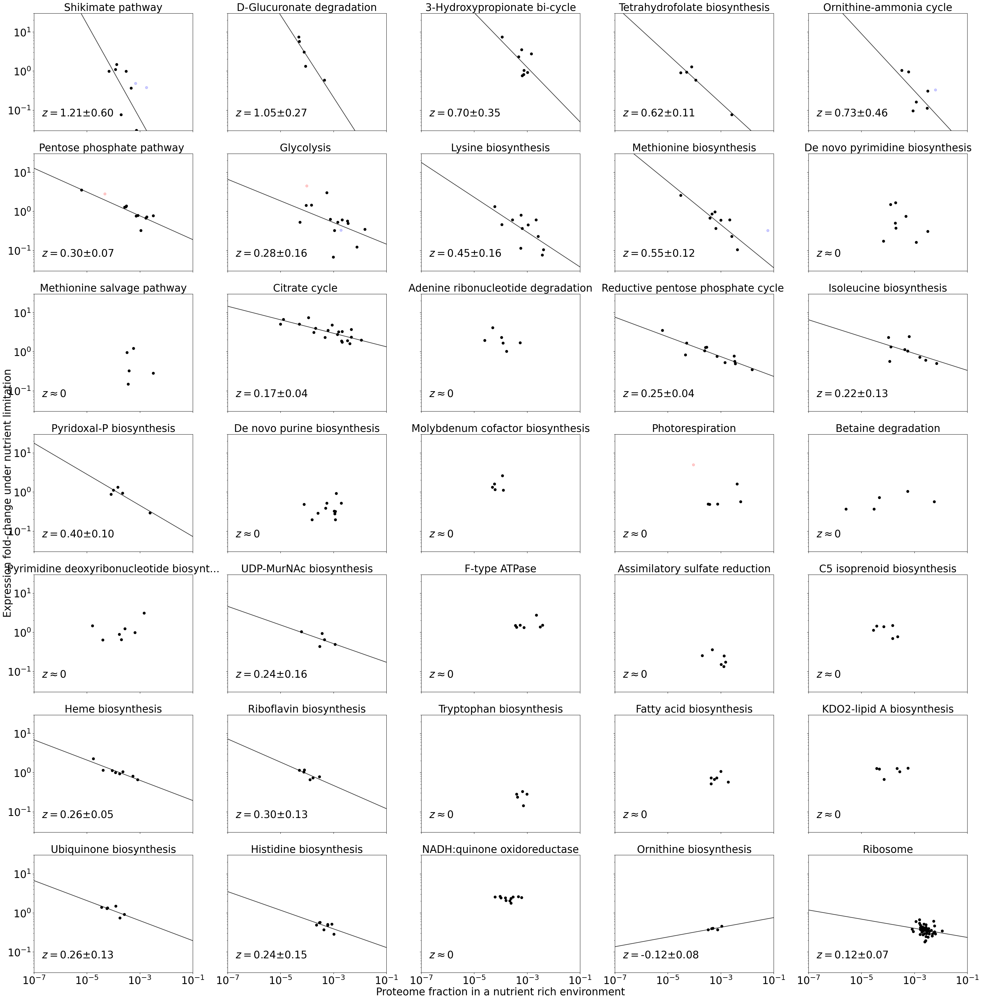

In [2255]:
# Code for Extended Data Figure 6 among other illustrations of the same type
# plots of anticorrelations for carbon limitation, including under exchange of high and low growth conditions for statistical testing
for limitation in ["Carbon"]:
    for anticorrelation in [False, True]:
        if anticorrelation:
            for reverse in [True, False]:
                plotModules(limitation, anticorrelation, reverse)
        else:
            plotModules(limitation, anticorrelation, reverse = False)

In [86]:
#scatterplots with the matched metabolomics data to identify pathways with more than 4 proteins with additionally detected metabolites.

anticorrelation = True
reverse = True
limitation = "Carbon"

def plotAnticorrelationFigure_Metabolites(limitation, short = False, sigma = sigma):
    allscatterqs_proteome = []
    allscatterqs_proteome_estimate = []
    scatterqs_proteome = []
    scatterqs_proteome_estimate = []
    scatterqs_metabolome = []
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb))

    
    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')
    if short:
        nx = 3
        ny = 3
        font = {'size'   : int(25)}
        plt.rc('font', **font)
        plt.rcParams.update({'axes.titlesize': int(25)})
        fig, axs = plt.subplots(ny, 2*nx, figsize=(35, 15)) ### replace this by gridspec
        
    else:
        nx = int(np.sqrt(len(gooddb))/2)+2
        ny = int(len(gooddb)/nx)+((len(gooddb)%nx)>0)
        font = {'size'   : int(60/nx)} #20
        plt.rc('font', **font)
        plt.rcParams.update({'axes.titlesize': int(60/nx)})
        fig, axs = plt.subplots(ny, 2*nx, figsize = (35, 30))
    
    deviations = []
    basedeviations = []
    siglevels = []
    for n in range(ny*nx):
        if n<len(gooddb):
            if short: #This is not used when determining which pathways are suitable
                Bpathways = Pathways_metabolome
                allpathways = np.array([x[0] for x in gooddb])
                path = Bpathways[n]
                nlocal = np.where(allpathways == path)[0][0]
                unis = gooddb[nlocal][1]
            else:
                path, unis = gooddb[sorting_list[n]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            ax1 = axs.flatten()[2*n]
            ax2 = axs.flatten()[2*n+1]
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1

            #print(locals)
            meansC = np.copy(means)
            meansC[mask] = np.nan

            localconcs = np.copy(concs)[~np.isnan(meansC)]#*0+1e-3
            localKMs = np.copy(KMs)[~np.isnan(meansC)]
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)
            
            oldscatterxs = localoffsets[deviation<(3*sigma)**2]+np.max(grs)*localslopes[deviation<(3*sigma)**2]#xs[deviation<0.05, 0]
            scatterxs = (localconcs/localKMs)[deviation<(3*sigma)**2]
            scatterys = localoffsets[deviation<(3*sigma)**2]/xs[deviation<(3*sigma)**2, 0]

            if len(scatterxs[~np.isnan(scatterxs)])>=5:
                print(name, path)
                #for sc in range(len(scatterxs[~np.isnan(scatterxs)])):
                #    scatterqs_proteome.append(np.exp(np.log(scatterys[~np.isnan(scatterxs)][sc])-np.nanmean(np.log(scatterys[~np.isnan(scatterxs)]))))
                #    scatterqs_metabolome.append(1/np.exp(np.log(scatterxs[~np.isnan(scatterxs)][sc])-np.nanmean(np.log(scatterxs[~np.isnan(scatterxs)]))))
                scatterqs_proteome.append(np.exp(np.log(scatterys[~np.isnan(scatterxs)])-np.nanmean(np.log(scatterys[~np.isnan(scatterxs)]))))
                scatterqs_proteome_estimate.append(np.exp(np.log(oldscatterxs[~np.isnan(scatterxs)])-np.nanmean(np.log(oldscatterxs[~np.isnan(scatterxs)]))))
                scatterqs_metabolome.append(1/np.exp(np.log(scatterxs[~np.isnan(scatterxs)])-np.nanmean(np.log(scatterxs[~np.isnan(scatterxs)]))))
            
            allscatterqs_proteome.append(np.exp(np.log(scatterys[~np.isnan(scatterys)])-np.nanmean(np.log(scatterys[~np.isnan(scatterys)]))))
            allscatterqs_proteome_estimate.append(np.exp(np.log(oldscatterxs[~np.isnan(scatterys)])-np.nanmean(np.log(oldscatterxs[~np.isnan(scatterys)]))))
                
            #print(len(scatterxs), len(scatterys))
            if True:
                ax2.scatter(scatterxs[scatterys>0], scatterys[scatterys>0], color = "r")
                if not short:
                    ax2.scatter(scatterxs[scatterys<0], (xs[deviation<(3*sigma)**2, -1]/xs[deviation<(3*sigma)**2, 0])[scatterys<0], color = "r", alpha = 0.5, marker = "+")
                    ax2.scatter(xs[deviation>(3*sigma)**2, 0], xs[deviation>(3*sigma)**2, -1]/xs[deviation>(3*sigma)**2, 0], color = "r", alpha = 0.2, marker = "x")
                allxs = np.linspace(-7, 7, 10)
                try:
                    slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[(scatterys>0)*(~np.isnan(scatterxs))]), np.log10(scatterys[(scatterys>0)*(~np.isnan(scatterxs))]))
                    #ax2.text(2e-4, 7e-2, r"$\frac{d\ln \xi}{d \ln (\rho_i/K_i)}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                    if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                        ax2.text(2e-3, 7e-2, r"$\tilde{z} \approx 0$")
                    else:
                        #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                        ax2.text(2e-3, 7e-2, r"$\tilde{z} = $"+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
            
                        
                    #print(name, "%.3f"%slope,r_value, p_value, std_err)
                    ax2.plot(10**(allxs), 10**(slope*allxs+intercept), color = "r", linestyle = "-", alpha = 0.8)
                    print(slope, std_err)
                except:
                    print("no data")
                ax2.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
                #print(scatterxs, scatterys)
                #siglevels.append(slope/std_err)
                #siglevels.append(np.log10(p_value)*slope/np.abs(slope))
    
                labelsx = [0]
                labelsy = [0]
                for i in range(len(xs)):
                    color = cmjet(np.random.uniform())
                    #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
                    deviation = np.mean((1-xs[i]/(localoffsets[i]+localslopes[i]*grs))**2)
                    deviations.append(deviation)
                    if deviation<(3*sigma)**2:
                        ax1.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                        ax1.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color, linestyle = "-")
                        if ys[i]<3 and ys[i]>0:
                            labelx = 0.02+0.14*(rankdata(ys)[i]%2)
                            labely = 1+(ys[i]-1)*0.85-0.03
                            if not short:
                                if np.min(100*(np.array(labelsx)-labelx)**2+(np.array(labelsy)-labely)**2)>0.01:
                                    labelsx.append(labelx) 
                                    labelsy.append(labely)
                                    ax1.text(labelx, labely, localnames[i][0], alpha = 0.7, fontsize = int(10+short*7))
                            #else:
                            #    ax1.text(labelx+0.1, labely, "...", alpha = 0.7, fontsize = 20)
                    else:
                        ax1.scatter(grs, xs[i]/xs[i][0], color = color)
                       
                if len(name)<60:
                    ax1.set_title(name, loc = "left")
                else:
                    ax.set_title(name[:58]+"...")
    
                ax1.scatter(grs, np.nansum(xs, axis = 0)/np.nansum(localoffsets+localslopes*grs[0], axis = 0), color = "k", zorder = 500)
                ax1.plot(np.linspace(0.3, grs[0], 5), (np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*np.linspace(0.3, grs[0], 5))/(np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*grs[0]), color = "k", linestyle = "--", linewidth = 3)
        
                
            else:
                print("boolean index mismatch")
            
            
        else: 
            axs.flatten()[2*n].axis("off")
            axs.flatten()[2*n+1].axis("off")

        try:
            ax2.set_ylim(0.03, 30)
            ax2.set_xlim(1e-3, 1e4)
            ax2.set_xscale("log")
            ax2.set_yscale("log")
    
            ax1.set_ylim(0, 3)
            ax1.set_xlim(0, 1)
            ax1.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
                
            if n in np.arange(ny)*nx:
                ax1.set_ylabel(r"$\phi/\phi^{hi}$")
    
            if not short:
                if n in np.arange(len(gooddb)*(1-short)+18*short-nx):
                    ax1.set_xticklabels([])
                    ax2.set_xticklabels([])
                else:
                    ax1.set_xticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
                    ax1.set_xlabel(r"Growth rate $\lambda$ [1/h]")
                    ax2.set_xlabel(r"$\rho^{hi}/K$")
            else:
                if n in np.arange(nx*(ny-1)):
                    ax1.set_xticklabels([])
                    ax2.set_xticklabels([])
                else:
                    ax1.set_xticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
                    ax1.set_xlabel(r"Growth rate $\lambda$ [1/h]")
                    ax2.set_xlabel(r"$\rho^{hi}/K$")
        except:
            print("data could not be scaled")

    for ax in axs.flatten():
        ax.scatter([1, 1], [1, 1], s = 0.01)
    
    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)

    coolwarm = plt.cm.get_cmap('coolwarm')
    siglevels = np.array(siglevels)
    siglevels[np.abs(siglevels)>10] = 0
    #colors = siglevels/np.nanmax(np.abs(siglevels))/2+1/2
    colors = siglevels/5/2+1/2
    colors[colors>1] = 1
    colors[colors<0] = 0
    colors[np.isnan(colors)] = 1/2
    #print(siglevels, colors)
    #for n in range(len(gooddb)):
        #ax = axs.flatten()[2*n+1]
        #ax.set_facecolor(coolwarm(colors[n]))
        
    fig.tight_layout()
    #if short:
        #plt.savefig("4Pathways_CarbonLimitation_Metabolites.pdf", bbox_inches="tight", format = 'pdf')
    #else:
        #plt.savefig("AllPathways_CarbonLimitation_Metabolites.pdf", bbox_inches="tight", format = 'pdf')
    #print(siglevels)
    #print(np.log10(0.05))
    #print(np.sum(siglevels>-np.log10(0.05)))
    return scatterqs_metabolome, scatterqs_proteome, scatterqs_proteome_estimate, allscatterqs_proteome, allscatterqs_proteome_estimate
    

-0.12831751370295258 1.254022141712238e-42
30
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
Shikimate pathway md:eco_M00022
-0.4643806785739259 0.1299528227205982
no data
nan nan
Pentose phosphate pathway  md:eco_M00004
-0.4363962456863402 0.11314999201743259
0.6858853182710057 0.3401279705037205
Lysine biosynthesis md:eco_M00016
-1.0104922296673058 0.5557977604695223
Methionine biosynthesis md:eco_M00017
0.0068091474822376315 0.40656345040657255
De novo pyrimidine biosynthesis md:eco_M00051
-0.3092788410957457 0.1359216410569559
Citrate cycle  md:eco_M00009
-0.1857077259613624 0.2405179551441885
Adenine ribonucleotide degradation md:eco_M00958
0.30633231181765586 0.08994423544052453
-0.1102148627660097 0.0
no data
0.317962291538904 0.13349917028604041
no data
no data
0.10717749110425778 0.13465005340898528
no data
nan nan
nan nan
nan nan
no data
-0.14979988180685752 0.058965723073348075
no data
nan nan
no data
nan nan
nan nan
no data
0.0445

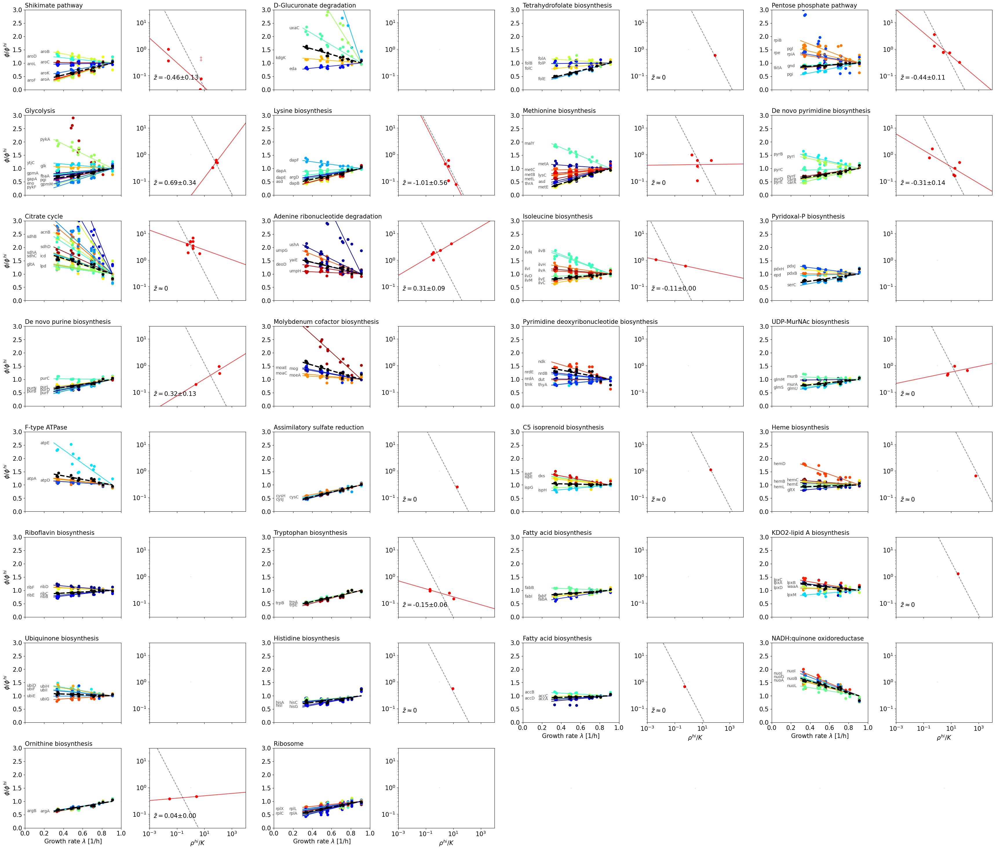

In [88]:
#Full length figure for the metabolome including pathways with fewer than 5 proteins
scatterqs_metabolome, scatterqs_proteome, scatterqs_proteome_estimate, allscatterqs_proteome, allscatterqs_proteome_estimate = plotAnticorrelationFigure_Metabolites("Carbon", short = False)

In [90]:
#metabolic pathways with more than 5 suitable proteins for metabolomics analysis (see below for code generating this list):
Pathways_metabolome = ["md:eco_M00022", "md:eco_M00978", "md:eco_M00004", "md:eco_M00016", "md:eco_M00017", "md:eco_M00051", "md:eco_M00009", "md:eco_M00165", "md:eco_M00975"]

9.071351021981859e-27
0.23088233013720716
8.475927511551963e-11


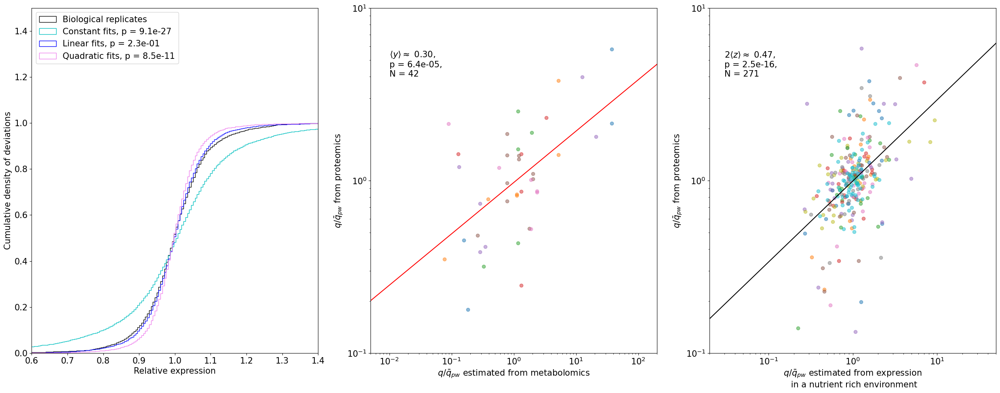

In [92]:
#All correlation plot for significance testing (repeated with the relevant extended data figures)
#Here it's specified which samples are replicates of each other.
fig, axs = plt.subplots(1, 3, figsize = (25, 10))
#0  C2		0.91	
#1  C3		0.77	
#2  C4		0.69	
#3  C5		0.56	
#4  C6		0.48	
#5  C7		0.35	
#6  C8		0.72	biological replicate of C4
#7  D6		0.56	biological replicate of C5
#8  D7		0.33	biological replicate of C7
#9  D8		0.49	biological replicate of C6
#10 F4		0.81	biological replicate of C3
#11 F5		0.71	biological replicate of C4
#12 F6		0.55	biological replicate of C5
#13 F7		0.50    biological replicate of C6
#14 F8		0.34	biological replicate of C7

SSQ_0s = []
SSQ_1s = []
SSQ_2s = []
Bios = []
pvalues = []
for i in range(len(UniIDs)):
    if UniIDs[i] in list(validmetabolic):
        #use only one independent set of biological replicates to prevent pseudoreplication
        #make sure that replicates are not biased towards higher or lower growth of the reference replicate
        Bio = [(1-data[i, 10]/data[i, 1]), (1-data[i, 2]/data[i, 6]), (1-data[i, 3]/data[i, 7]), (1-data[i, 8]/data[i, 5]), (1-data[i, 9]/data[i, 4])]#,
                #(1-data[i, 2]/data[i, 11]), (1-data[i, 3]/data[i, 12]), (1-data[i, 4]/data[i, 13]), (1-data[i, 5]/data[i, 14]),
                #(1-data[i, 6]/data[i, 11]), (1-data[i, 7]/data[i, 12]), (1-data[i, 9]/data[i, 13]), (1-data[i, 8]/data[i, 14])]
        Bios = Bios + Bio

for i in range(len(UniIDs)):
    if UniIDs[i] in list(validmetabolic):
        model0 = np.poly1d(np.polyfit(grs, data[i], 0)) 
        SSQ_0 = ((1-data[i]/model0(grs)))
        SSQ_0s = SSQ_0s+list(SSQ_0)
        model1 = np.poly1d(np.polyfit(grs, data[i], 1)) 
        SSQ_1 = ((1-data[i]/model1(grs)))
        SSQ_1s = SSQ_1s+list(SSQ_1)
        model2 = np.poly1d(np.polyfit(grs, data[i], 2)) 
        SSQ_2 = ((1-data[i]/model2(grs)))
        SSQ_2s = SSQ_2s+list(SSQ_2)
        #pvalues.append([kstest(SSQ_0, Bios).pvalue, kstest(SSQ_1, Bios).pvalue, kstest(SSQ_1, Bios).pvalue])
bins = np.linspace(-0.8, 0.8, 300)+1

axs[0].hist(1+np.array(Bios), bins = bins, histtype='step', density = True, cumulative=1, label = "Biological replicates", color = "k")
axs[0].hist(1+np.array(SSQ_0s), bins = bins, histtype='step', density = True, cumulative=1, label = "Constant fits, "+"p = %.1e"%kstest(SSQ_0s, Bios).pvalue , color = "c")
axs[0].hist(1+np.array(SSQ_1s), bins = bins, histtype='step', density = True, cumulative=1, label = "Linear fits, "+"p = %.1e"%kstest(SSQ_1s, Bios).pvalue , color = "b")
axs[0].hist(1+np.array(SSQ_2s), bins = bins, histtype='step', density = True, cumulative=1, label = "Quadratic fits, "+"p = %.1e"%kstest(SSQ_2s, Bios).pvalue , color = "violet")

errs = np.linspace(-1, 1, 100)
sigma_bio = 0.107
for ax in axs:
    #ax.plot(errs, 1/np.sqrt(2*np.pi*sigma_bio**2)*np.exp(-errs**2/2/sigma_bio**2))
    ax.set_xlim(0.6, 1.4)



print(kstest(SSQ_0s, Bios).pvalue)
print(kstest(SSQ_1s, Bios).pvalue)
print(kstest(SSQ_2s, Bios).pvalue)
#axs[2].hist(1-data[1,:]/data[10, :]]
#print(len(validmetabolic))
axs[0].legend(loc = "upper left")
axs[0].set_xlabel("Relative expression")
axs[0].set_ylabel("Cumulative density of deviations")
axs[0].set_ylim(0, 1.5)


allx = []
ally = []
for i in range(len(allscatterqs_proteome_estimate)):
    #print(i)
    allx = allx+list(np.log(allscatterqs_proteome_estimate[i])/(-2))
    ally = ally+list(np.log(allscatterqs_proteome[i]))
    axs[2].scatter(allscatterqs_proteome_estimate[i]**(-1/2), allscatterqs_proteome[i], alpha = 0.5)
    #ally = ally+list(np.log(scatterqs_proteome_estimate[i]))
    #plt.scatter(scatterqs_metabolome[i], scatterqs_proteome_estimate[i], alpha = 0.5)

allx = np.array(allx)
ally = np.array(ally)
allx = allx[~np.isnan(ally)]
ally = ally[~np.isnan(ally)]
xs = np.linspace(np.nanmin(allx)-3, np.nanmax(allx)+3, 100)
slope, intercept, r_value, p_value, std_err = linregress(allx, ally)

axs[2].plot(np.exp(xs), np.exp(intercept+slope*xs), "k")
axs[2].text(3e-2, 4, r"$2\langle z\rangle \approx$ %.2f,"%slope + "\n"+"p = %.1e,"%p_value  + "\n"+"N = %d"%len(allx))


allx = []
ally = []
for i in range(len(scatterqs_metabolome)):
    #print(i)
    allx = allx+list(np.log(scatterqs_metabolome[i]))
    ally = ally+list(np.log(scatterqs_proteome[i]))
    axs[1].scatter(scatterqs_metabolome[i], scatterqs_proteome[i], alpha = 0.5)
    #ally = ally+list(np.log(scatterqs_proteome_estimate[i]))
    #plt.scatter(scatterqs_metabolome[i], scatterqs_proteome_estimate[i], alpha = 0.5)

allx = np.array(allx)
ally = np.array(ally)
allx = allx[~np.isnan(ally)]
ally = ally[~np.isnan(ally)]
xs = np.linspace(np.nanmin(allx)-3, np.nanmax(allx)+3, 100)
slope, intercept, r_value, p_value, std_err = linregress(allx, ally)

axs[1].plot(np.exp(xs), np.exp(intercept+slope*xs), "r")
axs[1].text(1e-2, 4, r"$\langle y\rangle \approx$ %.2f,"%slope + "\n"+"p = %.1e,"%p_value  + "\n"+"N = %d"%len(allx))

axs[2].set_xscale("log")
axs[2].set_yscale("log")
axs[2].set_xlim(2e-2, 5e1)
axs[2].set_ylim(1e-1, 1e1)
axs[2].set_xlabel(r"$q/\bar{q}_{pw}$ estimated from expression" + "\n in a nutrient rich environment")
axs[2].set_ylabel(r"$q/\bar{q}_{pw}$ from proteomics")

axs[1].set_xscale("log")
axs[1].set_yscale("log")
axs[1].set_xlim(5e-3, 2e2)
axs[1].set_ylim(1e-1, 1e1)
axs[1].set_xlabel(r"$q/\bar{q}_{pw}$ estimated from metabolomics")
axs[1].set_ylabel(r"$q/\bar{q}_{pw}$ from proteomics")
fig.tight_layout()
#plt.savefig("qComparison.pdf")

In [96]:
#Computing all pathway statistics - figure not used in the manuscript.
anticorrelation = True
reverse = True
limitation = "Carbon"

def plotAnticorrelationFigure(limitation, short = False, sigma = sigma):
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb), sorting_list)

    
    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')
    if short:
        nx = 2 #3
        ny = 9 #6
        font = {'size'   : int(25)}
        plt.rc('font', **font)
        plt.rcParams.update({'axes.titlesize': int(25)})
        fig, axs = plt.subplots(ny, 2*nx, figsize=(1, 1)) ### replace this by gridspec

        fig = plt.figure(figsize = (25, 45))
        gs = gridspec.GridSpec(47, 20)
        gs.update(wspace=0, hspace=0)
        for n, ax in enumerate(axs.flatten()):
            #i = int(n/ny)
            #j = n%(2*nx)
            #print(i, j)
            #axs[i, j] = plt.subplot(gs[1+5*i+(n>=24):5+5*i+(n>=24), 1+5*j:5+5*j])
            i = int(n/(2*nx))
            j = n%(2*nx)
            axs[i, j] = plt.subplot(gs[1+5*i+2*(n>=24):5+5*i+2*(n>=24), 1+5*j:5+5*j])
        
    else:
        nx = int(np.sqrt(len(gooddb))/2)+2
        ny = int(len(gooddb)/nx)+((len(gooddb)%nx)>0)
        font = {'size'   : int(60/nx)} #20
        plt.rc('font', **font)
        plt.rcParams.update({'axes.titlesize': int(60/nx)})
        fig, axs = plt.subplots(ny, 2*nx, figsize = (35, 30))
    
    deviations = []
    basedeviations = []
    siglevels = []
    exponent_proteome = []
    exponent_metabolome = []
    sig_exponent_proteome = []
    sig_exponent_metabolome = []
    qbar = []
    sig_qbar = []
    for n in range(ny*nx):
        if n<len(gooddb):
            if short*(n>=12):
                Bpathways = ["md:eco_M00144", "md:eco_M00157", "path:eco03010", "md:eco_M00023", "md:eco_M00026", "md:eco_M00176"]
                allpathways = np.array([x[0] for x in gooddb])
                path = Bpathways[n-12]
                nlocal = np.where(allpathways == path)[0][0]
                unis = gooddb[nlocal][1]
            else:
                path, unis = gooddb[sorting_list[n]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            ax1 = axs.flatten()[2*n]
            ax2 = axs.flatten()[2*n+1]
            ax3 = ax2.twiny()
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1
            
            #print(locals)
            meansC = np.copy(means)
            meansC[mask] = np.nan
            
            localconcs = np.copy(concs)[~np.isnan(meansC)]#*0+1e-3
            localKMs = np.copy(KMs)[~np.isnan(meansC)]
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)
            
            scatterxs = localoffsets[deviation<(3*sigma)**2]+np.max(grs)*localslopes[deviation<(3*sigma)**2]#xs[deviation<0.05, 0]
            met_scatterxs = (localconcs/localKMs)[deviation<(3*sigma)**2]
            scatterys = localoffsets[deviation<(3*sigma)**2]/xs[deviation<(3*sigma)**2, 0]
            qbar.append(np.sum(scatterys*scatterxs)/np.sum(scatterxs))

            slope, bar, rvalue, pvalue, sigbar = linregress(np.array(grs), np.sum(data[~np.isnan(meansC)], axis = 0)/(np.sum(data[~np.isnan(meansC)], axis = 0)[0]))
            #print(qbar[-1], intercept, sigbar)
            sig_qbar.append(sigbar*grs[0]/2)
            ax2.scatter(scatterxs[scatterys>0], scatterys[scatterys>0], color = "k")
            
            if not short:
                ax2.scatter(scatterxs[scatterys<0], (xs[deviation<(3*sigma)**2, -1]/xs[deviation<(3*sigma)**2, 0])[scatterys<0], color = "k", alpha = 0.5, marker = "+")
                ax2.scatter(xs[deviation>(3*sigma)**2, 0], xs[deviation>(3*sigma)**2, -1]/xs[deviation>(3*sigma)**2, 0], color = "k", alpha = 0.2, marker = "x")

            
            allxs = np.linspace(-7, 7, 10)
            slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[scatterys>0]), np.log10(scatterys[scatterys>0]))
            #ax2.text(2e-7, 7e-2, r"$\frac{d\ln \xi}{d \ln \phi^{hi}}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
            if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                ax2.text(2e-6, 4e-2, r"$z \approx 0$")
            elif (short and n>=12):
                ax2.text(2e-6, 4e-2, r"$z \approx 0$")
            else:
                #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                ax2.text(2e-6, 4e-2, r"$z = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err)
            exponent_proteome.append(slope)
            sig_exponent_proteome.append(std_err)
                
            #print(name, "%.3f"%slope,r_value, p_value, std_err)
            ax2.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-", alpha = 0.8)
            ax2.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1/2*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
            #print(scatterxs, scatterys)
            #siglevels.append(slope/std_err)
            siglevels.append(np.log10(p_value)*slope/np.abs(slope))


            if path in Pathways_metabolome:
                ax3.scatter(met_scatterxs[scatterys>0], scatterys[scatterys>0], color = "r", alpha = 0.8)
                allxs = np.linspace(-7, 7, 10)
                try:
                    slope, intercept, r_value, p_value, std_err = linregress(np.log10(met_scatterxs[(scatterys>0)*(~np.isnan(met_scatterxs))]), np.log10(scatterys[(scatterys>0)*(~np.isnan(met_scatterxs))]))
                    #ax2.text(2e-4, 7e-2, r"$\frac{d\ln \xi}{d \ln (\rho_i/K_i)}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                    if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                        ax3.text(5e2, 1.2e1, r"$\tilde{z} \approx 0$", horizontalalignment='right', color = "r", alpha = 0.8)
                    else:
                        #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                        ax3.text(5e2, 1.2e1, r"$\tilde{z} = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err, horizontalalignment='right', color = "r", alpha = 0.8)
                    exponent_metabolome.append(slope)
                    sig_exponent_metabolome.append(std_err)
                    #print(name, "%.3f"%slope,r_value, p_value, std_err)
                    ax3.plot(10**(allxs), 10**(slope*allxs+intercept), color = "r", linestyle = "-", alpha = 0.8)
                    #print(slope, std_err)
                    #ax3.spines['top'].set_color('r') 
                    #ax3.tick_params(axis='x', colors='r')
                except:
                    print("no data")
                    exponent_metabolome.append(np.nan)
                    sig_exponent_metabolome.append(np.nan)
            else:
                exponent_metabolome.append(np.nan)
                sig_exponent_metabolome.append(np.nan)
                
                #ax3.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
            

            labelsx = [0]
            labelsy = [0]
            for i in range(len(xs)):
                color = cmjet(np.random.uniform())
                #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
                deviation = np.mean((1-xs[i]/(localoffsets[i]+localslopes[i]*grs))**2)
                deviations.append(deviation)
                if deviation<(3*sigma)**2:
                    ax1.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                    ax1.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color, linestyle = "-")
                    if ys[i]<3 and ys[i]>0:
                        labelx = 0.02+0.14*(rankdata(ys)[i]%2)
                        labely = 1+(ys[i]-1)*0.85-0.03
                        if not short:
                            if np.min(100*(np.array(labelsx)-labelx)**2+(np.array(labelsy)-labely)**2)>0.01:
                                labelsx.append(labelx) 
                                labelsy.append(labely)
                                ax1.text(labelx, labely, localnames[i][0], alpha = 0.7, fontsize = int(10+short*7))
                        #else:
                        #    ax1.text(labelx+0.1, labely, "...", alpha = 0.7, fontsize = 20)
                else:
                    ax1.scatter(grs, xs[i]/xs[i][0], color = color)
                   
            if len(name)<60:
                ax1.set_title(name, loc = "left")
            else:
                ax.set_title(name[:58]+"...")

            ax1.scatter(grs, np.nansum(xs, axis = 0)/np.nansum(localoffsets+localslopes*grs[0], axis = 0), color = "k", zorder = 500)
            ax1.plot(np.linspace(0.3, grs[0], 5), (np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*np.linspace(0.3, grs[0], 5))/(np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*grs[0]), color = "k", linestyle = "--", linewidth = 3)
    
        else: 
            axs.flatten()[2*n].axis("off")
            axs.flatten()[2*n+1].axis("off")
        
        ax2.set_ylim(0.03, 30)
        ax2.set_xlim(1e-6, 1e-1)
        ax2.set_xscale("log")
        ax2.set_yscale("log")

        ax1.set_ylim(0, 3)
        if short:
            ax1.set_xlim(0.2, 1)
            ax1.set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
        else:
            ax1.set_xlim(0, 1)
            ax1.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
        ax3.set_xlim(1e-2, 1e3)
        ax3.set_xscale("log")
        #ax3.set_xticks([1e-1, 1e2])

        #if n in np.arange(nx):
        #    ax3.set_xlabel(r"$\rho^{hi}/K$")
        #    ax3.spines['top'].set_color('r') 
        #    ax3.tick_params(axis='x', colors='r')
        #    ax3.xaxis.label.set_color('r')
        #    #ax2.set_xticklabels([1e-2, 1e2])
        #else:
        #    ax3.set_xticklabels([])
        ax3.set_xticklabels([])
        ax3.set_xticks([])
            
        if n in np.arange(ny)*nx:
            ax1.set_ylabel(r"$\phi/\phi^{hi}$")

        if short:
            if n in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15]:
                ax1.set_xticklabels([])
                ax2.set_xticklabels([])
            else:
                ax1.set_xticklabels([0.2, 0.4, 0.6, 0.8, 1.0])
                ax1.set_xlabel(r"Growth rate $\lambda$ [1/h]")
                #ax2.set_xlabel(r"$\phi^{hi}$")
                multicolor_xlabel(ax2,(r"$\phi/\phi^{hi}$, ", r"$10^{-4} \rho^{hi}/K$"),('k','r'), short = short)
        else:
            if n in np.arange(len(gooddb)-nx):
                ax1.set_xticklabels([])
                ax2.set_xticklabels([])
            else:
                ax1.set_xticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
                ax1.set_xlabel(r"Growth rate $\lambda$ [1/h]")
                #ax2.set_xlabel(r"$\phi^{hi}$")
                multicolor_xlabel(ax2,(r"$\phi/\phi^{hi}$, ", r"$10^{-4} \rho^{hi}/K$"),('k','r'), short = short)
        
        if path == 'path:eco03010':
            print(path)
            print(np.sum(scatterxs))
        if path == 'md:eco_M00017':
            print(path)
            print(np.nanmax(scatterxs), scatterys[scatterxs == np.nanmax(scatterxs)])
    
    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)

    coolwarm = plt.cm.get_cmap('coolwarm')
    siglevels = np.array(siglevels)
    siglevels[np.abs(siglevels)>10] = 0
    #colors = siglevels/np.nanmax(np.abs(siglevels))/2+1/2
    colors = siglevels/5/2+1/2
    colors[colors>1] = 1
    colors[colors<0] = 0
    colors[np.isnan(colors)] = 1/2
    #print(siglevels, colors)
    #for n in range(len(gooddb)):
        #ax = axs.flatten()[2*n+1]
        #ax.set_facecolor(coolwarm(colors[n]))

    fig.tight_layout()
    if short:
        fig.text(0.12, 0.87, "A",weight="bold", fontsize = 35)
        fig.text(0.12, 0.35, "B",weight="bold", fontsize = 35)
        #plt.savefig("15Pathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
    #else:
        #plt.savefig("AllPathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
    print(siglevels)
    print(np.log10(0.05))
    print(np.sum(siglevels>-np.log10(0.05)))
    
    return qbar, sig_qbar, exponent_proteome, sig_exponent_proteome, exponent_metabolome, sig_exponent_metabolome
    

-0.12831751370295258 1.254022141712238e-42
30 [5, 12, 20, 1, 0, 3, 4, 10, 2, 27, 24, 18, 9, 25, 26, 28, 22, 23, 15, 17, 19, 6, 14, 11, 16, 7, 13, 21, 8, 29]
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
md:eco_M00017
0.06516451519953298 [-0.09700364]
path:eco03010
0.15801039686893692
path:eco03010
0.15801039686893692
path:eco03010
0.15801039686893692
[ 0.98159365  1.90072977  1.80823586  2.80543149  0.84121645  1.59031204
  2.70180573  0.31740775  3.6088548   0.59505865  0.80929443  1.5336698
 -0.19939372 -0.0253157  -0.59729871  0.64391776 -0.21406342  0.6128049
  0.5054536   2.76916424  1.06447739  0.02443518 -0.07734525 -0.16902067
  0.92795945  0.83637589 -0.38680762  0.05730055 -0.72908724  0.71322354]
-1.3010299956639813
8


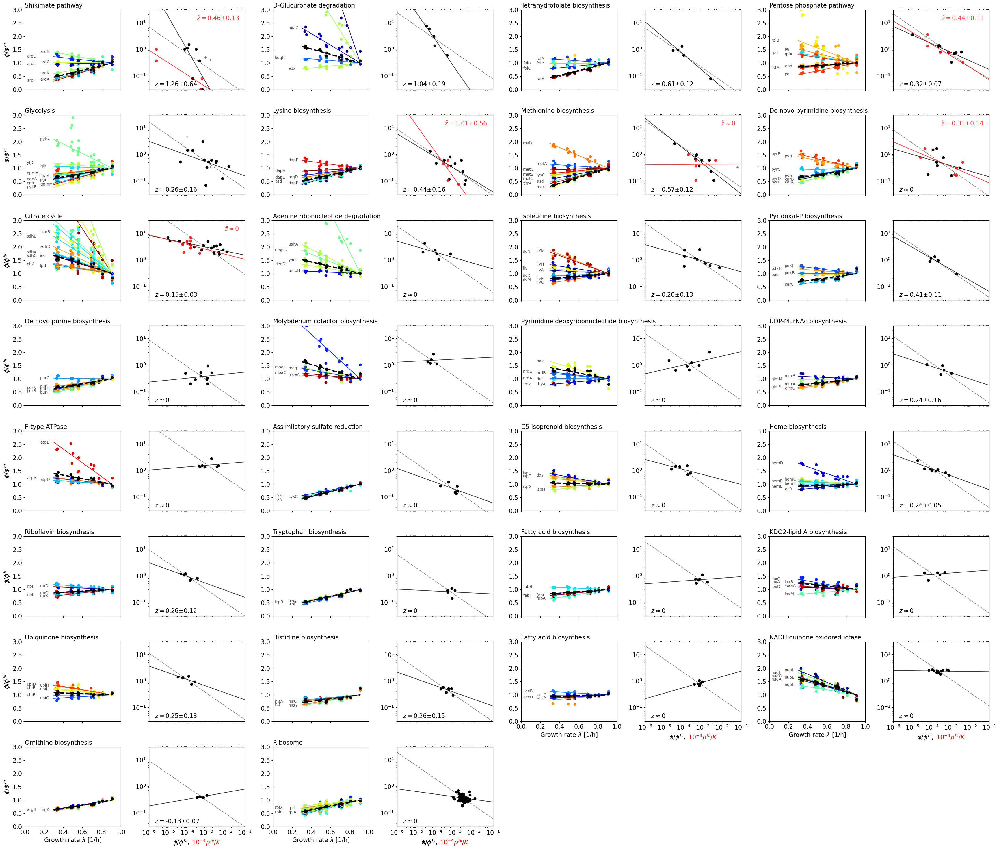

In [98]:
qbar, sig_qbar, exponent_proteome, sig_exponent_proteome, exponent_metabolome, sig_exponent_metabolome = plotAnticorrelationFigure("Carbon", short = False)

In [100]:
#Extended Data Table 1, notes were added manually

qbar = np.array(qbar)
sig_qbar = np.array(sig_qbar)
exponent_proteome = np.array(exponent_proteome)
exponent_metabolome = np.array(exponent_metabolome)
sig_exponent_proteome = np.array(sig_exponent_proteome)
sig_exponent_metabolome = np.array(sig_exponent_metabolome)
#print(exponent_proteome, exponent_metabolome)
print(" ")
#print(np.mean(exponent_proteome[exponent_proteome<0]), np.std(exponent_proteome[exponent_proteome<0]), np.nanmean(exponent_metabolome))

dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
data = dataset[columnsall].to_numpy()
grs = np.array(grsall)
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
#means[means == 0] = np.nan
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr

vars = []
for g in gooddb:
    path, unis = g 
    mask = []
    index = 0
    locals = ""
    for UniID in UniIDs:
        if UniID not in unis:
            mask.append(index)
        else:
            locals+=(UniID[0]+", ")
        index += 1
    #offsetsC = offsets+slopes*np.max(grs)
    offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
    offsetsC[mask] = np.nan
    vars.append(np.nanvar(np.log(offsetsC)))
    
original_list = vars[:-1]
sorted_list = sorted(original_list)
sorting_list2 = list(range(len(original_list)))
sorting_list2.sort(key=lambda x: original_list[x])
sorting_list2 = sorting_list2[::-1]
sorting_list2.append(len(vars)-1)
print(len(gooddb), sorting_list2)


#Match pathways and detected proteins, generate the respective SI Table
dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 

grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

data = dataset[columnsall].to_numpy()
grs = np.array(grsall)
meangr = np.mean(grs)

names = dataset[["Gene name"]].to_numpy()
UniIDs = dataset[["Protein ID"]].to_numpy()
means = np.mean(data, 1)
#means[means == 0] = np.nan
means[np.any(data == 0, axis = 1)] = np.nan
slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
offsets = means-slopes*meangr
r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2

#ax = axs[0, 2]
#x = means[~np.isnan(offsets)]
#y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
x = (data[:, 0])[~np.isnan(means)]
y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
validdata = np.all(np.array([x>0, y>0]), 0)
y = np.log(y[validdata])
x = np.log(x[validdata])

x_data = np.copy(x)
y_data = np.copy(y)
#print(np.sum([y>1]/np.shape(y)[0]))

slope, intercept, r_value, p_value, std_err = linregress(x,y)
print(slope, p_value)

vars = []
for i in range(len(gooddb)):
    path, unis = gooddb[sorting_list2[i]] 
    mask = []
    index = 0
    locals = ""
    for UniID in UniIDs:
        if UniID not in unis:
            mask.append(index)
        else:
            locals+=(UniID[0]+", ")
        index += 1
    
    
    meansC = np.copy(means)
    meansC[mask] = np.nan
    
    xs = data[~np.isnan(meansC)]
    localoffsets = offsets[~np.isnan(meansC)]
    localslopes = slopes[~np.isnan(meansC)]
    localnames = names[~np.isnan(meansC)]
    rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
    ys = (localoffsets)/(localoffsets+localslopes*grs[0])

    deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)

    name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
    #print(np.array(unis)[np.array(deviation)>3*sigma**2])
    
    original_list = ys
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    outstring = name +"& "+path[-6:]+"& "
    firstline = True
    
    n = i #np.where(np.array(sorting_list2) == i)[0][0]
    name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
    if ~np.isnan(exponent_metabolome[n]):
        if np.abs(exponent_metabolome[n])>1.5*sig_exponent_metabolome[n]:
            if np.abs(exponent_proteome[n])>1.5*sig_exponent_proteome[n]:
                rest = "& %.2f$\pm$ %.2f & \\textbf{%.2f$\pm$ %.2f} & \\textbf{%.2f$\pm$%.2f} & \\\\"%(qbar[n], sig_qbar[n], -exponent_metabolome[n], sig_exponent_metabolome[n], -exponent_proteome[n], sig_exponent_proteome[n])
            else:
                rest = "& %.2f$\pm$ %.2f & \\textbf{%.2f$\pm$ %.2f} & %.2f$\pm$%.2f & \\\\"%(qbar[n], sig_qbar[n], -exponent_metabolome[n], sig_exponent_metabolome[n], -exponent_proteome[n], sig_exponent_proteome[n])
        else:
            if np.abs(exponent_proteome[n])>1.5*sig_exponent_proteome[n]:
                rest = "& %.2f$\pm$ %.2f & %.2f$\pm$ %.2f & \\textbf{%.2f$\pm$%.2f} & \\\\"%(qbar[n], sig_qbar[n], -exponent_metabolome[n], sig_exponent_metabolome[n], -exponent_proteome[n], sig_exponent_proteome[n])
            else:
                rest = "& %.2f$\pm$ %.2f & %.2f$\pm$ %.2f & %.2f$\pm$%.2f & \\\\"%(qbar[n], sig_qbar[n], -exponent_metabolome[n], sig_exponent_metabolome[n], -exponent_proteome[n], sig_exponent_proteome[n])
        
    else:
        if np.abs(exponent_proteome[n])>1.5*sig_exponent_proteome[n]:
            rest = "& %.2f$\pm$ %.2f & & \\textbf{%.2f$\pm$%.2f} & \\\\"%(qbar[n], sig_qbar[n], -exponent_proteome[n], sig_exponent_proteome[n])
        else:
            rest = "& %.2f$\pm$ %.2f & & %.2f$\pm$%.2f & \\\\"%(qbar[n], sig_qbar[n], -exponent_proteome[n], sig_exponent_proteome[n])
    
    
    for n in range(len(unis)):
        outstring = outstring+localnames[sorting_list[n]]#unis[sorting_list[n]]
        if deviation[sorting_list[n]]>3*sigma**2:
            outstring = outstring+"$^\star$"
        elif localoffsets[sorting_list[n]]<0:
            outstring = outstring+"$^\dagger$"
        if (n != len(unis)-1):
            outstring = outstring+", "
            if ((n+1)%8 ==0):
                if firstline:
                    outstring = outstring+rest+ "& &" 
                    firstline = False
                else:
                    outstring = outstring + "& & & & \\\\ & &"
    if firstline:
        print((outstring +rest)[0])
    else: 
        print((outstring + "& & & & \\\\")[0])

    

 
30 [5, 12, 20, 1, 0, 3, 4, 10, 2, 27, 24, 18, 9, 25, 26, 28, 22, 23, 15, 17, 19, 6, 14, 11, 16, 7, 13, 21, 8, 29]
-0.12831751370295258 1.254022141712238e-42
Shikimate pathway& M00022& aroB, aroD, aroC, aroL, aroK, aroH, aroA, aroF$^\star$, & 0.18$\pm$ 0.04 & \textbf{0.46$\pm$ 0.13} & \textbf{1.26$\pm$0.64} & \\& &aroG$^\dagger$& & & & \\
D-Glucuronate degradation& M00061& uxuB, uxuA, uxaC, kdgK, eda& 1.71$\pm$ 0.04 & & \textbf{1.04$\pm$0.19} & \\
Tetrahydrofolate biosynthesis& M00126& folA, folB, folP, folC, folE& 0.16$\pm$ 0.03 & & \textbf{0.61$\pm$0.12} & \\
Pentose phosphate pathway & M00004& talA$^\star$, rpiB, pgl, rpe, rpiA, zwf, gnd, tktB, & 0.75$\pm$ 0.02 & \textbf{0.44$\pm$ 0.11} & \textbf{0.32$\pm$0.07} & \\& &talB, tktA, pgi& & & & \\
Glycolysis & M00001& pykA, ytjC, glk, gpmA, pfkB, pfkA, pgk, tpiA, & 0.39$\pm$ 0.03 & & \textbf{0.26$\pm$0.16} & \\& &fbaA, gapA, pgi, eno, gpmM, pykF$^\dagger$, fbaB$^\star$& & & & \\
Lysine biosynthesis& M00016& dapF, dapA, lysC, lysA, argD

In [102]:
#print(gooddb)
#print(Pathways_metabolome)
countunis_proteome = []
countunis_metabolome = []
for path, unis in gooddb:
    for uni in unis:
        if path in Pathways_metabolome:
            countunis_metabolome.append(uni)
        countunis_proteome.append(uni)
print("Pathways evaluated for the proteome law: ", len(gooddb))
print("Pathways evaluated for the metabolome law: ", len(Pathways_metabolome))

print("Proteins evaluated for the proteome law: ", len(set(countunis_proteome)))
print("Proteins evaluated for the metabolome law: ", len(set(countunis_metabolome)))

Pathways evaluated for the proteome law:  30
Pathways evaluated for the metabolome law:  9
Proteins evaluated for the proteome law:  272
Proteins evaluated for the metabolome law:  64


In [110]:
#Extended Data Figures 1 and 5
anticorrelation = True
reverse = True
limitation = "Carbon"

def plotAnticorrelationFigure(limitation, short = False, sigma = sigma):
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        #vars.append(np.nanvar(offsetsC))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb), sorting_list)

    
    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')

    nx = 7 #3
    ny = 5 #6
    font = {'size'   : int(20)}
    plt.rc('font', **font)
    plt.rcParams.update({'axes.titlesize': int(20)})
    fig, axs = plt.subplots(ny, nx, figsize=(1, 1)) ### replace this by gridspec

    fig = plt.figure(figsize = (35, 40))
    gs = gridspec.GridSpec(35, 35)
    gs.update(wspace=0, hspace=0)
    for n, ax in enumerate(axs.flatten()):
        i = int(n/nx)
        j = n%nx
        axs[i, j] = plt.subplot(gs[1+5*i:5+5*i, 1+5*j:5+5*j])
        
    
    deviations = []
    basedeviations = []
    siglevels = []
    exponent_proteome = []
    exponent_metabolome = []
    for n in range(ny*nx):
        if n<len(gooddb):
            if short*(n>=12):
                Bpathways = ["md:eco_M00144", "md:eco_M00157", "path:eco03010", "md:eco_M00023", "md:eco_M00026", "md:eco_M00176"]
                allpathways = np.array([x[0] for x in gooddb])
                path = Bpathways[n-12]
                nlocal = np.where(allpathways == path)[0][0]
                unis = gooddb[nlocal][1]
            else:
                path, unis = gooddb[sorting_list[n]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            if laws:
                ax2 = axs.flatten()[n]
                ax3 = ax2.twiny()
            else:
                ax1 = axs.flatten()[n]
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1
            
            #print(locals)
            meansC = np.copy(means)
            meansC[mask] = np.nan
            
            localconcs = np.copy(concs)[~np.isnan(meansC)]#*0+1e-3
            localKMs = np.copy(KMs)[~np.isnan(meansC)]
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)
            
            scatterxs = localoffsets[deviation<(3*sigma)**2]+np.max(grs)*localslopes[deviation<(3*sigma)**2]#xs[deviation<0.05, 0]
            met_scatterxs = (localconcs/localKMs)[deviation<(3*sigma)**2]
            scatterys = localoffsets[deviation<(3*sigma)**2]/xs[deviation<(3*sigma)**2, 0]

            if laws:
                ax2.scatter(scatterxs[scatterys>0], scatterys[scatterys>0], color = "k")
                
                if not short:
                    ax2.scatter(scatterxs[scatterys<0], (xs[deviation<(3*sigma)**2, -1]/xs[deviation<(3*sigma)**2, 0])[scatterys<0], color = "k", alpha = 0.5, marker = "+")
                    ax2.scatter(xs[deviation>(3*sigma)**2, 0], xs[deviation>(3*sigma)**2, -1]/xs[deviation>(3*sigma)**2, 0], color = "k", alpha = 0.2, marker = "x")
    
                allxs = np.linspace(-7, 7, 10)
                slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[scatterys>0]), np.log10(scatterys[scatterys>0]))
                #ax2.text(2e-7, 7e-2, r"$\frac{d\ln \xi}{d \ln \phi^{hi}}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                    ax2.text(2e-6, 4e-2, r"$z \approx 0$")
                elif (short and n>=12):
                    ax2.text(2e-6, 4e-2, r"$z \approx 0$")
                else:
                    #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                    ax2.text(2e-6, 4e-2, r"$z = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err)
                    exponent_proteome.append(slope)
                
                    #print(name, "%.3f"%slope,r_value, p_value, std_err)
                    ax2.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-", alpha = 0.8)
                #ax2.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1/2*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
                #print(scatterxs, scatterys)
                #siglevels.append(slope/std_err)
                siglevels.append(np.log10(p_value)*slope/np.abs(slope))
    
    
                if path in Pathways_metabolome:
                    ax3.scatter(met_scatterxs[scatterys>0], scatterys[scatterys>0], color = "r", alpha = 0.8)
                    allxs = np.linspace(-7, 7, 10)
                    try:
                        slope, intercept, r_value, p_value, std_err = linregress(np.log10(met_scatterxs[(scatterys>0)*(~np.isnan(met_scatterxs))]), np.log10(scatterys[(scatterys>0)*(~np.isnan(met_scatterxs))]))
                        #ax2.text(2e-4, 7e-2, r"$\frac{d\ln \xi}{d \ln (\rho_i/K_i)}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                        if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                            ax3.text(5e2, 1.2e1, r"$y \approx 0$", horizontalalignment='right', color = "r", alpha = 0.8)
                        else:
                            #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                            ax3.text(5e2, 1.2e1, r"$y = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err, horizontalalignment='right', color = "r", alpha = 0.8)
                            #print(name, "%.3f"%slope,r_value, p_value, std_err)
                            ax3.plot(10**(allxs), 10**(slope*allxs+intercept), color = "r", linestyle = "-", alpha = 0.8)
                        exponent_metabolome.append(slope)
                        #print(slope, std_err)
                        #ax3.spines['top'].set_color('r') 
                        #ax3.tick_params(axis='x', colors='r')
                    except:
                        print("no data")
                
                    #ax3.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)

                if len(name)<20:
                    ax2.set_title(name, loc = "left")
                else:
                    if "ribonu" in name:
                        ax2.set_title("Pyrimidine deoxyribo-\n"+"nucleotide biosynthesis", loc = "left")
                    else:
                        parts = name[int(len(name)/2)-2:].split(" ")
                        sep = ""
                        for part in parts[1:]:
                            sep = sep+" "+part
                        try:
                            ax2.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")
                        except:
                            sep = name.split(" ")[-2]
                            ax2.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")

                if n in np.arange(ny)*nx:
                    ax2.set_ylabel(r"$\hat q = \phi^{lo}/\phi^{hi}$")
                else:
                    ax2.set_yticklabels([])
                        
            else:
                labelsx = [0]
                labelsy = [0]
                for i in range(len(xs)):
                    color = cmjet(np.random.uniform())
                    #ax.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color
                    deviation = np.mean((1-xs[i]/(localoffsets[i]+localslopes[i]*grs))**2)
                    deviations.append(deviation)
                    if deviation<(3*sigma)**2:
                        ax1.scatter(grs, xs[i]/(localoffsets[i]+localslopes[i]*grs[0]), color = color)
                        ax1.plot(np.linspace(0.3, grs[0], 5), (localoffsets[i]+localslopes[i]*np.linspace(0.3, grs[0], 5))/(localoffsets[i]+localslopes[i]*grs[0]), color = color, linestyle = "-")
                        if ys[i]<3 and ys[i]>0:
                            labelx = 0.02+0.14*(rankdata(ys)[i]%2)
                            labely = 1+(ys[i]-1)*0.85-0.03
                            if not short:
                                if np.min(100*(np.array(labelsx)-labelx)**2+(np.array(labelsy)-labely)**2)>0.01:
                                    labelsx.append(labelx) 
                                    labelsy.append(labely)
                                    ax1.text(labelx, labely, localnames[i][0], alpha = 0.7, fontsize = int(10+short*7))
                            #else:
                            #    ax1.text(labelx+0.1, labely, "...", alpha = 0.7, fontsize = 20)
                    else:
                        ax1.scatter(grs, xs[i]/xs[i][0], color = color)
                       
                if len(name)<20:
                    ax1.set_title(name, loc = "left")
                else:
                    if "ribonu" in name:
                        ax1.set_title("Pyrimidine deoxyribo-\n"+"nucleotide biosynthesis", loc = "left")
                    else:
                        parts = name[int(len(name)/2)-2:].split(" ")
                        sep = ""
                        for part in parts[1:]:
                            sep = sep+" "+part
                        try:
                            ax1.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")
                        except:
                            sep = name.split(" ")[-2]
                            ax1.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")
    
                ax1.scatter(grs, np.nansum(xs, axis = 0)/np.nansum(localoffsets+localslopes*grs[0], axis = 0), color = "k", zorder = 500)
                #ax1.plot(np.linspace(0.3, grs[0], 5), (np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*np.linspace(0.3, grs[0], 5))/(np.nansum(localoffsets, axis = 0)+np.nansum(localslopes, axis = 0)*grs[0]), color = "k", linestyle = "--", linewidth = 3)
        
        else: 
            axs.flatten()[n].axis("off")

        if laws:
            ax2.set_ylim(0.03, 30)
            ax2.set_xlim(1e-6, 1e-1)
            ax2.set_xscale("log")
            ax2.set_yscale("log")
            ax3.set_xlim(1e-2, 1e3)
            ax3.set_xscale("log")
            #ax3.set_xticks([1e-1, 1e2])
    
            #if n in np.arange(nx):
            #    ax3.set_xlabel(r"$\rho^{hi}/K$")
            #    ax3.spines['top'].set_color('r') 
            #    ax3.tick_params(axis='x', colors='r')
            #    ax3.xaxis.label.set_color('r')
            #    #ax2.set_xticklabels([1e-2, 1e2])
            #else:
            #    ax3.set_xticklabels([])
            ax3.set_xticklabels([])
            ax3.set_xticks([])

            if n in np.arange(len(gooddb)-nx):
                #ax1.set_xticklabels([])
                ax2.set_xticklabels([])
            else:
                #ax1.set_xticklabels([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
                #ax1.set_xlabel(r"Growth rate $\lambda$ [1/h]")
                #ax2.set_xlabel(r"$\phi^{hi}$")
                multicolor_xlabel(ax2,(r"$\phi^{hi}$, ", r"$10^{-4} \rho^{hi}/K$"),('k','r'), short = short)
            
        else:
            ax1.set_ylim(0, 3)
            if short:
                ax1.set_xlim(0.2, 1)
                ax1.set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
            else:
                ax1.set_xlim(0, 1)
                ax1.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
            
            
            if n in np.arange(ny)*nx:
                ax1.set_ylabel(r"$\phi/\phi^{hi}$")
            else:
                ax1.set_yticklabels([])


            if n in np.arange(len(gooddb)-nx):
                #ax1.set_xticklabels([])
                ax1.set_xticklabels([])
            else:
                ax1.set_xlabel(r"Growth rate, $\lambda$ [1/h]")

    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)

    coolwarm = plt.cm.get_cmap('coolwarm')
    siglevels = np.array(siglevels)
    siglevels[np.abs(siglevels)>10] = 0
    #colors = siglevels/np.nanmax(np.abs(siglevels))/2+1/2
    colors = siglevels/5/2+1/2
    colors[colors>1] = 1
    colors[colors<0] = 0
    colors[np.isnan(colors)] = 1/2
    #print(siglevels, colors)
    #for n in range(len(gooddb)):
        #ax = axs.flatten()[2*n+1]
        #ax.set_facecolor(coolwarm(colors[n]))

    #correlation plot for significance testing
    #0  C2		0.91	
    #1  C3		0.77	
    #2  C4		0.69	
    #3  C5		0.56	
    #4  C6		0.48	
    #5  C7		0.35	
    #6  C8		0.72	biological replicate of C4
    #7  D6		0.56	biological replicate of C5
    #8  D7		0.33	biological replicate of C7
    #9  D8		0.49	biological replicate of C6
    #10 F4		0.81	biological replicate of C3
    #11 F5		0.71	biological replicate of C4
    #12 F6		0.55	biological replicate of C5
    #13 F7		0.50    biological replicate of C6
    #14 F8		0.34	biological replicate of C7
    
    SSQ_0s = []
    SSQ_1s = []
    SSQ_2s = []
    Bios = []
    pvalues = []
    for i in range(len(UniIDs)):
        if UniIDs[i] in list(validmetabolic):
            #use only one independent set of biological replicates to prevent pseudoreplication
            #make sure that replicates are not biased towards higher or lower growth of the reference replicate
            Bio = [(1-data[i, 10]/data[i, 1]), (1-data[i, 2]/data[i, 6]), (1-data[i, 3]/data[i, 7]), (1-data[i, 8]/data[i, 5]), (1-data[i, 9]/data[i, 4])]#,
                    #(1-data[i, 2]/data[i, 11]), (1-data[i, 3]/data[i, 12]), (1-data[i, 4]/data[i, 13]), (1-data[i, 5]/data[i, 14]),
                    #(1-data[i, 6]/data[i, 11]), (1-data[i, 7]/data[i, 12]), (1-data[i, 9]/data[i, 13]), (1-data[i, 8]/data[i, 14])]
            Bios = Bios + Bio

    if not laws:
        ax5 = plt.subplot(gs[27:34, 1:17])
        
        for i in range(len(UniIDs)):
            if UniIDs[i] in list(validmetabolic):
                model0 = np.poly1d(np.polyfit(grs, data[i], 0)) 
                SSQ_0 = ((1-data[i]/model0(grs)))
                SSQ_0s = SSQ_0s+list(SSQ_0)
                model1 = np.poly1d(np.polyfit(grs, data[i], 1)) 
                SSQ_1 = ((1-data[i]/model1(grs)))
                SSQ_1s = SSQ_1s+list(SSQ_1)
                model2 = np.poly1d(np.polyfit(grs, data[i], 2)) 
                SSQ_2 = ((1-data[i]/model2(grs)))
                SSQ_2s = SSQ_2s+list(SSQ_2)
                #pvalues.append([kstest(SSQ_0, Bios).pvalue, kstest(SSQ_1, Bios).pvalue, kstest(SSQ_1, Bios).pvalue])
        bins = np.linspace(-0.8, 0.8, 300)+1
        ax5.hist(1+np.array(Bios), bins = bins, histtype='step', density = True, cumulative=1, label = "Biological replicates", color = "k")
        ax5.hist(1+np.array(SSQ_0s), bins = bins, histtype='step', density = True, cumulative=1, label = "Constant fits, "+"p = %.1e"%kstest(SSQ_0s, Bios).pvalue , color = "c")
        ax5.hist(1+np.array(SSQ_1s), bins = bins, histtype='step', density = True, cumulative=1, label = "Linear fits, "+"p = %.1e"%kstest(SSQ_1s, Bios).pvalue , color = "b")
        ax5.hist(1+np.array(SSQ_2s), bins = bins, histtype='step', density = True, cumulative=1, label = "Quadratic fits, "+"p = %.1e"%kstest(SSQ_2s, Bios).pvalue , color = "violet")
        
        errs = np.linspace(-1, 1, 100)
        sigma_bio = 0.107
        ax5.set_xlim(0.6, 1.4)
    
        print(kstest(SSQ_0s, Bios).pvalue)
        print(kstest(SSQ_1s, Bios).pvalue)
        print(kstest(SSQ_2s, Bios).pvalue)
        #ax4.hist(1-data[1,:]/data[10, :]]
        #print(len(validmetabolic))
        ax5.legend(loc = "upper left")
        ax5.set_xlabel("Relative expression")
        ax5.set_ylabel("Cumulative density of deviations")
        ax5.set_ylim(0, 1.5)
    
    else:
        ax3 = plt.subplot(gs[27:34, 1:17])
        ax4 = plt.subplot(gs[27:34, 19:35])
        allx = []
        ally = []
        for i in range(len(allscatterqs_proteome_estimate)):
            #print(i)
            allx = allx+list(np.log(allscatterqs_proteome_estimate[i])/(-2))
            ally = ally+list(np.log(allscatterqs_proteome[i]))
            ax4.scatter(allscatterqs_proteome_estimate[i]**(-1/2), allscatterqs_proteome[i], alpha = 0.5)
            #ally = ally+list(np.log(scatterqs_proteome_estimate[i]))
            #plt.scatter(scatterqs_metabolome[i], scatterqs_proteome_estimate[i], alpha = 0.5)
        
        allx = np.array(allx)
        ally = np.array(ally)
        allx = allx[~np.isnan(ally)]
        ally = ally[~np.isnan(ally)]
        xs = np.linspace(np.nanmin(allx)-3, np.nanmax(allx)+3, 100)
        slope, intercept, r_value, p_value, std_err = linregress(allx, ally)
        
        ax4.plot(np.exp(xs), np.exp(intercept+slope*xs), "k")
        ax4.text(3e-2, 3, r"$2z_{all} \approx$ %.2f,"%slope + "\n"+"p = %.1e,"%p_value  + "\n"+"N = %d"%len(allx))
        
        
        allx = []
        ally = []
        for i in range(len(scatterqs_metabolome)):
            #print(i)
            allx = allx+list(np.log(scatterqs_metabolome[i]))
            ally = ally+list(np.log(scatterqs_proteome[i]))
            ax3.scatter(scatterqs_metabolome[i], scatterqs_proteome[i], alpha = 0.5)
            #ally = ally+list(np.log(scatterqs_proteome_estimate[i]))
            #plt.scatter(scatterqs_metabolome[i], scatterqs_proteome_estimate[i], alpha = 0.5)
        
        allx = np.array(allx)
        ally = np.array(ally)
        allx = allx[~np.isnan(ally)]
        ally = ally[~np.isnan(ally)]
        xs = np.linspace(np.nanmin(allx)-3, np.nanmax(allx)+3, 100)
        slope, intercept, r_value, p_value, std_err = linregress(allx, ally)
        
        ax3.plot(np.exp(xs), np.exp(intercept+slope*xs), "r")
        ax3.text(1e-2, 3, r"$y_{all} \approx$ %.2f,"%slope + "\n"+"p = %.1e,"%p_value  + "\n"+"N = %d"%len(allx))
        
        ax4.set_xscale("log")
        ax4.set_yscale("log")
        ax4.set_xlim(2e-2, 5e1)
        ax4.set_ylim(1e-1, 1e1)
        ax4.set_xlabel(r"$q/q_{ave}$ estimated from expression in a nutrient rich environment")
        ax4.set_ylabel(r"$\hat q/\hat q_{ave}$ from proteomics")
        
        ax3.set_xscale("log")
        ax3.set_yscale("log")
        ax3.set_xlim(5e-3, 2e2)
        ax3.set_ylim(1e-1, 1e1)
        ax3.set_xlabel(r"$q/q_{ave}$ estimated from metabolomics")
        ax3.set_ylabel(r"$\hat q/\hat q_{ave}$ from proteomics")

    fig.tight_layout()
    if short:
        fig.text(0.12, 0.87, "A",weight="bold", fontsize = 35)
        fig.text(0.12, 0.35, "B",weight="bold", fontsize = 35)
        #plt.savefig("15Pathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
    else:
        fig.text(0.12, 0.87, "A",weight="bold", fontsize = 35)
        fig.text(0.12, 0.29, "B",weight="bold", fontsize = 35)
        if laws:
            fig.text(0.52, 0.29, "C",weight="bold", fontsize = 35)
            #plt.savefig("AllPathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
        #else: 
            #plt.savefig("AllPathways_CarbonLimitation_linearity.pdf", bbox_inches="tight", format = 'pdf')
    print(siglevels)
    print(np.log10(0.05))
    print(np.sum(siglevels>-np.log10(0.05)))

    return exponent_proteome, exponent_metabolome


-0.12831751370295258 1.254022141712238e-42
30 [5, 12, 20, 1, 0, 3, 4, 10, 2, 27, 24, 18, 9, 25, 26, 28, 22, 23, 15, 17, 19, 6, 14, 11, 16, 7, 13, 21, 8, 29]
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
[ 0.98159365  1.90072977  1.80823586  2.80543149  0.84121645  1.59031204
  2.70180573  0.31740775  3.6088548   0.59505865  0.80929443  1.5336698
 -0.19939372 -0.0253157  -0.59729871  0.64391776 -0.21406342  0.6128049
  0.5054536   2.76916424  1.06447739  0.02443518 -0.07734525 -0.16902067
  0.92795945  0.83637589 -0.38680762  0.05730055 -0.72908724  0.71322354]
-1.3010299956639813
8


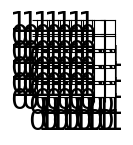

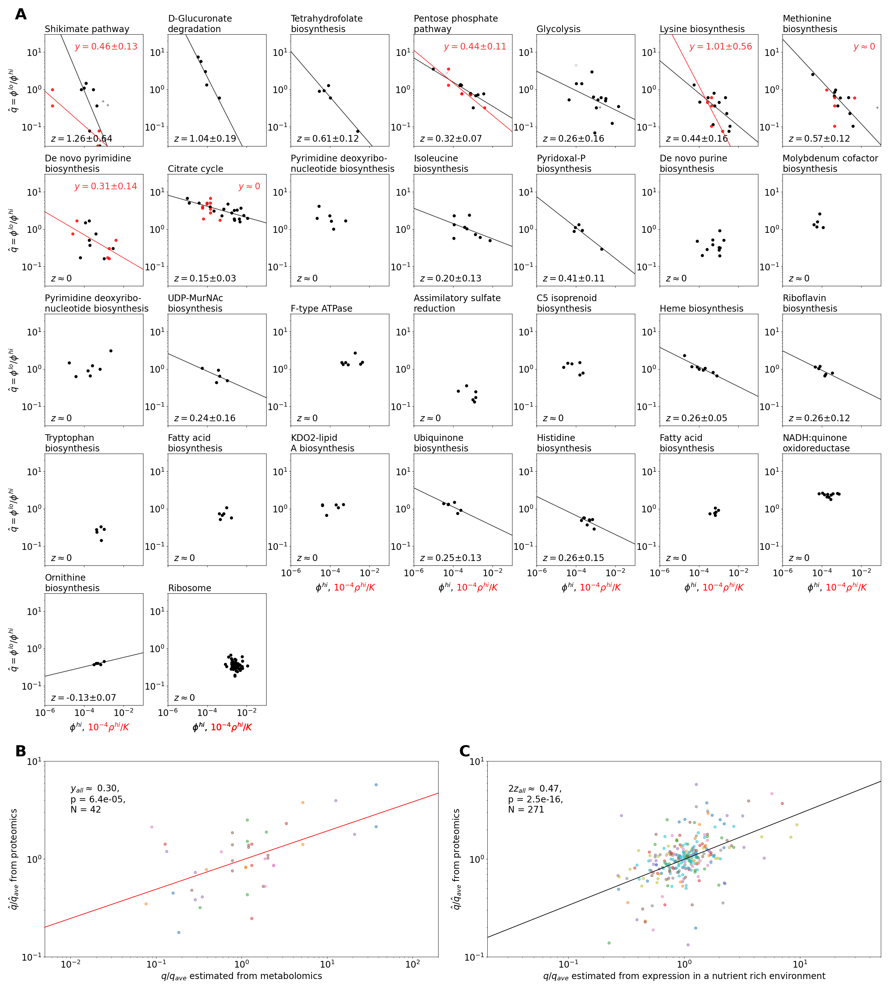

In [112]:
laws = True
exponent_proteome, exponent_metabolome = plotAnticorrelationFigure("Carbon", short = False)


-0.12831751370295258 1.254022141712238e-42
30 [5, 12, 20, 1, 0, 3, 4, 10, 2, 27, 24, 18, 9, 25, 26, 28, 22, 23, 15, 17, 19, 6, 14, 11, 16, 7, 13, 21, 8, 29]
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']
9.071351021981859e-27
0.23088233013720716
8.475927511551963e-11
[]
-1.3010299956639813
0


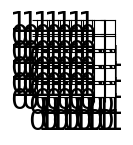

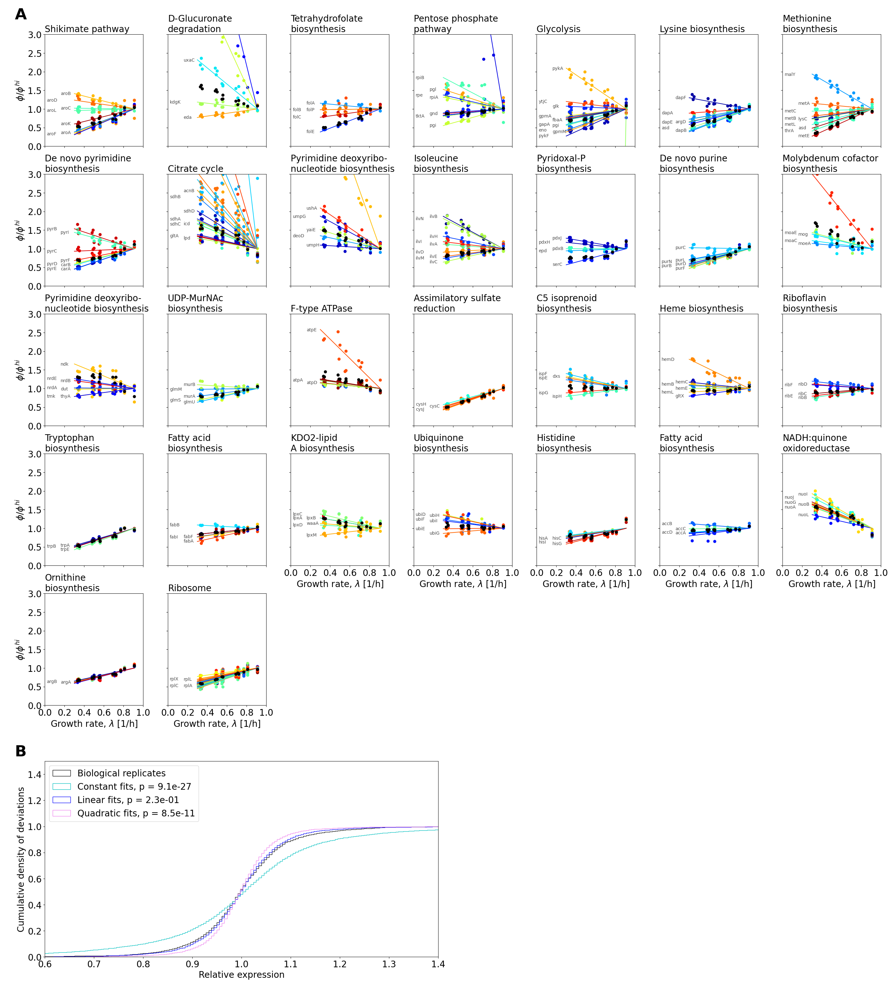

In [114]:
laws = False
exponent_proteome, exponent_metabolome = plotAnticorrelationFigure("Carbon", short = False, sigma = 10)


-0.12831751370295258 1.254022141712238e-42
30 [5, 12, 20, 1, 0, 3, 4, 10, 2, 27, 24, 18, 9, 25, 26, 28, 22, 23, 15, 17, 19, 6, 14, 11, 16, 7, 13, 21, 8, 29]
['C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'D6', 'D7', 'D8', 'F4', 'F5', 'F6', 'F7', 'F8']


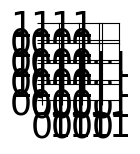

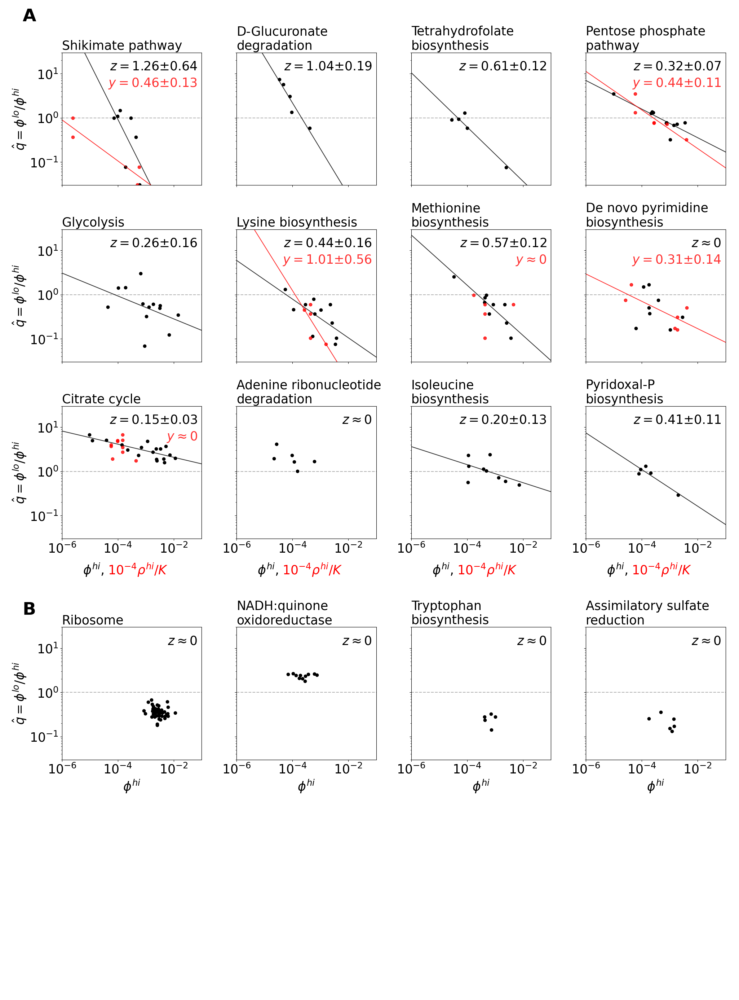

In [118]:
#Figures 3

anticorrelation = True
reverse = True
limitation = "Carbon"

def plotOnlyAnticorrelationFigure(limitation, sigma = sigma, short = True):
    nx = 4 #3
    ny = 4 #6
    font = {'size'   : int(25)}
    plt.rc('font', **font)
    plt.rcParams.update({'axes.titlesize': int(25)})
    fig, axs = plt.subplots(ny, nx, figsize=(1, 1)) ### replace this by gridspec

    fig = plt.figure(figsize = (25, 35))
    gs = gridspec.GridSpec(22, 20)
    gs.update(wspace=0, hspace=0)
    for n, ax in enumerate(axs.flatten()):
        i = int(n/nx) #row
        j = n%nx #column
        axs[i, j] = plt.subplot(gs[1+4*i+(n>=12):4+4*i+(n>=12), 1+5*j:5+5*j])
    
    if limitation == "Carbon":
        #Carbon limitation dataset
        grsall = [0.91, 0.77, 0.69, 0.56, 0.48, 0.35, 0.72, 0.56, 0.33, 0.49, 0.81, 0.71, 0.55, 0.5, 0.34]
        columnsall = ["C2", "C3", "C4", "C5", "C6", "C7", "C8", "D6", "D7", "D8", "F4", "F5", "F6", "F7", "F8"]

    dataset = pd.read_excel("/Users/leonseeger/Desktop/largeDBFiles/msb20209536-sup-0010-datasetev9.xlsx", sheet_name = "EV9-AbsoluteMassFractions-2", index_col = 1, header=6) 
    
    data = dataset[columnsall].to_numpy()
    grs = np.array(grsall)
    meangr = np.mean(grs)
    
    names = dataset[["Gene name"]].to_numpy()
    UniIDs = dataset[["Protein ID"]].to_numpy()
    means = np.mean(data, 1)
    #means[means == 0] = np.nan
    means[np.any(data == 0, axis = 1)] = np.nan
    slopes = np.sum((data.T-means).T*(grs-meangr), 1)/np.sum((grs-meangr)**2)
    offsets = means-slopes*meangr
    r2s = np.sum((data.T-means).T*(grs-meangr), 1)/np.sqrt(np.sum((grs-meangr)**2)*np.sum((data.T-means).T**2, 1))
    squares = np.sum((data - ((np.array([slopes]*len(grs)).T*grs).T+offsets).T)**2, 1)/means**2
    
    #ax = axs[0, 2]
    #x = means[~np.isnan(offsets)]
    #y = offsets[~np.isnan(offsets)]/means[~np.isnan(offsets)]
    x = (data[:, 0])[~np.isnan(means)]
    y = (data[:, -1]/data[:, 0])[~np.isnan(means)]
    validdata = np.all(np.array([x>0, y>0]), 0)
    y = np.log(y[validdata])
    x = np.log(x[validdata])
    
    x_data = np.copy(x)
    y_data = np.copy(y)
    #print(np.sum([y>1]/np.shape(y)[0]))
    
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    print(slope, p_value)

    vars = []
    for g in gooddb:
        path, unis = g 
        mask = []
        index = 0
        locals = ""
        for UniID in UniIDs:
            if UniID not in unis:
                mask.append(index)
            else:
                locals+=(UniID[0]+", ")
            index += 1
        #offsetsC = offsets+slopes*np.max(grs)
        offsetsC = np.copy(offsets)/(offsets+slopes*np.max(grs))
        offsetsC[mask] = np.nan
        vars.append(np.nanvar(np.log(offsetsC)))
        
    original_list = vars[:-1]
    sorted_list = sorted(original_list)
    sorting_list = list(range(len(original_list)))
    sorting_list.sort(key=lambda x: original_list[x])
    sorting_list = sorting_list[::-1]
    sorting_list.append(len(vars)-1)
    print(len(gooddb), sorting_list)

    print(columnsall)
    cmjet = plt.cm.get_cmap('jet')
    
    deviations = []
    basedeviations = []
    siglevels = []
    for n in range(ny*nx):
        if n<16:
            if n>=12:
                #Bpathways = ["path:eco03010", "md:eco_M00144", "md:eco_M00157", "md:eco_M00023", "md:eco_M00026", "md:eco_M00176"]
                Bpathways = ["path:eco03010", "md:eco_M00144", "md:eco_M00023", "md:eco_M00176"]
                allpathways = np.array([x[0] for x in gooddb])
                path = Bpathways[n-12]
                nlocal = np.where(allpathways == path)[0][0]
                unis = gooddb[nlocal][1]
            else:
                path, unis = gooddb[sorting_list[n]]
            name = pathway_names[path.split(":")[1]].split(" - ")[0].split(", ")[0].split("(")[0]
            ax2 = axs.flatten()[n]
            ax3 = ax2.twiny()
            
            mask = []
            index = 0
            locals = ""
            for UniID in UniIDs:
                if UniID not in unis:
                    mask.append(index)
                else:
                    locals+=(UniID[0]+", ")
                index += 1
            
            meansC = np.copy(means)
            meansC[mask] = np.nan
            
            localconcs = np.copy(concs)[~np.isnan(meansC)]#*0+1e-3
            localKMs = np.copy(KMs)[~np.isnan(meansC)]
            
            xs = data[~np.isnan(meansC)]
            localoffsets = offsets[~np.isnan(meansC)]
            localslopes = slopes[~np.isnan(meansC)]
            localnames = names[~np.isnan(meansC)]
            rich = (np.log((localoffsets+localslopes*grs[0]))+11)/12
            ys = (localoffsets+localslopes*0.2)/(localoffsets+localslopes*grs[0])
    
            deviation = np.mean((((localoffsets[:, None]+localslopes[:, None]*grs[None, :])-xs)/(localoffsets[:, None]+localslopes[:, None]*grs[None, :]))**2, axis = 1)
            
            scatterxs = localoffsets[deviation<(3*sigma)**2]+np.max(grs)*localslopes[deviation<(3*sigma)**2]#xs[deviation<0.05, 0]
            met_scatterxs = (localconcs/localKMs)[deviation<(3*sigma)**2]
            scatterys = localoffsets[deviation<(3*sigma)**2]/xs[deviation<(3*sigma)**2, 0]

            ax2.scatter(scatterxs[scatterys>0], scatterys[scatterys>0], color = "k")
            
            if not short:
                ax2.scatter(scatterxs[scatterys<0], (xs[deviation<(3*sigma)**2, -1]/xs[deviation<(3*sigma)**2, 0])[scatterys<0], color = "k", alpha = 0.5, marker = "+")
                ax2.scatter(xs[deviation>(3*sigma)**2, 0], xs[deviation>(3*sigma)**2, -1]/xs[deviation>(3*sigma)**2, 0], color = "k", alpha = 0.2, marker = "x")

            allxs = np.linspace(-7, 7, 10)
            slope, intercept, r_value, p_value, std_err = linregress(np.log10(scatterxs[scatterys>0]), np.log10(scatterys[scatterys>0]))
            #ax2.text(2e-7, 7e-2, r"$\frac{d\ln \xi}{d \ln \phi^{hi}}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
            if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                ax2.text(7e-2, 1.2e1, r"$z \approx 0$", horizontalalignment = "right")
            elif (short and n>=12):
                ax2.text(7e-2, 1.2e1, r"$z \approx 0$", horizontalalignment = "right")
            else:
                #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                #ax2.text(2e-6, 4e-2, r"$z = $"+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                ax2.text(7e-2, 1.2e1, r"$z = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err, horizontalalignment = "right")
                ax2.plot(10**(allxs), 10**(slope*allxs+intercept), color = "k", linestyle = "-", alpha = 0.8)
            #print(name, "%.3f"%slope,r_value, p_value, std_err)
            
            ax2.plot(10**(allxs), 10**(0*allxs), color = "k", linestyle = "--", alpha = 0.3)
            #ax2.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1/2*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
            #print(scatterxs, scatterys)
            #siglevels.append(slope/std_err)
            siglevels.append(np.log10(p_value)*slope/np.abs(slope))


            if path in Pathways_metabolome:
                ax3.scatter(met_scatterxs[scatterys>0], scatterys[scatterys>0], color = "r", alpha = 0.8)
                allxs = np.linspace(-7, 7, 10)
                try:
                    slope, intercept, r_value, p_value, std_err = linregress(np.log10(met_scatterxs[(scatterys>0)*(~np.isnan(met_scatterxs))]), np.log10(scatterys[(scatterys>0)*(~np.isnan(met_scatterxs))]))
                    #ax2.text(2e-4, 7e-2, r"$\frac{d\ln \xi}{d \ln (\rho_i/K_i)}$ = "+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err)
                    if ~(np.abs(slope)-1.5*np.abs(std_err)>0):
                        ax3.text(7e2, 5, r"$y \approx 0$", horizontalalignment='right', color = "r", alpha = 0.8)
                    else:
                        #print(n, (np.abs(slope)-1.5*np.abs(std_err)>0), (short and n>12))
                        #ax3.text(5e2, 1.2e1, r"$\tilde{z} = $"+"%.2f"%slope+r"$\pm$"+"%.2f"%std_err, horizontalalignment='right', color = "r", alpha = 0.8)
                        ax3.text(7e2, 5, r"$y = $"+"%.2f"%(-slope)+r"$\pm$"+"%.2f"%std_err, horizontalalignment='right', color = "r", alpha = 0.8)
                        ax3.plot(10**(allxs), 10**(slope*allxs+intercept), color = "r", linestyle = "-", alpha = 0.8)
                    #print(name, "%.3f"%slope,r_value, p_value, std_err)
                    #print(slope, std_err)
                    #ax3.spines['top'].set_color('r') 
                    #ax3.tick_params(axis='x', colors='r')
                except:
                    print("no data")
                
                #ax3.plot(10**(allxs+np.nanmean(np.log10(scatterxs))), 10**(-1*allxs+np.nanmean(np.log10(scatterys))), color = "k", linestyle = "--", alpha = 0.5)
            

            if len(name)<20:
                ax2.set_title(name, loc = "left")
            else:
                parts = name[int(len(name)/2)-2:].split(" ")
                sep = ""
                for part in parts[1:]:
                    sep = sep+" "+part
                try:
                    ax2.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")
                except:
                    sep = name.split(" ")[-2]
                    ax2.set_title(name.split(sep)[0]+"\n"+sep[1:], loc = "left")

        else: 
            axs.flatten()[n].axis("off")

        
        ax2.set_ylim(0.03, 30)
        ax2.set_xlim(1e-6, 1e-1)
        ax2.set_xscale("log")
        ax2.set_yscale("log")

        ax3.set_xlim(1e-2, 1e3)
        ax3.set_xscale("log")
        
        ax3.set_xticklabels([])
        ax3.set_xticks([])
            
        if n in np.arange(ny)*nx:
            ax2.set_ylabel(r"$\hat q = \phi^{lo}/\phi^{hi}$")
        else:
            ax2.set_yticklabels([])

        if n in [0, 1, 2, 3, 4, 5, 6, 7]:
            ax2.set_xticklabels([])
        elif n in [8, 9, 10, 11]:
            multicolor_xlabel(ax2,(r"$\phi^{hi}$, ", r"$10^{-4} \rho^{hi}/K$"),('k','r'), short = short)
        else:
            ax2.set_xlabel(r"$\phi^{hi}$")

    
    # add a big axes, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axes
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)

    fig.tight_layout()

    fig.text(0.12, 0.87, "A",weight="bold", fontsize = 35)
    fig.text(0.12, 0.40, "B",weight="bold", fontsize = 35)
    #plt.savefig("16Pathways_CarbonLimitation.pdf", bbox_inches="tight", format = 'pdf')
    
    return 

plotOnlyAnticorrelationFigure(limitation, sigma = sigma)

In [120]:
#Code for selection
def landscape(sumoverkappa, sumKMoverkappa, j1):
    return (-1-j1*sumoverkappa + np.sqrt((1+j1*sumoverkappa)**2+4*j1*(sumKMoverkappa**2-sumoverkappa)))/(2*(sumKMoverkappa**2-sumoverkappa))

simkappas = np.array([3e1]*20)
simKMs = np.array([1e-4]*20)

lammax = 1/np.sum(1/simkappas)  #2
eps = np.sum(np.sqrt(lammax*simKMs/simkappas)) #0.1

print(lammax, eps)
sumoverkappa = 1/lammax
sumKMoverkappa = eps/np.sqrt(lammax)

j1max = lammax+2/3*eps

print(landscape(sumoverkappa, sumKMoverkappa, j1max), lammax-4/3*eps)

epss = np.linspace(0, 1, 10)
lammaxs = np.linspace(0, 1, 10)

kappas = 10**np.random.normal(2.1, 1.1, 19)
KMs = 10**np.random.normal(-4.2, 1.3, 19)

print(np.exp(np.nanmean(np.log(kappas))))
print(np.exp(np.nanmean(np.log(KMs))))
      
basesumoverkappa = np.sum(1/kappas)
basesumKMoverkappa = np.sum(np.sqrt(KMs/kappas))
print(basesumoverkappa, basesumKMoverkappa)

logkappai = np.linspace(-2, 5, 300)
logKMi = np.linspace(-7, 0, 300)

x, y = np.meshgrid(logkappai, logKMi) ### x is log kappa, y is log KM
j1max = 1/basesumoverkappa*(1+2/3*np.sqrt(basesumoverkappa)*basesumKMoverkappa)
height = landscape(basesumoverkappa+10**(-x), basesumKMoverkappa+10**(y/2-x/2), j1max)


1.5 0.0447213595499958
1.4484378298283787 1.4403715206000056
117.50130241220343
0.00010791356156237858
7.603663690700407 0.16862394097024588


In [122]:
params = pd.read_excel("/Users/leonseeger/Downloads/bi2002289_si_003.xls", sheet_name = "1. KineticTable", index_col = 1, header=0) 
print(params.keys())
BarEvenOrganisms = params['Organism ID'].to_numpy()

BarEvenKMs = params['KM (µM)'].to_numpy()#[BarEvenOrganisms == 6] #constrain analysis to E. coli with ID 6
BarEvenkcats = params['kcat (1/sec)'].to_numpy()#[BarEvenOrganisms == 6] #constrain analysis to E. coli with ID 6
#plt.scatter(np.log10(BarEvenkcats), np.log10(BarEvenKMs), alpha = 0.1, s= 5)
slope, intercept, r_value, p_value, std_err = linregress(np.log10(BarEvenkcats)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))], np.log10(BarEvenKMs)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))])
print(slope)
print(len(np.log10(BarEvenkcats)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]))
print(np.mean(np.log10(BarEvenkcats)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]))
print(np.mean(np.log10(BarEvenKMs)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]))
print(np.std(np.log10(BarEvenkcats)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]))
print(np.std(np.log10(BarEvenKMs)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]))
xs = np.random.lognormal(0, 1.4*np.log(10), 4500)
ys = np.random.lognormal(0, 1.3*np.log(10), 4500)
#plt.scatter(np.log10(10**1.035*xs), np.log10(10**1.99*(xs)**0.27*ys), alpha = 0.1, s=5)

x1, y1 = np.meshgrid(np.linspace(-8, 8, 1000), np.linspace(-8, 8, 1000)) ### x is log kappa, y is log KM
#plt.pcolormesh(x1, y1, np.exp(-(x1-1.03)**2/2/var-(y1-0.276*(x1-np.mean(np.log10(kappas)))-1.99)**2/2/var2), cmap = "Blues", alpha = 0.5)

#plt.xlim(-4, 6)
#plt.ylim(-2, 6)

BEkcats = np.log10(BarEvenkcats)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]
BEKMs = np.log10(BarEvenKMs)[(~np.isnan(BarEvenkcats))*(~np.isnan(BarEvenKMs))]

slope, intercept, r_value, p_value, std_err = linregress(BEkcats, BEKMs)
print("alpha = ", slope)

Index(['EC1', 'EC3', 'EC4', 'Compound Id (KEGG)', 'Reaction ID (KEGG)',
       'Reaction direction (KEGG)', 'Organism ID', 'Publication ID',
       'Temperature', 'pH', 'KM (µM)', 'kcat (1/sec)'],
      dtype='object')
0.2763155061149797
4550
1.034667220901066
1.9961775377175137
1.4199060008339797
1.313508574230674
alpha =  0.2763155061149797


-1.1540867112640747 -0.38023644492430964 -0.05364983671752254 -0.8167036875035265
1.0009389069078485


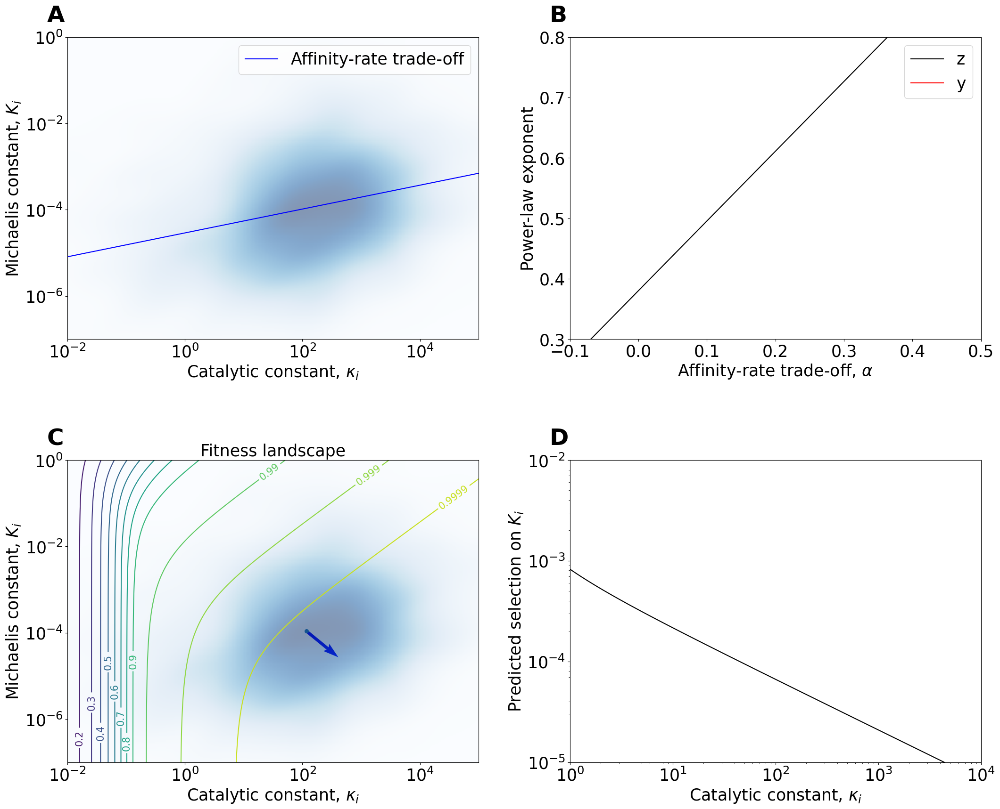

In [124]:
#Extended Data Figure 3
#Note that the parameterization of the landscape is selected randomly in the code block above
fig, axs = plt.subplots(1, 5, figsize = (25, 20))
for ax in axs.flatten():
    ax.axis("off")
gs = fig.add_gridspec(12, 20)
gs.update(wspace=0, hspace=0)
axs[0] = plt.subplot(gs[:5, :9])
axs[1] = plt.subplot(gs[:5, 11:])
axs[2] = plt.subplot(gs[7:, :9])
axs[3] = plt.subplot(gs[7:, 11:])

corrcoeffs = np.mean((np.log(fullensemble[:, 0, 1, 1:])-np.mean(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)[:, None])*(np.log(fullensemble[:, 0, 0, 1:])-np.mean(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)[:, None]), axis = 1)/np.std(np.log(fullensemble[:, 0, 1, 1:]), axis = 1)/np.std(np.log(fullensemble[:, 0, 0, 1:]), axis = 1)
Anticorrelations = []
for j in range(len(fullensemble[:, 0, 0, 0])):
    slope1, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 4, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
    slope2, intercept, r_value, p_value, std_err = linregress(np.log(fullensemble[j, 0, 3, :-1]/fullensemble[j, 0, 1, :-1]),np.log(fullensemble[j, -1, 4, :-1]/fullensemble[j, 0, 4, :-1]))
    Anticorrelations.append([slope1, slope2])
Anticorrelations = np.array(Anticorrelations)
#axs[1].scatter(corrcoeffs, Anticorrelations[:, 0], "k")
#axs[1].scatter(corrcoeffs, Anticorrelations[:, 1], "r")
slopez, interceptz, r_value, p_value, std_err = linregress(corrcoeffs[~np.isnan(Anticorrelations[:, 0])], Anticorrelations[:, 0][~np.isnan(Anticorrelations[:, 0])])
slopey, intercepty, r_value, p_value, std_err = linregress(corrcoeffs[~np.isnan(Anticorrelations[:, 1])], Anticorrelations[:, 1][~np.isnan(Anticorrelations[:, 1])])
print(slopez, interceptz, slopey, intercepty)
axs[1].plot(np.linspace(-0.5, 0.5, 10), -(interceptz+slopez*np.linspace(-0.5, 0.5, 10)), "k-", label = "z")
axs[1].plot(np.linspace(-0.5, 0.5, 10), -(intercepty+slopey*np.linspace(-0.5, 0.5, 10)), "r-", label = "y")
#axs[1].plot(np.linspace(-0.5, 0.5, 10), (0.5+0.5*np.linspace(-0.5, 0.5, 10)), "k--", label = "z (from theory)")
axs[1].legend()
axs[1].set_ylabel("Power-law exponent")
axs[1].set_xlabel(r"Affinity-rate trade-off, $\alpha$")
axs[1].set_xlim(-0.1, 0.5)
axs[1].set_ylim(0.3, 0.8)

logkappai = np.linspace(-2, 5, 300)
logKMi = np.linspace(-7, 0, 300)

x, y = np.meshgrid(logkappai, logKMi) ### x is log kappa, y is log KM

heightf = 1/(basesumoverkappa+10**(-x))-4/3*1/(basesumoverkappa+10**(-x))**(3/2)*(basesumKMoverkappa+10**(y/2-x/2))

var = 1.3**2
var2 = 1.1**2

j1 = j1max/2.4
Ne = 1e4
rawheight = landscape(basesumoverkappa+10**(-x), basesumKMoverkappa+10**(y/2-x/2), j1)
entropy = (y-x/0.6)/2/Ne/np.log10(np.exp(1))+0.0018
height = rawheight/np.max(rawheight)+entropy

levels = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99, 0.999, 0.9999, 0.99995])
entlevels = np.arange(0.0000, 0.003, 0.0002)*2*Ne
RYG = plt.cm.get_cmap('viridis')
Blues = plt.cm.get_cmap('Blues')
colors = RYG(np.linspace(0, 1, len(levels)))
entcolors = Blues(np.linspace(0, 1, len(entlevels)))
leveldict = {}
for level in levels:
    leveldict[level]=(r"$-%g$"%((1-level)*2*Ne))

CS0 = axs[2].contour(x, y, rawheight/np.max(rawheight), levels = levels[:-1], colors = colors[:-1])
axs[2].clabel(CS0, CS0.levels, fontsize=15, fmt = '%g')

print(np.max(height))
dx = 0.01
gradient_x = (landscape(basesumoverkappa+10**(-(np.mean(np.log10(kappas))+dx)), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2-dx/2), j1) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1))/dx
gradient_y = (landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**((np.mean(np.log10(KMs/kappas))+dx)/2), j1) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1))/dx

axs[2].quiver([np.mean(np.log10(kappas))], [np.mean(np.log10(KMs))], [gradient_x/np.sqrt(gradient_x**2+gradient_y**2)], [gradient_y/np.sqrt(gradient_x**2+gradient_y**2)], scale = 10, color = "b")#[gradient_x], [gradient_y], scale = 10**(-2.5-1.1*i))

xy = np.vstack([BEkcats-np.mean(BEkcats)+np.mean(np.log10(kappas)),BEKMs-np.mean(BEKMs)+np.mean(np.log10(KMs))])
z = gaussian_kde(xy)
zi = z(np.vstack([x.flatten(), y.flatten()]))

lams = np.linspace(0.05, 0.95, 50)
dx = 0.01
gradient_kappa = (landscape(basesumoverkappa+10**(-(np.mean(np.log10(kappas))+dx)), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*lams) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*lams))/dx
gradient_kappaoverKM = (landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**((np.mean(np.log10(KMs/kappas))+dx)/2), j1max*lams) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*lams))/dx

slope, intercept, r_value, p_value, std_err = linregress(xy)
axs[2].scatter(np.mean(np.log10(kappas)), np.mean(np.log10(KMs)), 30, marker = "o")
axs[0].plot((x[0, :]), (intercept+slope*x[0, :]), "b-", label = r"Affinity-rate trade-off")
axs[0].legend()
for ax in [axs[0], axs[2]]:
    ax.pcolormesh(x, y, zi.reshape(x.shape), cmap = "Blues", alpha = 0.5)
    ax.set_xlim(-2, 5)
    ax.set_ylim(-7, 0)
    ax.set_xticks([-2, 0, 2, 4])
    ax.set_yticks([-6, -4, -2, 0])
    ax.set_yticklabels([])
    ax.set_xticklabels([r"$10^{-2}$", r"$10^{0}$", r"$10^{2}$", r"$10^{4}$"])


    ax.set_xlabel(r"Catalytic constant, $\kappa_i$")
    ax.set_ylabel(r"Michaelis constant, $K_i$")
    ax.set_yticks([-6, -4, -2, 0])
    ax.set_yticklabels([r"$10^{-6}$", r"$10^{-4}$", r"$10^{-2}$", r"$10^{0}$"])

axs[2].set_title("Fitness landscape")

lams = np.linspace(0.05, 0.95, 50)
dx = 0.1
gradient_kappa = (landscape(basesumoverkappa+10**(-(np.mean(np.log10(kappas))+dx)), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*lams) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*lams))/dx
gradient_kappaoverKM = (landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**((np.mean(np.log10(KMs/kappas))+dx)/2), j1max*lams) - landscape(basesumoverkappa+10**(-np.mean(np.log10(kappas))), basesumKMoverkappa+10**(np.mean(np.log10(KMs/kappas))/2), j1max*lams))/dx

gradient_KMs = -(landscape(basesumoverkappa+10**(-logkappai), basesumKMoverkappa+10**(np.mean(np.log10(KMs)+dx)/2-logkappai/2), j1)/landscape(basesumoverkappa+10**(-logkappai), basesumKMoverkappa+10**(np.mean(np.log10(KMs))/2-logkappai/2), j1)-1)/dx
#print(gradient_KMs)

#conditional_y = np.sum(np.exp(2*Ne*(height-np.max(height)))*y, axis = 0)/np.sum(np.exp(2*Ne*(height-np.max(height))), axis = 0)

axs[3].plot(10**logkappai, gradient_KMs, "k")
axs[3].set_xscale("log")
axs[3].set_yscale("log")
axs[3].set_ylim(1e-5, 1e-2)
axs[3].set_xlabel(r"Catalytic constant, $\kappa_i$")
axs[3].set_ylabel(r"Predicted selection on $K_i$")
axs[3].set_xlim(1e0, 1e4)


for n, ax in enumerate([axs[0], axs[1], axs[2], axs[3]]):
    ax.text(-0.05, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold', size = 35)
    
fig.tight_layout()
#plt.savefig("2DLandscape_Kk_simple.pdf")


In [128]:
#Code for regulation

Nenzymes = 20
filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

index = np.where((fullensemble[:, 0, 3, -1]<1)*(fullensemble[:, 0, 1, -1]>1e-5))[0][1]
onechain = fullensemble[index]

def Pproduction(rho, KM, kappa, sumoverkappa, sumKMoverkappa):
    phii0 = KM/kappa/(np.sqrt(KM/kappa)*sumKMoverkappa)
    ai = (1/kappa/sumoverkappa-phii0)
    Kregi = np.sqrt(KM/kappa)*sumKMoverkappa/sumoverkappa
    return phii0 +ai/(1+Kregi/rho)
    #return 1/kappa*(rho+KM)/(rho*sumoverkappa+np.sqrt(KM/kappa)*sumKMoverkappa)

def Rproduction(phi, rho, KM, kappa):
    return kappa*phi/(1+KM/rho)

def iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 500000):
    sumoverkappa = np.sum(1/kappas)
    sumKMoverkappa = np.sum(np.sqrt(KMs/kappas))
    phis = phistart
    phis = phis/np.sum(phis)
    lam = 0
    rhos = KMs*np.sqrt(phistart/KMs)
    rhos[-1] = nu
    
    dt = 1e-5
    savephis = [phis]
    saverhos = [rhos]
    times = [0]
    steps = np.arange(Nsteps)
    for i in steps:
        fluxes = Rproduction(phis, rhos, KMs, kappas)
        shiftedfluxes = np.append(fluxes[1:], np.zeros(1))
        drhos = -lam*rhos-fluxes+shiftedfluxes
        
        dMs = Pproduction(rhos, KMs, kappas, sumoverkappa, sumKMoverkappa)*(1-phiUptake)
        dMs = dMs/np.sum(dMs[:-1])*(1-phiUptake)
        dMs[-1] = phiUptake
        
        phis += (-lam*phis+lam*dMs/np.sum(dMs))*dt
        phis = phis/np.sum(phis)
        rhos += drhos*dt
        
        lam = fluxes[0]
        rhos[-1] = nu
        rhos[rhos<0] = 1e-15
        if i%100 == 0:
            times.append(dt*steps[i])
            savephis.append(phis)
            saverhos.append(np.copy(rhos))
            
    savephis = np.array(savephis)
    saverhos = np.array(saverhos)
    
    #fig, axs = plt.subplots(1, 2, figsize = (15, 5))
    allrhos = np.logspace(-3, 3, 100)
    productions = []
    
    for rho in allrhos:
        productions.append(Pproduction(rho*KMs, KMs, kappas, sumoverkappa, sumKMoverkappa))
    productions = np.array(productions)
    
    return times, saverhos, savephis, allrhos, productions[:, 0]/productions[-1, 0], rhos, phis, fluxes

reduction0 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.01))
reduction1 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/2))
reduction2 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.5))

richref = onechain[reduction0]
ref = onechain[reduction1]
ref2 = onechain[reduction2]

kappas = richref[0]
KMs = richref[1]
phistart = ref2[4]*np.random.lognormal(0, 2, 20)
richref = onechain[0]
nu = richref[3, -1]
phimin = richref[4, -1]
phimax = 5*phimin/(1+(5-1)*phimin)
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times0, saverhos0, savephis0, allrhos0, normproductions0, rhos0, phis0, fluxes0 = iterate(phistart, KMs, kappas, nu, phiUptake)

#phistart = richref[4]*np.random.lognormal(0, 2, 20)
phistart = np.copy(phis0)
nu = richref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times, saverhos, savephis, allrhos, normproductions, rhos, phis, fluxes = iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 250000)


phistart = np.copy(phis)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times2, saverhos2, savephis2, allrhos2, normproductions2, rhos2, phis2, fluxes2 = iterate(phistart, KMs, kappas, nu, phiUptake)


phistart = np.copy(phis2)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref2[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times3, saverhos3, savephis3, allrhos3, normproductions3, rhos3, phis3, fluxes3 = iterate(phistart, KMs, kappas, nu, phiUptake)

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)


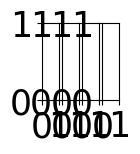

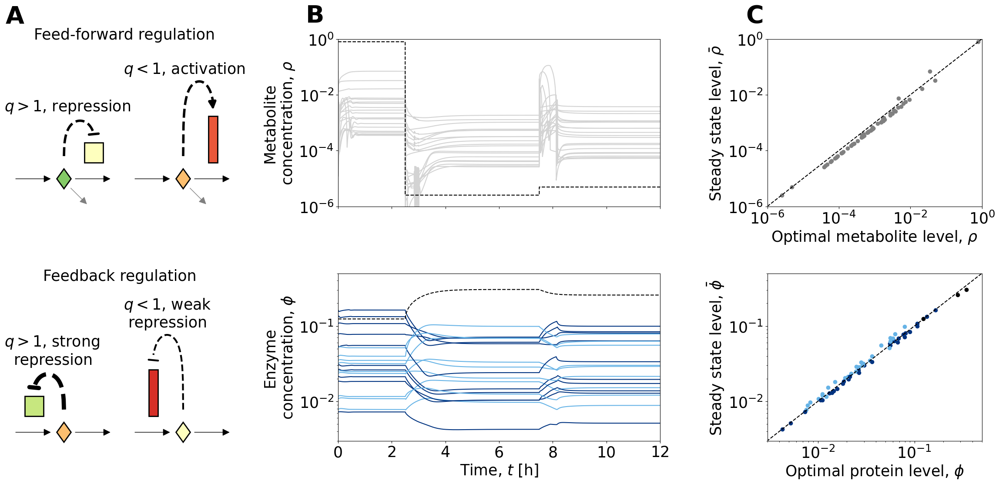

In [129]:
#Figure 4
#Note that the pathway's parameterization is random.

basecolors = np.array([[(0, 0.2, 0.5, 1.0), (0.1, 0.6, 0.05, 1.0), (0, 0.2, 0.5, 1.0)], 
                       [(0.4, 0.7, 0.9, 1.0), (0.4, 0.8, 0.3, 1.0), (0.4, 0.7, 0.9, 1.0)]])

times = np.array(times)
savephis = np.array(savephis)
saverhos = np.array(saverhos)
times2 = np.array(times2)
savephis2 = np.array(savephis2)
saverhos2 = np.array(saverhos2)
times3 = np.array(times3)
savephis3 = np.array(savephis3)
saverhos3 = np.array(saverhos3)

alltimes = np.concatenate((times, times2+times[-1], times3+times2[-1]+times[-1]))
allphis = np.concatenate((savephis, savephis2, savephis3))
allrhos = np.concatenate((saverhos, saverhos2, saverhos3))

lammax = 1/np.sum(1/kappas)
Qs = np.sqrt(kappas*KMs)
qis = Qs/(np.sum(Qs/kappas)*lammax)

RYG = plt.cm.get_cmap('RdYlGn')


font = {'size'   : 25}
plt.rc('font', **font)
dt = 1e-5
fig, axs = plt.subplots(1, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(12, 11)
gs.update(wspace=0, hspace=0)
axs[0] = plt.subplot(gs[:6, 2:3])
ax0 = plt.subplot(gs[:6, 3:4])
ax10 = plt.subplot(gs[6:, 2:3])
ax11 = plt.subplot(gs[6:, 3:4])

axs[1] = plt.subplot(gs[:5, 5:8])
ax1 = plt.subplot(gs[7:, 5:8])
ax2 = plt.subplot(gs[7:, 9:])
axs[2] = plt.subplot(gs[:5, 9:])
#axs[2, 2] = plt.subplot(gs[7:10, 9:])
#axs[3, 0] = plt.subplot(gs[11:13, 1:6])
#axs[3, 1] = plt.subplot(gs[11:13, 7:])
#axs[4, 0] = plt.subplot(gs[14:17, 1:4])
#axs[4, 1] = plt.subplot(gs[14:17, 5:8])
#axs[4, 2] = plt.subplot(gs[14:17, 9:])
isample = 0
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

j = 1
axs[0].annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
axs[0].annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
axs[0].annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

axs[0].plot(j+1+xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 4)
axs[0].add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
axs[0].add_patch(plt.Polygon([[j+1-.16/j+.5, 2*1.3*j], [j+1-.16/j+.5, 2/1.3], [j+1+.16/j+.5, 2/1.3], [j+1+.16/j+.5, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
axs[0].annotate("", xy = (j+1.4, 3.2), xytext = (j+1.6, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 4))
#axs[0].annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
axs[0].text(1, 6, "$q>1$, repression")

axs[0].text(1.5, 40, "Feed-forward regulation")

axs[0].set_yscale("log")
axs[0].set_xlim(1.2, 3)
axs[0].set_ylim(0.2, 40)
axs[0].axis("off")

j = 2
ax0.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax0.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax0.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax0.plot(j+xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 4)
ax0.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
ax0.add_patch(plt.Polygon([[j-.16/j+.5, 2*1.3*j], [j-.16/j+.5, 2/1.3], [j+.16/j+.5, 2/1.3], [j+.16/j+.5, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
ax0.annotate("", xy = (j+.505, 3*2), xytext = (j+.495, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
#ax0.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
ax0.text(1, 16, "$q<1$, activation")

ax0.set_yscale("log")
ax0.set_xlim(1, 2.8)
ax0.set_ylim(0.2, 40)
ax0.axis("off")

isample = 1
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

j = 1
ax10.annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax10.annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax10.annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax10.plot(j+1-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 7)
ax10.add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-5*j)/(vmax-vmin))))
ax10.add_patch(plt.Polygon([[j+1-.16/j+.5-1, 2*1.3*j], [j+1-.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-1.2*j)/(vmax-vmin))))   
ax10.annotate("", xy = (j-1+1.6, 3.2), xytext = (j-1+1.4, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 7))
#ax10.annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
ax10.text(1, 6, r"$q > 1$, strong"+"\n  repression")

ax10.text(1.65, 55, "Feedback regulation")

ax10.set_yscale("log")
ax10.set_xlim(1.2, 3)
ax10.set_ylim(0.8, 160)
ax10.axis("off")

j = 2
ax11.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax11.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
ax11.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))

ax11.plot(j-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 3)
ax11.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2*j)/(vmax-vmin))))
ax11.add_patch(plt.Polygon([[j-.16/j+.5-1, 2*1.3*j], [j-.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2.2*j)/(vmax-vmin))))   
ax11.annotate("", xy = (j-1+.6, 3.3*2), xytext = (j-1+.4, 3.4*2), arrowprops=dict(arrowstyle="-", color='k', linewidth = 3))
#ax11.annotate("", xy = (j-1+.495, 3*2), xytext = (j-1+.505, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
#ax11.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
ax11.text(1, 16, r"$q < 1$, weak"+"\n repression")

ax11.set_yscale("log")
ax11.set_xlim(1, 2.8)
ax11.set_ylim(0.8, 160)
ax11.axis("off")


xs = np.linspace(0, 0.5, 100)


for i in range(Nenzymes-1):
    ax1.plot(alltimes, allphis[:, i], color = basecolors[int(qis[i]>1), 0])#RYG(np.log(qis)[i]/4+1/2))
    axs[1].plot(alltimes, allrhos[:, i], color = "lightgrey")

i = Nenzymes-1
ax1.plot(alltimes, allphis[:, i], color = "k", linestyle = "--")
axs[1].plot(alltimes, allrhos[:, i], color = "k", linestyle = "--")

ax1.set_yscale("log")
axs[1].set_yscale("log")
axs[1].set_xlabel("")
ax1.set_ylabel("Enzyme\n"+r"concentration, $\phi$")
axs[1].set_ylabel("Metabolite\n"+r"concentration, $\rho$")
ax1.set_ylim(3e-3, 5e-1)
axs[1].set_ylim(1e-6, 1e0)
ax1.set_xlabel("Time, $t$ [h]")
axs[1].set_xlim(0, 12)
ax1.set_xlim(0, 12)
axs[1].set_xticklabels([])

axs[2].scatter(richref[3], rhos, color = "grey")
axs[2].scatter(ref[3], rhos2, color = "grey")
axs[2].scatter(ref2[3], rhos3, color = "grey")
axs[2].plot([1e-6, 1], [1e-6, 1], "k--")
axs[2].set_xscale("log")
axs[2].set_yscale("log")
axs[2].set_xlim(1e-6, 1)
axs[2].set_ylim(1e-6, 1)
axs[2].set_ylabel(r"Steady state level, $\bar \rho$")
axs[2].set_xlabel(r"Optimal metabolite level, $\rho$")
#axs[3].set_xlabel("Optimal resource allocation")
#axs[3].set_ylabel("Regulatory steady state")

for i in range(Nenzymes-1):
    ax2.scatter(richref[4, i], phis[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref[4, i], phis2[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref2[4, i], phis3[i], color = basecolors[int(qis[i]>1), 0])
    
i = Nenzymes -1
ax2.scatter(richref[4, i], phis[i], color = "k")
ax2.scatter(ref[4, i], phis2[i], color = "k")
ax2.scatter(ref2[4, i], phis3[i], color = "k")

ax2.plot([1e-3, 1], [1e-3, 1], "k--")
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_xlim(3e-3, 5e-1)
ax2.set_ylim(3e-3, 5e-1)
ax2.set_xlabel(r"Optimal protein level, $\phi$")
ax2.set_ylabel(r"Steady state level, $\bar \phi$")
#ax2.yaxis.set_label_coords(-0.25, 1.25)

#fig.tight_layout()
for n, ax in enumerate([axs[0], axs[1], axs[2]]): 
    if n == 0:
        ax.text(-0.1, 1.08, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold', fontsize = 40)
    else:
        ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold', fontsize = 40)

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/MainTextRegulation.pdf", bbox_inches="tight", format = 'pdf')

In [132]:
#Regulation code for feed-back control
def Pproduction_fb(rho, KM, kappa, KMplus1, kappaplus1, sumoverkappa, sumKMoverkappa):
    phii0 = KM/kappa/(np.sqrt(KM/kappa)*sumKMoverkappa)
    ai = (1/kappa/sumoverkappa-phii0)
    Kregiplus1 = np.sqrt(KMplus1/kappaplus1)*sumKMoverkappa/sumoverkappa
    return phii0 +ai/(1+Kregiplus1/rho)

def iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 500000):
    sumoverkappa = np.sum(1/kappas)
    sumKMoverkappa = np.sum(np.sqrt(KMs/kappas))
    phis = phistart
    phis = phis/np.sum(phis)
    lam = 0
    rhos = KMs*np.sqrt(phistart/KMs)
    rhos[-1] = nu
    
    dt = 3e-5
    savephis = [phis]
    saverhos = [rhos]
    times = [0]
    steps = np.arange(Nsteps)
    for i in steps:
        fluxes = Rproduction(phis, rhos, KMs, kappas)
        shiftedfluxes = np.append(fluxes[1:], np.zeros(1))
        drhos = -lam*rhos-fluxes+shiftedfluxes

        dMs = Pproduction(rhos, KMs, kappas, sumoverkappa, sumKMoverkappa)*(1-phiUptake) #compute the last enzyme feed-forward
        dMs[1:] = Pproduction_fb(rhos[:-1], KMs[1:], kappas[1:], KMs[:-1], kappas[:-1], sumoverkappa, sumKMoverkappa)*(1-phiUptake) #all other by feed-back
        dMs = dMs/np.sum(dMs[:-1])*(1-phiUptake)
        dMs[-1] = phiUptake #and set the uptake by the constraint.
        
        phis += (-lam*phis+lam*dMs/np.sum(dMs))*dt
        phis = phis/np.sum(phis)
        rhos += drhos*dt
        
        lam = fluxes[0]
        rhos[-1] = nu
        rhos[rhos<0] = 1e-15
        if i%100 == 0:
            times.append(dt*steps[i])
            savephis.append(phis)
            saverhos.append(np.copy(rhos))
            
    savephis = np.array(savephis)
    saverhos = np.array(saverhos)
    
    #fig, axs = plt.subplots(1, 2, figsize = (15, 5))
    allrhos = np.logspace(-3, 3, 100)
    productions = []
    
    for rho in allrhos:
        productions.append(Pproduction(rho*KMs, KMs, kappas, sumoverkappa, sumKMoverkappa))
    productions = np.array(productions)
    
    return times, saverhos, savephis, allrhos, productions[:, 0]/productions[-1, 0], rhos, phis, fluxes

reduction0 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.01))
reduction1 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/2))
reduction2 = np.min(np.where(onechain[:, 5, 0] <= onechain[0, 5, 0]/1.5))

richref = onechain[reduction0]
ref = onechain[reduction1]
ref2 = onechain[reduction2]

kappas = richref[0]
KMs = richref[1]
phistart = ref2[4]#*np.random.lognormal(0, 2, 20)
richref = onechain[0]
nu = richref[3, -1]
phimin = richref[4, -1]
phimax = 5*phimin/(1+(5-1)*phimin)
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times0, saverhos0, savephis0, allrhos0, normproductions0, rhos0, phis0, fluxes0 = iterate(phistart, KMs, kappas, nu, phiUptake)

#phistart = richref[4]*np.random.lognormal(0, 2, 20)
phistart = np.copy(phis0)
nu = richref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times, saverhos, savephis, allrhos, normproductions, rhos, phis, fluxes = iterate(phistart, KMs, kappas, nu, phiUptake, Nsteps = 250000)


phistart = np.copy(phis)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times2, saverhos2, savephis2, allrhos2, normproductions2, rhos2, phis2, fluxes2 = iterate(phistart, KMs, kappas, nu, phiUptake)


phistart = np.copy(phis2)#richref[4]*np.random.lognormal(0, 1, 20)*ref[5, 0]/richref[5, 0]
nu = ref2[3, -1]
phiUptake = (1/phimax+(1/phimin-1/phimax)*nu/(nu+KMs[-1]))**(-1)

times3, saverhos3, savephis3, allrhos3, normproductions3, rhos3, phis3, fluxes3 = iterate(phistart, KMs, kappas, nu, phiUptake)

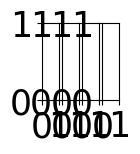

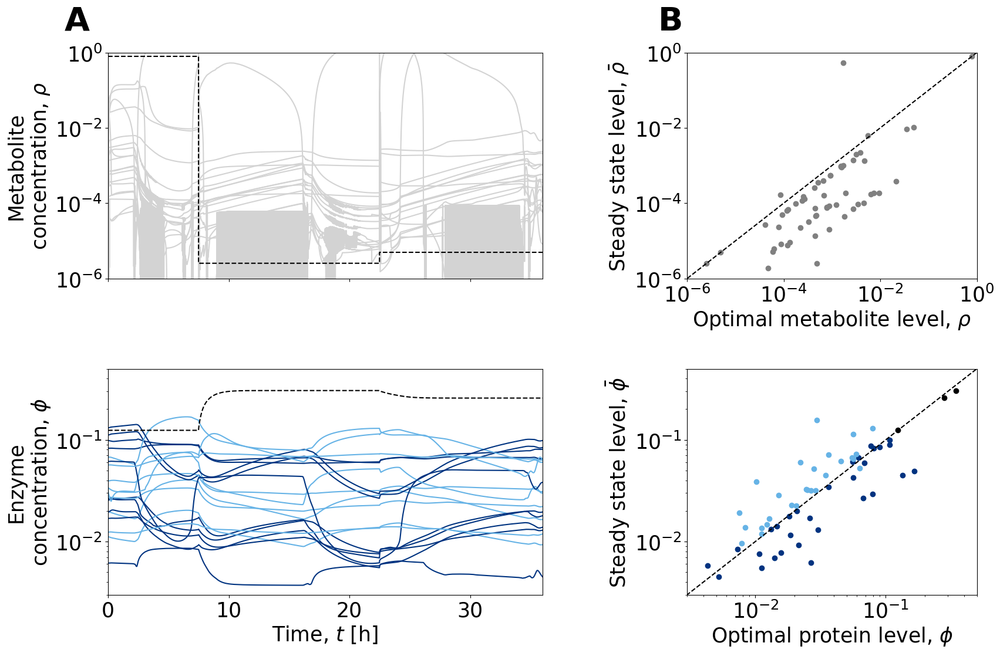

In [136]:
times = np.array(times)
savephis = np.array(savephis)
saverhos = np.array(saverhos)
times2 = np.array(times2)
savephis2 = np.array(savephis2)
saverhos2 = np.array(saverhos2)
times3 = np.array(times3)
savephis3 = np.array(savephis3)
saverhos3 = np.array(saverhos3)

alltimes = np.concatenate((times, times2+times[-1], times3+times2[-1]+times[-1]))
allphis = np.concatenate((savephis, savephis2, savephis3))
allrhos = np.concatenate((saverhos, saverhos2, saverhos3))

lammax = 1/np.sum(1/kappas)
Qs = np.sqrt(kappas*KMs)
qis = Qs/(np.sum(Qs/kappas)*lammax)

RYG = plt.cm.get_cmap('RdYlGn')


font = {'size'   : 25}
plt.rc('font', **font)
dt = 3e-5
fig, axs = plt.subplots(1, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(12, 11)
gs.update(wspace=0, hspace=0)

axs[1] = plt.subplot(gs[:5, 5:8])
ax1 = plt.subplot(gs[7:, 5:8])
ax2 = plt.subplot(gs[7:, 9:])
axs[2] = plt.subplot(gs[:5, 9:])
#axs[2, 2] = plt.subplot(gs[7:10, 9:])
#axs[3, 0] = plt.subplot(gs[11:13, 1:6])
#axs[3, 1] = plt.subplot(gs[11:13, 7:])
#axs[4, 0] = plt.subplot(gs[14:17, 1:4])
#axs[4, 1] = plt.subplot(gs[14:17, 5:8])
#axs[4, 2] = plt.subplot(gs[14:17, 9:])
isample = 0
xs = np.linspace(0, 0.5, 100)

vmin = -5
vmax = 1

if False:
    axs[0] = plt.subplot(gs[:6, 2:4])
    ax0 = plt.subplot(gs[6:, 2:4])
    j = 1
    axs[0].annotate("", xy = (j+0.8, 1), xytext = (j+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    axs[0].annotate("", xy = (j+1.8, 1), xytext = (j+1.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    axs[0].annotate("", xy = (j+1.4, .5), xytext = (j+1.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))
    
    axs[0].plot(j+1-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 7)
    axs[0].add_patch(plt.Polygon([[j+.88, 1], [j+1, 1.3], [j+1.12, 1], [j+1, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
    axs[0].add_patch(plt.Polygon([[j+1-.16/j+.5-1, 2*1.3*j], [j+1-.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2/1.3], [j+1+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
    axs[0].annotate("", xy = (j-1+1.6, 3.2), xytext = (j-1+1.4, 3.3), arrowprops=dict(arrowstyle="-", color='k', linewidth = 7))
    #axs[0].annotate(r"q>1", xy = (j+1.1, 5), xytext = (j+1.1, 5), arrowprops=dict(arrowstyle="-", color='white'))
    axs[0].text(1, 8, r"$q\gtrsim 1$, strong repression")
    
    
    axs[0].set_yscale("log")
    axs[0].set_xlim(1, 4)
    axs[0].set_ylim(0.2, 20)
    axs[0].axis("off")
    
    j = 2
    ax0.annotate("", xy = (j-1+0.8, 1), xytext = (j-1+0.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax0.annotate("", xy = (j+.8, 1), xytext = (j+.17, 1), arrowprops=dict(arrowstyle="-|>", color='k'))
    ax0.annotate("", xy = (j+.4, .5), xytext = (j+.1, 0.8), arrowprops=dict(arrowstyle="-|>", color='grey'))
    
    ax0.plot(j-xs, (1.4+j**2*8*np.sqrt(0.27**2-(xs-0.27)**2))*1.3, "k--", linewidth = 3)
    ax0.add_patch(plt.Polygon([[j-1+.88, 1], [j, 1.3], [j+.12, 1], [j, 1/1.3]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((7-2.5*j)/(vmax-vmin))))
    ax0.add_patch(plt.Polygon([[j-.16/j+.5-1, 2*1.3*j], [j-.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2/1.3], [j+.16/j+.5-1, 2*1.3*j]], edgecolor=(0, 0, 0, 1), clip_on=False, linewidth = 2, facecolor=RYG((5-2*j)/(vmax-vmin))))   
    ax0.annotate("", xy = (j-1+.6, 3.3*2), xytext = (j-1+.4, 3.4*2), arrowprops=dict(arrowstyle="-", color='k', linewidth = 3))
    #ax0.annotate("", xy = (j-1+.495, 3*2), xytext = (j-1+.505, 3.5*2), arrowprops=dict(arrowstyle="-|>", color='k', linewidth = 4))
    #ax0.annotate(r"q<1", xy = (j+.1, 5*3), xytext = (j+.1, 5*3), arrowprops=dict(arrowstyle="-", color='white'))
    ax0.text(1, 25, r"$q\lesssim 1$, weak repression")
    
    ax0.set_yscale("log")
    ax0.set_xlim(1, 4)
    ax0.set_ylim(0.4, 40)
    ax0.axis("off")


xs = np.linspace(0, 0.5, 100)


for i in range(Nenzymes-1):
    ax1.plot(alltimes, allphis[:, i], color = basecolors[int(qis[i]>1), 0])#RYG(np.log(qis)[i]/4+1/2))
    axs[1].plot(alltimes, allrhos[:, i], color = "lightgrey")

i = Nenzymes-1
ax1.plot(alltimes, allphis[:, i], color = "k", linestyle = "--")
axs[1].plot(alltimes, allrhos[:, i], color = "k", linestyle = "--")

ax1.set_yscale("log")
axs[1].set_yscale("log")
axs[1].set_xlabel("")
ax1.set_ylabel("Enzyme\n"+r"concentration, $\phi$")
axs[1].set_ylabel("Metabolite\n"+r"concentration, $\rho$")
ax1.set_ylim(3e-3, 5e-1)
axs[1].set_ylim(1e-6, 1e0)
ax1.set_xlabel("Time, $t$ [h]")
axs[1].set_xlim(0, 36)
ax1.set_xlim(0, 36)
axs[1].set_xticklabels([])

axs[2].scatter(richref[3], rhos, color = "grey")
axs[2].scatter(ref[3], rhos2, color = "grey")
axs[2].scatter(ref2[3], rhos3, color = "grey")
axs[2].plot([1e-6, 1], [1e-6, 1], "k--")
axs[2].set_xscale("log")
axs[2].set_yscale("log")
axs[2].set_xlim(1e-6, 1)
axs[2].set_ylim(1e-6, 1)
axs[2].set_ylabel(r"Steady state level, $\bar \rho$")
axs[2].set_xlabel(r"Optimal metabolite level, $\rho$")
#axs[3].set_xlabel("Optimal resource allocation")
#axs[3].set_ylabel("Regulatory steady state")

for i in range(Nenzymes-1):
    ax2.scatter(richref[4, i], phis[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref[4, i], phis2[i], color = basecolors[int(qis[i]>1), 0])
    ax2.scatter(ref2[4, i], phis3[i], color = basecolors[int(qis[i]>1), 0])
    
i = Nenzymes -1
ax2.scatter(richref[4, i], phis[i], color = "k")
ax2.scatter(ref[4, i], phis2[i], color = "k")
ax2.scatter(ref2[4, i], phis3[i], color = "k")

ax2.plot([1e-3, 1], [1e-3, 1], "k--")
ax2.set_xscale("log")
ax2.set_yscale("log")
ax2.set_xlim(3e-3, 5e-1)
ax2.set_ylim(3e-3, 5e-1)
ax2.set_xlabel(r"Optimal protein level, $\phi$")
ax2.set_ylabel(r"Steady state level, $\bar \phi$")
#ax2.yaxis.set_label_coords(-0.25, 1.25)

#fig.tight_layout()
for n, ax in enumerate([axs[1], axs[2]]): 
    ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold', fontsize = 40)

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SIRegulation.pdf", bbox_inches="tight", format = 'pdf')

[0.13269456 0.16663648 0.2222988  0.33782167 0.3       ]
[0.13269432 0.16663608 0.22229802 0.0613737 ]
0.5049895030426061
[0.17711097 0.18305207 0.19026273 0.1991733  0.25040093]
1.0 0.9999999999999999
[0.57359603 0.41198841 0.26555711 0.1346624  0.01      ] [0.60093461 0.43162494 0.27821484 0.01      ]


Text(988.0428743961355, 0.5, 'Mass, $M_i$')

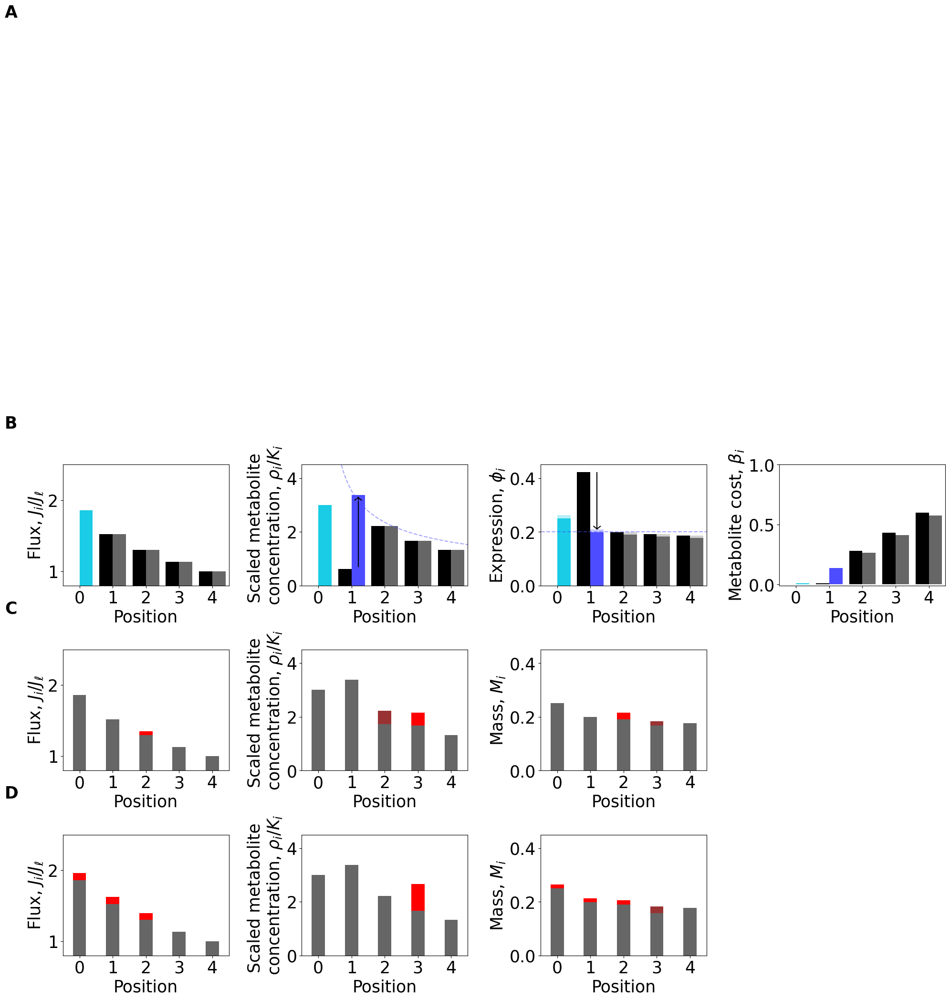

In [138]:
#Figure S1 without the schematic 
font = {'size'   : 25}
plt.rc('font', **font)

fig, axs =plt.subplots(3, 4, figsize = (20, 12), gridspec_kw={'width_ratios': [5, 5, 5, 5]})

KMmean = 0.1
kappamean = 100
nu = 0.3
Nenzymes = 5

kappas = np.ones(Nenzymes)*kappamean #
KMs = np.ones(Nenzymes)*KMmean #
lamapprox = np.sum(kappas**(-1))**(-1)

args = np.array([*kappas, *KMs, nu, lamapprox])

res = minimize(wrapper3, -5, args = args)
rhos = rhoIterator(kappas, KMs, nu, np.exp(res.x[0]))
phis = findPhis(kappas, KMs, rhos)
jouts = phis*kappas/(1+KMs/rhos)

nu2 = nu*0.204579#nu*0.27539518 #nu*0.204579
args2 = np.array([*kappas[:-1], *KMs[:-1], nu2, lamapprox])

Nenzymes = 4
res2 = minimize(wrapper3, -5, args = args2)
Nenzymes = 5

rhos2 = rhoIterator(kappas[:-1], KMs[:-1], nu2, np.exp(res2.x[0]))
phis2 = findPhis(kappas[:-1], KMs[:-1], rhos2)
jouts2 = phis2*kappas[:-1]/(1+KMs[:-1]/rhos2)

print(rhos)
print(rhos2)

lambdasup = np.sum(kappas**(-1))**(-1)
print(jouts[0]/lambdasup)

w = 0.4

for row in range(3):
    axs[row, 0].set_xlabel("Position")
    axs[row, 0].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 0].set_ylabel(r"Flux, $J_i/J_\ell$")
    #axs[row, 0].set_yscale("log")
    axs[row, 0].set_ylim((.8, 2.5))

    axs[row, 1].set_xlabel("Position")
    axs[row, 1].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 1].set_ylabel("Scaled metabolite \n"r"concentration, $\rho_i/K_i$")
    axs[row, 1].set_ylim((0, 4.5))

    axs[row, 2].set_xlabel("Position")
    axs[row, 2].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 2].set_ylabel(r"Expression, $\phi_i$")
    #axs[row, 2].set_yscale("log")
    axs[row, 2].set_ylim((0., .45))

    axs[row, 3].set_xlabel("Position")
    axs[row, 3].set_xlim((-.5, Nenzymes-0.5))
    axs[row, 3].set_ylabel(r"Metabolite cost, $\beta_i$")
    axs[row, 3].set_ylim((-0.01, 1))

print(phis)

print(np.sum(phis), np.sum(phis2))

cost = phis/KMs/(rhos/KMs*(1+rhos/KMs))
cost[-1] = 1e-2

cost2 = phis2/KMs[:-1]/(rhos2/KMs[:-1]*(1+rhos2/KMs[:-1]))
cost2[-1] = 1e-2
print(cost, cost2)

axs[0, 0].bar(np.arange(Nenzymes)[::-1]+w/2, jouts/jouts[0], width = w, color = (0.4, 0.4, .4, 1))
#axs[0, 0].bar(1+w/2, (jouts/jouts[0])[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 0].bar(0+w/2, (jouts/jouts[0])[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 0].bar(np.arange(Nenzymes)[:0:-1]-w/2, jouts2/jouts2[0], width = w, color = "black")

axs[0, 1].bar(np.arange(Nenzymes)[::-1]+w/2, rhos/KMs, width = w, color = (0.4, 0.4, .4, 1))
axs[0, 1].bar(1+w/2, (rhos/KMs)[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 1].bar(0+w/2, (rhos/KMs[0])[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 1].bar(np.arange(Nenzymes)[:0:-1]-w/2, rhos2/KMs[:-1], width = w, color = "black")
axs[0, 1].plot(np.linspace(1+w/2, 1+w/2, 100), np.linspace(rhos[-2]/KMs[0]-.1, rhos2[-1]/KMs[0]+.1,100), "k-")
axs[0, 1].plot(np.linspace(1+w/2, 1.1+w/2, 2), np.linspace(rhos[-2]/KMs[0], rhos[-2]/KMs[0]-.1, 2)-.1, "k-")
axs[0, 1].plot(np.linspace(1+w/2, .9+w/2, 2), np.linspace(rhos[-2]/KMs[0], rhos[-2]/KMs[0]-.1, 2)-.1, "k-")
axs[0, 1].plot(np.linspace(0, 5, 100)+w/2, 1/np.sqrt(KMmean*np.linspace(0, 5, 100)), "--", color = (0.3, 0.3, 1, 1), alpha = 0.5)

axs[0, 2].bar(np.arange(Nenzymes)[::-1]+w/2, phis, width = w, color = (0.4, 0.4, .4, 1))
axs[0, 2].bar(1+w/2, phis[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 2].bar(0+w/2, phis[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 2].bar((np.arange(Nenzymes)[::-1]+w/2)[:-2], (phis*phis2[0]/phis[0])[:-2], width = w, color = (0.4, 0.4, .4, 1), alpha = 0.3)
axs[0, 2].bar(1+w/2, (phis*phis2[0]/phis[0])[-2], width = w, color = (0.3, 0.3, 1, 1), alpha = 0.3)
axs[0, 2].bar(0+w/2, (phis*phis2[0]/phis[0])[-1], width = w, color = (0.1, 0.8, 0.9, 1), alpha = 0.3)
#axs[0, 2].bar(np.arange(Nenzymes)[::-1]+w/2, phis*phis2[0]/phis[0], width = w, color = "orange", alpha = 0.3)
axs[0, 2].bar(np.arange(Nenzymes)[:0:-1]-w/2, phis2, width = w, color = "black", alpha = 1.0)
axs[0, 2].plot(np.linspace(-1, 5.5, 100)+w/2, [1/5]*100, "--", color = (0.3, 0.3, 1, 1), alpha = 0.5)
axs[0, 2].plot(np.linspace(1+w/2, 1+w/2, 100), np.linspace(phis[-2]*phis2[0]/phis[0]+0.002, phis2[-1]-.002,100), "k-")
axs[0, 2].plot(np.linspace(1+w/2, 1.1+w/2, 2), np.linspace(phis[-2]*phis2[0]/phis[0], phis[-2]*phis2[0]/phis[0]+0.01, 2)+0.002, "k-")
axs[0, 2].plot(np.linspace(1+w/2, .9+w/2, 2), np.linspace(phis[-2]*phis2[0]/phis[0], phis[-2]*phis2[0]/phis[0]+0.01, 2)+0.002, "k-")

axs[0, 3].bar(np.arange(Nenzymes)[::-1]+w/2, cost, width = w, color = (0.4, 0.4, .4, 1))
axs[0, 3].bar(1+w/2, cost[-2], width = w, color = (0.3, 0.3, 1, 1))
axs[0, 3].bar(0+w/2, cost[-1], width = w, color = (0.1, 0.8, 0.9, 1))
axs[0, 3].bar(np.arange(Nenzymes)[:0:-1]-w/2, cost2, width = w, color = "black")

for ax in axs.flatten():
    ax.set_xticks([0, 1, 2, 3, 4])
    ax.set_xticklabels([0, 1, 2, 3, 4])

fig.tight_layout()

for n, ax in enumerate([axs[0, 0], axs[1, 0], axs[2, 0]]):  
    ax.text(-0.35, 1.30, string.ascii_uppercase[n+1], transform=ax.transAxes, weight='bold')

axs[0, 0].text(-0.35, 4.70, string.ascii_uppercase[0], transform=axs[0, 0].transAxes, weight='bold')


deltaj = .5
newjouts = np.copy(jouts)
newjouts[2] = newjouts[2]+deltaj
newrhos = np.copy(rhos)
newrhos[:-1] = (newjouts[1:]-newjouts[:-1])/newjouts[0]
newphis = newjouts/kappas*(1+KMs/newrhos)

axs[1, 0].bar(np.arange(Nenzymes)[::-1], newjouts/newjouts[0], width = w, color = (1, 0, 0, 1))
axs[1, 1].bar(np.arange(Nenzymes)[::-1], newrhos/KMs, width = w, color = (1, 0, 0, 1))
axs[1, 2].bar(np.arange(Nenzymes)[::-1], newphis, width = w, color = (1, 0, 0, 1))

axs[1, 0].bar(np.arange(Nenzymes)[::-1], jouts/jouts[0], width = w, color = (0.6, 0.2, .2, 1))
axs[1, 1].bar(np.arange(Nenzymes)[::-1], rhos/KMs, width = w, color = (0.6, 0.2, .2, 1))
axs[1, 2].bar(np.arange(Nenzymes)[::-1], phis, width = w, color = (0.6, 0.2, .2, 1))

axs[1, 0].bar(np.arange(Nenzymes)[::-1], np.min(np.array([jouts/jouts[0], newjouts/newjouts[0]]), 0), width = w, color = (0.4, .4, .4, 1))
axs[1, 1].bar(np.arange(Nenzymes)[::-1], np.min(np.array([rhos/KMs, newrhos/KMs]), 0), width = w, color = (0.4, .4, .4, 1))
axs[1, 2].bar(np.arange(Nenzymes)[::-1], np.min(np.array([phis, newphis]), 0), width = w, color = (0.4, .4, .4, 1))

axs[1, 3].axis("off")#bar(np.arange(Nenzymes)[::-1], cost, width = w, color = (0.4, 0.4, .4, 1))
axs[1, 2].set_ylabel(r"Mass, $M_i$")

deltaj = 1
newjouts = np.copy(jouts)
newjouts[2:] = newjouts[2:]+deltaj
newrhos = np.copy(rhos)
newrhos[:-1] = (newjouts[1:]-newjouts[:-1])/newjouts[0]
newphis = newjouts/kappas*(1+KMs/newrhos)

axs[2, 0].bar(np.arange(Nenzymes)[::-1], newjouts/newjouts[0], width = w, color = (1, 0, 0, 1))
axs[2, 1].bar(np.arange(Nenzymes)[::-1], newrhos/KMs, width = w, color = (1, 0, 0, 1))
axs[2, 2].bar(np.arange(Nenzymes)[::-1], newphis, width = w, color = (1, 0, 0, 1))

axs[2, 0].bar(np.arange(Nenzymes)[::-1], jouts/jouts[0], width = w, color = (0.6, 0.2, .2, 1))
axs[2, 1].bar(np.arange(Nenzymes)[::-1], rhos/KMs, width = w, color = (0.6, 0.2, .2, 1))
axs[2, 2].bar(np.arange(Nenzymes)[::-1], phis, width = w, color = (0.6, 0.2, .2, 1))

axs[2, 0].bar(np.arange(Nenzymes)[::-1], np.min(np.array([jouts/jouts[0], newjouts/newjouts[0]]), 0), width = w, color = (0.4, .4, .4, 1))
axs[2, 1].bar(np.arange(Nenzymes)[::-1], np.min(np.array([rhos/KMs, newrhos/KMs]), 0), width = w, color = (0.4, .4, .4, 1))
axs[2, 2].bar(np.arange(Nenzymes)[::-1], np.min(np.array([phis, newphis]), 0), width = w, color = (0.4, .4, .4, 1))

axs[2, 3].axis("off")#bar(np.arange(Nenzymes)[::-1], cost, width = w, color = (0.4, 0.4, .4, 1))
axs[2, 2].set_ylabel(r"Mass, $M_i$")

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SI_schematic_barplots.pdf", bbox_inches="tight", format = 'pdf')

### the rest of this figure was created in vectornator, not with python

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000, 3, 6, 1, 20)
(5000, 1, 20)


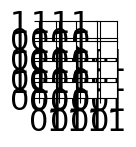

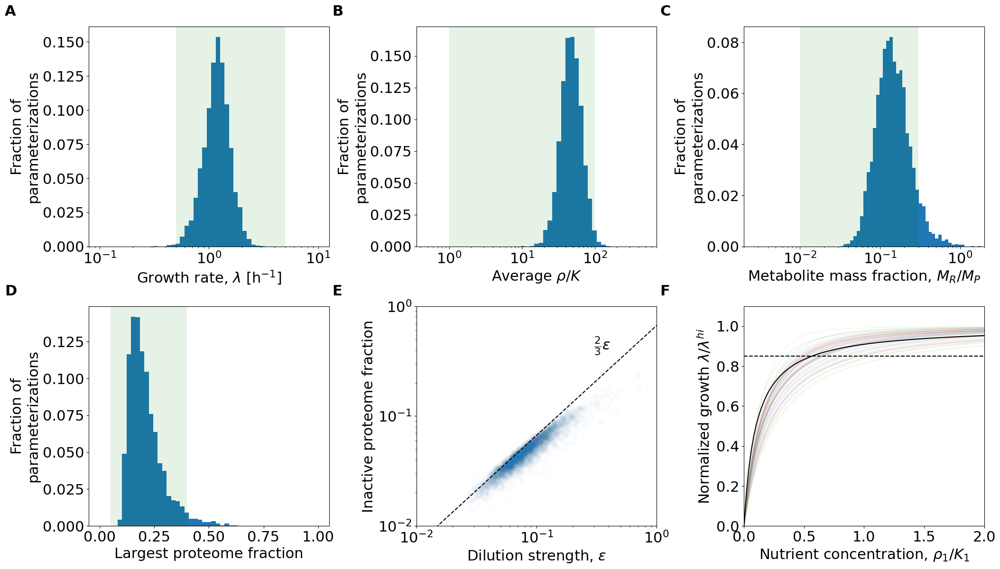

In [140]:
#Figure S2
font = {'size'   : 22}
plt.rc('font', **font)


#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
Nenzymes = 20

fig, axs = plt.subplots(4, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 12))
gs = gridspec.GridSpec(2, 5)
#gs.update(wspace=0, hspace=0.15)
axs[0, 0] = plt.subplot(gs[0, 0])
axs[0, 1] = plt.subplot(gs[0, 1])
axs[0, 2] = plt.subplot(gs[0, 2])
axs[1, 0] = plt.subplot(gs[1, 0])
axs[1, 1] = plt.subplot(gs[1, 1])
axs[1, 2] = plt.subplot(gs[1, 2])

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))


efficiencybins = np.logspace(-1, 1, 6)

ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]
print(np.shape(ensemble))
print(np.shape(efficiencies))


#what are high proteome mass fractions of the largest enzyme correlated with
#fig, axs = plt.subplots(2, 2, figsize = (15, 14))
axs[0, 0].hist(ensemble[:, 0, 5, 0, 0]*10**(-.5), bins = np.logspace(np.log10(0.1), np.log10(10), 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
axs[0, 0].set_xscale("log")
axs[0,0].set_xlabel("Growth rate, $\lambda$ [h$^{-1}$]")
limits = axs[0,0].get_ylim()
axs[0,0].add_patch(plt.Polygon([[.5, limits[0]], [.5, limits[1]], [5, limits[1]], [5, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,0].set_ylabel("Fraction of\nparameterizations")

axs[0,1].hist(np.exp(np.mean(np.log(ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]), 1)), bins = np.logspace(np.log10(.5), np.log10(500), 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[0,1].hist(np.mean(1/(1+1/(ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :])), 1), bins = np.linspace(0, 1, 200), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[0,1].hist((ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]).flatten(), bins = np.logspace(np.log10(.5), np.log10(500), 50))
axs[0,1].set_xscale("log")
#axs[0,1].set_xlabel("Average saturation")
axs[0,1].set_xlabel(r"Average $\rho/K$")#scaled metabolite concentration, 
limits = axs[0,1].get_ylim()
#axs[0,1].set_xlim(0.7, 1)
#axs[0,1].add_patch(plt.Polygon([[0.8, limits[0]], [0.8, limits[1]], [0.95, limits[1]], [0.95, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,1].add_patch(plt.Polygon([[1, limits[0]], [1, limits[1]], [100, limits[1]], [100, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,1].set_ylabel("Fraction of\nparameterizations")

axs[0,2].hist(np.sum(ensemble[:, 0, 3, 0, :-1], 1), bins = np.logspace(np.log10(0.02), np.log10(2), 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[0,2].hist(np.sum(ensemble[:, 0, 3, 0, :-1], 1), bins = np.logspace(np.log10(0.001), np.log10(2), 50))
axs[0,2].set_xscale("log")
axs[0,2].set_xlabel("Metabolite mass fraction, $M_R/M_P$")
axs[0,2].set_xlim(2e-3, 2)
limits = axs[0,2].get_ylim()
axs[0,2].add_patch(plt.Polygon([[.01, limits[0]], [.01, limits[1]], [.3, limits[1]], [.3, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[0,2].set_ylabel("Fraction of\nparameterizations")

axs[1,0].hist(np.max(ensemble[:, 0, 4, 0, :], 1), bins = np.linspace(0, 1, 50), weights = 0*ensemble[:, 0, 5, 0, 0]+1/(np.shape(ensemble[:, 0, 5, 0, 0])[0]))
#axs[1,0].hist(np.max(ensemble[:, 0, 4, 0, :], 1), bins = np.linspace(0, 1, 50))
axs[1,0].set_xlabel("Largest proteome fraction")
limits = axs[1,0].get_ylim()
axs[1,0].add_patch(plt.Polygon([[.4, limits[0]], [.4, limits[1]], [.05, limits[1]], [.05, limits[0]]], facecolor='green', clip_on = True, linewidth = 0, alpha = .1))
axs[1,0].set_ylabel("Fraction of\nparameterizations")

epsilons = np.sqrt(np.sum(fullensemble[:, 0, 1, :-1], axis = 1))
epsilons2 = np.sum(np.sqrt(fullensemble[:, 0, 1, :-1]*fullensemble[:, 0, 4, :-1]), axis = 1)


#axs[1,1].scatter(2/3*epsilons, np.sum(fullensemble[:, 0, 4, :-1]*(1-1/(1+fullensemble[:, 0, 1, :-1]/fullensemble[:, 0, 3, :-1])), axis = 1), alpha = 0.01)
axs[1,1].scatter(epsilons2, np.sum(fullensemble[:, 0, 4, :-1]*(1-1/(1+fullensemble[:, 0, 1, :-1]/fullensemble[:, 0, 3, :-1])), axis = 1), alpha = 0.01)
axs[1,1].set_xscale("log")
axs[1,1].set_yscale("log")
axs[1,1].set_xlabel(r"Dilution strength, $\epsilon$")
axs[1,1].set_ylabel("Inactive proteome fraction")
axs[1,1].plot([1e-2, 3e0], [1e-2*2/3, 3e0*2/3], "k--")
axs[1,1].text(3e-1, 4e-1, r"$\frac{2}{3}\epsilon$")
axs[1,1].set_xlim(1e-2, 1e0)
axs[1,1].set_ylim(1e-2, 1e0)
                 
axs[1,2].plot(fullensemble[::101, :, 3, -1].T/fullensemble[::101, 0, 1, -1], fullensemble[::101, :, 5, 0].T/fullensemble[::101, 0, 5, 0], alpha =0.1)
axs[1,2].set_xlim(0, 2)
axs[1,2].set_ylim(0, 1.1)
axs[1,2].set_xlabel(r"Nutrient concentration, $\rho_1/K_1$")
axs[1,2].set_ylabel(r"Normalized growth $\lambda/\lambda^{hi}$")
K = 1/10
axs[1,2].plot(np.linspace(0, 2, 100), 1/(1+K/np.linspace(0, 2, 100)), "k-")
axs[1,2].plot([0, 2], [1-0.1-1/Nenzymes]*2, "k--")

fig.tight_layout()

for n, ax in enumerate([axs[0,0], axs[0,1], axs[0,2], axs[1,0], axs[1,1], axs[1,2]]):  
    ax.text(-0.35, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SI_validity.pdf", bbox_inches="tight", format = 'pdf')
#effect of saturation is negligible - the largest mass fraction is given by max(1/kappa/(sum(1/kappa)))

In [142]:
###Analytical solution for the nutrient-limiting boundary condition
def ConstrainedIterator(kappas, KMs, rho0approx, phiup_0, eps):
    rhos = rhoIteratorInternal(kappas, KMs, rho0approx)
    KM1 = KMs[-1]
    kappa1 = kappas[-1]
    phi1 = phiup_0
    Js = np.cumsum(rhos)-rhos+1
    Ms = Js/kappas[:-1]*(1+KMs[:-1]/rhos)
    sumM = np.sum(Ms)
    J1 = Js[-1]+rhos[-1]
    nu = -((J1*KM1*(-1 + phi1 + eps*phi1))/((1 + eps)*(J1*(-1 + phi1) + kappa1*phi1*sumM)))
    #nu1 = (-J1*KM1-eps*J1*KM1+J1*KM1*phi1+eps*J1*KM1*phi1+eps*J1*KM1*phi1+kappa1*KM1*phi1*sumM+eps*kappa1*KM1*phi1*sumM-np.sqrt(-4*(J1*KM1**2-J1*KM1**2*phi1-eps*J1*KM1**2*phi1)*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM)+(J1*KM1+eps*J1*KM1-J1*KM1*phi1-eps*J1*KM1*phi1-eps*J1*KM1*phi1-kappa1*KM1*phi1*sumM-eps*kappa1*KM1*phi1*sumM)**2))/(2*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM))
    #nu2 = (-J1*KM1-eps*J1*KM1+J1*KM1*phi1+eps*J1*KM1*phi1+eps*J1*KM1*phi1+kappa1*KM1*phi1*sumM+eps*kappa1*KM1*phi1*sumM+np.sqrt(-4*(J1*KM1**2-J1*KM1**2*phi1-eps*J1*KM1**2*phi1)*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM)+(J1*KM1+eps*J1*KM1-J1*KM1*phi1-eps*J1*KM1*phi1-eps*J1*KM1*phi1-kappa1*KM1*phi1*sumM-eps*kappa1*KM1*phi1*sumM)**2))/(2*(eps*J1-eps*J1*phi1-eps*kappa1*phi1*sumM))
    #print(nu-nu1, nu-nu2)
    #nu = max(nu1, nu2)
    rhos = np.append(rhos, nu)
    return rhos


#fig, axs = plt.subplots(5, 2, figsize = (18, 15))


Nenzymes = 20
font = {'size'   : 30} #25#20
plt.rc('font', **font)

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

efficiencybins = np.logspace(-2.2 , 2.2, 12)#np.logspace(-1, 1, 6)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/1.05).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
#efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]
print(np.shape(ensemble))
print(np.shape(efficiencies))

shift = 0
colors = ["k", "r"]
effs = ["L", "H"]
effcolors = ["b", "orange"]
linewidths = [4, 1]
colorsPhi = np.array([["darkblue", "darkblue"], ["cyan", "cyan"]])

for gr in range(2):

    branch = 0
    colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    for i in range(np.shape(efficiencybins)[0]-1):
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        colormeshrho[:, i] = np.nanmean(logsaturation, 0)
        colormeshphi[:, i] = np.nanmean(logexpression, 0)
    

x9, y9, z9 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshrho.T
x10, y10, z10 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshphi.T

#### Linear Chain
#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
Nenzymes = 20
font = {'size'   : 30} #25#20
plt.rc('font', **font)

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

efficiencybins = np.logspace(-2.2 , 2.2, 12)#np.logspace(-1, 1, 6)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
#efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]

for gr in range(2):

    branch = 0
    colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    for i in range(np.shape(efficiencybins)[0]-1):
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        colormeshrho[:, i] = np.nanmean(logsaturation, 0)
        colormeshphi[:, i] = np.nanmean(logexpression, 0)
    

    meanN = np.nanmean(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    stdN = np.nanstd(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    
    efficiencybins3 = np.logspace(-5, 5, 3)
    meanNs = []
    stdNs = []
    meanNs2 = []
    stdNs2 = []
    piefractions = []
    for i in range(np.shape(efficiencybins3)[0]-1):
        #if i%6==3:
        mask = (efficiencies[:, branch, :]>efficiencybins3[i])*(efficiencies[:, branch, :]<=efficiencybins3[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        meanNs.append(10**np.nanmean(logsaturation, 0))
        stdNs.append(10**np.nanstd(logsaturation, 0))
        meanNs2.append(10**(np.nanmean(logexpression, 0)))
        stdNs2.append(10**(np.nanstd(logexpression, 0)))
        
    x7, y7, z7 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshrho.T
    x8, y8, z8 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshphi.T


(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000, 3, 6, 1, 20)
(5000, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)


-7.722557541502939
-7.722557541502939


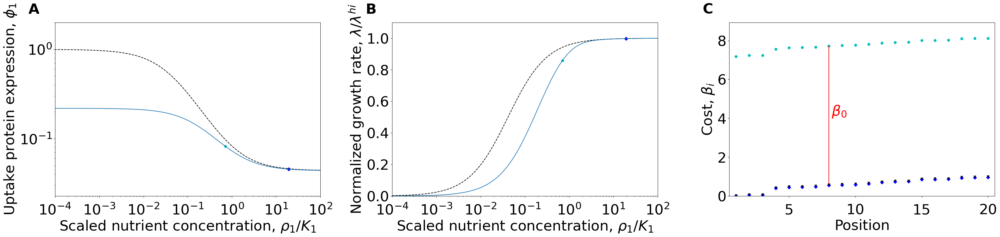

In [143]:
#Figure S3
font = {'size'   : 35}
plt.rc('font', **font)

fig, axs =plt.subplots(1, 3, figsize = (35, 9))


Nenzymes = 20

kappamean = 130
KMmean = .0001

kappas = fullensemble[0, 0, 0, :]#np.random.lognormal(np.log(kappamean), 3, Nenzymes) #np.ones(Nenzymes)*kappamean #
KMs = fullensemble[0, 0, 1, :]# np.random.lognormal(np.log(KMmean), 2.5, Nenzymes) #np.ones(Nenzymes)*KMmean #
#bs = fullensemble[0, 0, 2, :]#np.ones(Nenzymes)
nu = fullensemble[0, 0, 3, -1]*100#200*KMs[-1] #0.03*KMmean
lamapprox = fullensemble[0, 0, 5, 0]
phi1 = fullensemble[0, 0, 4, -1]

args = np.array([*kappas, *KMs, nu, lamapprox])
res = minimize(wrapper3, -5, args = args)
rhos = rhoIterator(kappas, KMs, nu, np.exp(res.x[0]))
phis = findPhis(kappas, KMs, rhos)
jouts = calculatejout(rhos, phis, kappas, KMs)

results = []
resultsopt = []
print(res.x[0])
for logrho0 in res.x[0]-np.logspace(-13, 2, 1000):
    rhosC = ConstrainedIterator(kappas, KMs, np.exp(logrho0), phis[-1]/(1+1*5/(1+5*200)), 4)
    phisC = findPhis(kappas, KMs, rhosC)
    #print(phis[-1], phisC[-1])
    joutsC = calculatejout(rhosC, phisC, kappas, KMs)
    results.append([rhosC, phisC, joutsC])
    
    rhosopt = BCIterator(kappas, KMs, np.exp(logrho0))
    phisopt = findPhis(kappas, KMs, rhosopt)
    #print(phis[-1], phisC[-1])
    joutsopt = calculatejout(rhosopt, phisopt, kappas, KMs)
    resultsopt.append([rhosopt, phisopt, joutsopt])
    
    
results = []
print(res.x[0])
for logrho0 in res.x[0]-np.logspace(-13, 2, 1000):#+2.48370e-2:
    rhosC = ConstrainedIterator(kappas, KMs, np.exp(logrho0), phis[-1]/(1+1*5/(1+5*200)), 4)
    phisC = findPhis(kappas, KMs, rhosC)
    #print(phis[-1], phisC[-1])
    joutsC = calculatejout(rhosC, phisC, kappas, KMs)
    results.append([rhosC, phisC, joutsC])

results = np.array(results)
resultsopt = np.array(resultsopt)

cutoff = np.min(np.where(results[:, 0, -1]>0))
results = results[cutoff:]

i0 = 0
iref = 740-cutoff
imedium = 870-cutoff

axs[0].plot(results[iref, 0, -1]/KMs[-1], results[iref, 1, -1], "bD")
axs[0].plot(results[imedium, 0, -1]/KMs[-1], results[imedium, 1, -1], "co")
axs[0].plot(resultsopt[500:, 0, -1]/KMs[-1], resultsopt[500:, 1, -1], "k--")#, label = "optimal expression")
axs[0].plot(results[:, 0, -1]/KMs[-1], results[:, 1, -1])#, label = "constrained expression")
#axs[0].plot(results[:, 0], results[:, 2])
axs[0].set_xscale("log")
#axs[0].set_xlabel(r"Nutrient saturation $\rho_1/K_1$")
axs[0].set_xlabel(r"Scaled nutrient concentration, $\rho_1/K_1$")
axs[0].set_ylabel(r"Uptake protein expression, $\phi_1$")
axs[0].set_yscale("log")
#axs[0].legend(loc = "upper left")
axs[0].set_xlim(1/10000, 100)
axs[0].set_ylim(results[iref, 1, -1]/2, 2)

axs[1].plot(results[iref, 0, -1]/KMs[-1], results[iref, 2, 0]/results[0, 2, 0], "bD")
axs[1].plot(results[imedium, 0, -1]/KMs[-1], results[imedium, 2, 0]/results[0, 2, 0], "co")
axs[1].plot(resultsopt[500:, 0, -1]/KMs[-1], resultsopt[500:, 2, 0]/results[0, 2, 0], "k--")#, label = "optimal expression")
axs[1].plot(results[:, 0, -1]/KMs[-1], results[:, 2, 0]/results[0, 2, 0])#, label = "constrained expression")
axs[1].set_xscale("log")
axs[1].set_ylabel(r"Normalized growth rate, $\lambda/\lambda^{hi}$")
#axs[1].set_xlabel(r"Nutrient saturation $\rho_1/K_1$")
axs[1].set_xlabel(r"Scaled nutrient concentration, $\rho_1/K_1$")
axs[1].set_xlim(1/10000, 100)
axs[1].set_ylim(0, 1.1)


betaref0 = results[i0, 1, :]/(results[i0, 0, :]*(1+results[i0, 0, :]/KMs))   
betaref0[-1] = 0
betaref = results[iref, 1, :]/(results[iref, 0, :]*(1+results[iref, 0, :]/KMs))   
betaref[-1] = 0
betamedium = results[imedium, 1, :]/(results[imedium, 0, :]*(1+results[imedium, 0, :]/KMs))
betamedium[-1] = betamedium[12]-betaref[12]

axs[2].scatter(np.arange(Nenzymes)[::-1]+1, betaref, marker = "D", c = "b")
axs[2].scatter(np.arange(Nenzymes)[::-1]+1, betamedium, marker = "o", c = "c")
axs[2].plot([Nenzymes-12, Nenzymes-12], [betaref[12], betamedium[12]], "r-")
axs[2].text(Nenzymes-11.8, betaref[12]/2+betamedium[12]/2, r"$\beta_0$", color = "r")
#axs[2].set_yscale("log")
axs[2].set_xlim(0.5, Nenzymes+.5)
axs[2].set_ylim(0, 1.1*results[imedium, 1, 0]/(results[imedium, 0, 0]*(1+results[imedium, 0, 0]/KMs[0])))
axs[2].set_xlabel(r"Position")
axs[2].set_xticks([5, 10, 15, 20])
axs[2].set_xticklabels([5, 10, 15, 20])
axs[2].set_ylabel(r"Cost, $\beta_i$")
simplebetas = np.cumsum(results[iref, 1, ::-1])[:-1]
simplebetas = np.append(simplebetas[::-1], 0)
axs[2].plot(np.arange(Nenzymes)[::-1]+1, simplebetas, marker = 7, color = "k", linestyle = "none")

for ax in axs:
    ax.tick_params(axis='x', which='major', pad=15)
    
for n, ax in enumerate(axs):  
    ax.text(-0.1, 1.05, string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')


fig.tight_layout()
#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/SI_constraints.pdf", bbox_inches="tight", format = 'pdf')

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
1.3243552025337433


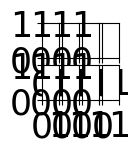

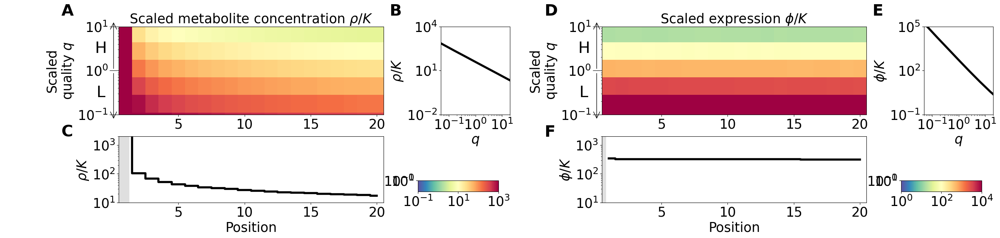

In [148]:
#Illustration of the ensemble in nutrient rich medium as a function of enzyme quality q and reaction position.
#Box must be executed to define plotting properties and plotting functions, but is not part of the final figures. 

fig, axs = plt.subplots(2, 4, figsize = (1, 1))
fig = plt.figure(figsize = (35, 15))
gs = gridspec.GridSpec(40, 90)
gs.update(wspace=0, hspace=0)

axs[0, 0] = plt.subplot(gs[0:8, 10:33])
axs[1, 0] = plt.subplot(gs[10:16, 10:33])
axs[0, 1] = plt.subplot(gs[0:8, 38:44])
axs[1, 1] = plt.subplot(gs[14:15, 36:43])

axs[0, 2] = plt.subplot(gs[0:8, 52:75])
axs[1, 2] = plt.subplot(gs[10:16, 52:75])
axs[0, 3] = plt.subplot(gs[0:8, 80:86])
axs[1, 3] = plt.subplot(gs[14:15, 78:85])

Nenzymes = 20
font = {'size'   : 30}
plt.rc('font', **font)

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

meancolors = ["k", "dimgrey"]

KMmean = np.exp(np.mean(np.log(fullensemble[:, 0, 1, :])))
efficiencybins = np.logspace(-2.2 , 2.2, 12)
efficiencybins2 = np.copy(efficiencybins)
ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/10.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
efficiencies = efficiencies[:, None, :]

branch = 0
colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
for i in range(np.shape(efficiencybins)[0]-1):
    mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
    fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
    maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
    logsaturation = np.log10(maskeddata[:, 0, 3, :]/maskeddata[:, 0, 1, :])
    logexpression = np.log10(maskeddata[:, 0, 4, :]/maskeddata[:, 0, 1, :])
    colormeshrho[:, i] = np.nanmean(logsaturation, 0)
    colormeshphi[:, i] = np.nanmean(logexpression, 0)
    
heatmap = axs[0, 0].pcolormesh(np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins[1:]*efficiencybins[:-1]), colormeshrho.T, cmap = cm, vmin = -1, vmax = 3)
heatmap2 = axs[0, 2].pcolormesh(np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins[1:]*efficiencybins[:-1]), colormeshphi.T, cmap = cm, vmin = 0, vmax = 4)
axs[0, 0].set_title(r'Scaled metabolite concentration $\rho/K$')
axs[0, 2].set_title(r'Scaled expression $\phi/K$')

axcb = axs[1, 1]
cb = fig.colorbar(heatmap, orientation='horizontal', cax=axcb)#, label = r"$\rho/K$")
axcb.set_xticks([-1, 1, 3])
axcb.set_xticklabels([r"$10^{-1}$", r"$10^{1}$", r"$10^{3}$"])

axcb2 = axs[1, 3]
fig.colorbar(heatmap2, orientation='horizontal', cax=axcb2)#, label = r"$\phi/K$")
axcb2.set_xticks([0, 2, 4])
axcb2.set_xticklabels([r"$10^{0}$", r"$10^{2}$", r"$10^{4}$"])

shift = 0
colors = ["k", "r"]
effs = ["L", "H"]
effcolors = ["b", "orange"]


def filtered(data):
    """visually smoothes heatmaps constructed from ensemble averages."""
    logdata = np.log(data[:-1])
    if np.max(logdata)-np.min(logdata)<0.5:
        filtereddata = savgol_filter(logdata, 8, 1)
        final = np.copy(data)
        final[:-1] = np.exp(filtereddata)
    else:
        if np.shape(data)[0]>15:
            filtereddata = savgol_filter(logdata, 10, 3)
            if np.any((logdata-filtereddata)>0.02):
                filtereddata[:10] = savgol_filter(logdata[:10], 7, 3)
                filtereddata[10] = logdata[10]
                filtereddata[11:] = savgol_filter(logdata[11:], 7, 3)
            final = np.copy(data)
            final[:-1] = np.exp(filtereddata)
        else:
            filtereddata = savgol_filter(logdata[1:], 7, 3)
            final = np.copy(data)
            final[1:-1] = np.exp(filtereddata)
    return final

for gr in range(1):
    meanN = np.nanmean(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    stdN = np.nanstd(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    
    efficiencybins = np.logspace(-5, 5, 2)
    meanNs = []
    stdNs = []
    meanNs2 = []
    stdNs2 = []
    piefractions = []
    for i in range(np.shape(efficiencybins)[0]-1):
        #if i%6==3:
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, gr, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, gr, 4, :]/maskeddata[:, 0, 1, :])
        meanNs.append(10**np.nanmean(logsaturation, 0))
        stdNs.append(10**np.nanstd(logsaturation, 0))
        meanNs2.append(10**(np.nanmean(logexpression, 0)))
        stdNs2.append(10**(np.nanstd(logexpression, 0)))
        
        axs[1, 0].step(np.arange(20)[::-1]+1+shift, filtered(meanNs[-1]), meancolors[i], where = "mid", linewidth = 4)
        axs[1, 2].step(np.arange(20)[::-1]+1+shift, filtered(meanNs2[-1]), meancolors[i], where = "mid", linewidth = 4)
        piefractions.append(np.nanmean(np.nansum(maskeddata[:, gr, 4, :], -1))) 

    axs[0, 1].plot(np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), 10**np.mean(colormeshrho[:-1, :], 0), meancolors[i], linewidth = 4)
    axs[0, 3].plot(np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), 10**np.mean(colormeshphi[:-1, :], 0), meancolors[i], linewidth = 4)

    x5, y5, z5 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshrho.T
    x6, y6, z6 = np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins2[1:]*efficiencybins2[:-1]), colormeshphi.T
    
for ax in axs.flatten():
    ax.set_yscale("log")

axs[0, 1].set_xlim(0.05, 20) 
axs[0, 3].set_xlim(0.05, 20)
axs[0, 1].set_xscale("log")
axs[0, 3].set_xscale("log")

for ax in [axs[0, 0], axs[1, 0], axs[0, 2], axs[1, 2]]:
    ax.set_xlim(0.5, 20.5)
    ax.set_xticks([5, 10, 15, 20])

axs[0, 0].set_ylim(0.1, 10)
axs[0, 2].set_ylim(0.1, 10)

axs[1, 0].set_ylim(1e1, 2e3)
axs[1, 2].set_ylim(1e1, 2e3) 
axs[0, 1].set_ylim(1e-2, 1e4)
axs[0, 3].set_ylim(1e-1, 1e5) 

axs[1, 0].set_xlabel("Position")
axs[1, 2].set_xlabel("Position")


axs[0, 0].yaxis.set_tick_params(which='major', length=17)
axs[0, 0].annotate('', xy=(-0.02, -.06), xycoords='axes fraction', xytext=(-0.02, .48), arrowprops=dict(arrowstyle="->", color='k'))
axs[0, 0].annotate('', xy=(-0.02, 1.06), xycoords='axes fraction', xytext=(-0.02, .51), arrowprops=dict(arrowstyle="->", color='k'))
axs[0, 0].text(-1.3, 2.5, "H")
axs[0, 0].text(-1.2, 1/4, "L")
axs[0, 2].yaxis.set_tick_params(which='major', length=17)
axs[0, 2].annotate('', xy=(-0.02, -.06), xycoords='axes fraction', xytext=(-0.02, .48), arrowprops=dict(arrowstyle="->", color='k'))
axs[0, 2].annotate('', xy=(-0.02, 1.06), xycoords='axes fraction', xytext=(-0.02, .51), arrowprops=dict(arrowstyle="->", color='k'))
axs[0, 2].text(-1.3, 2.5, "H")
axs[0, 2].text(-1.2, 1/4, "L")

axs[1, 0].add_patch(plt.Polygon([[0.5, 1e-3], [0.5, 1e5], [1.3, 1e5], [1.3, 1e-3]],facecolor='silver', clip_on=True, linewidth = 0, alpha = 0.5))
axs[1, 2].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1.5e4], [.8, 1.5e4], [.8, 1e-1]],facecolor='silver', clip_on=True, linewidth = 0, alpha = 0.5))
 
axs[0, 0].set_ylabel("Scaled\nquality $q$")
axs[0, 2].set_ylabel("Scaled\nquality $q$")
axs[0, 1].set_xlabel("$q$")
axs[0, 3].set_xlabel("$q$")
axs[1, 0].set_ylabel(r"$\rho/K$")
axs[1, 2].set_ylabel(r"$\phi/K$")
axs[0, 1].set_ylabel(r"$\rho/K$")
axs[0, 3].set_ylabel(r"$\phi/K$")


axlabel = plt.subplot(gs[15, 0])
axlabel.axis("off")
axlabel.text(5, 17, "A", weight = 'bold')
axlabel.text(33.5, 17, "B", weight = 'bold')
axlabel.text(5, 6, "C", weight = 'bold')
axlabel.text(47, 17, "D", weight = 'bold')
axlabel.text(75.5, 17, "E", weight = 'bold')
axlabel.text(47, 6, "F", weight = 'bold')

fig.tight_layout()

print(np.exp(np.mean(np.log(efficiencies))))

#plt.savefig("/Users/leonseeger/Dropbox/EffluxPumpsLeon/Draft/CommentingVersion/MainText2.pdf", bbox_inches="tight", format = 'pdf')

(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000, 42)
(5000, 1000, 3, 20)
(1, 1000, 6, 20)
(5000,)
(1, 3, 6, 1, 20)
(1, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(1, 1000, 6, 20)
(5000,)
(1, 3, 6, 1, 20)
(1, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(1, 1000, 6, 20)
(5000,)
(1, 3, 6, 1, 20)
(1, 1, 20)
(5000, 42)
(5000, 1000, 3, 20)
(5000, 1000, 6, 20)
(5000,)
(5000, 3, 6, 1, 20)
(5000, 1, 20)
rho, rich 0.976561254618242 42.66439963882552
phi, rich 0.981969751502966 55.46235262173441
rho, poor 0.9125309326613587 11.432613041687583
phi, poor 0.9122104948615268 11.39088320890599
(5000, 20)
(5000, 20)
(5000, 3, 6, 1, 20)
(5000, 1, 20)
(5000, 19)


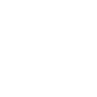

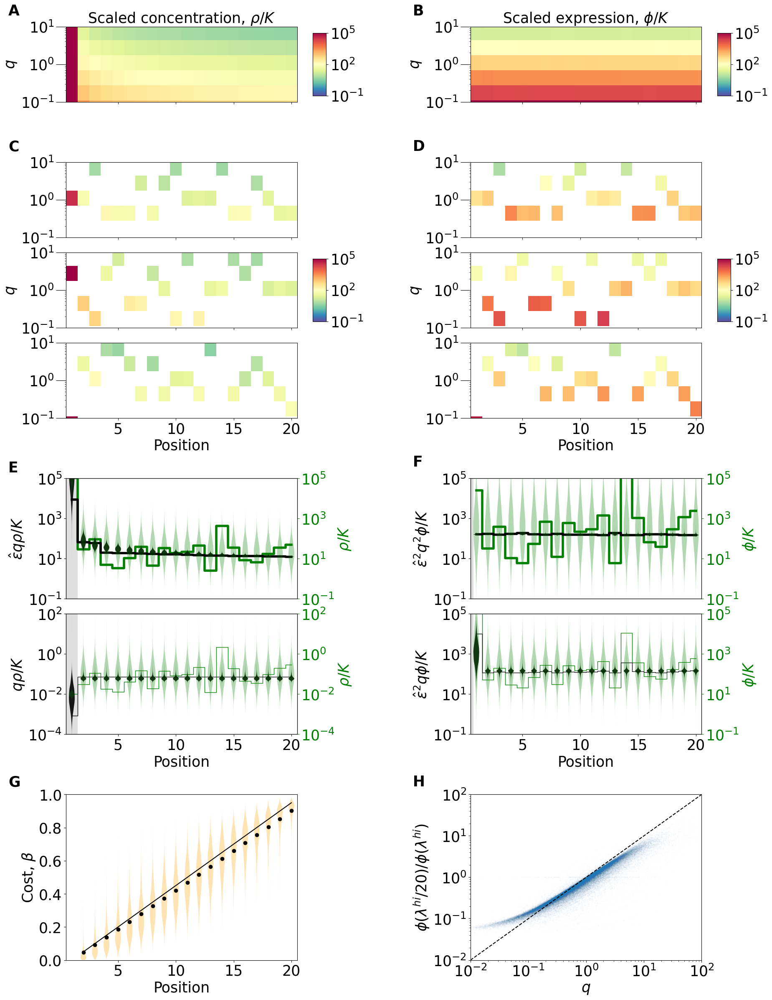

In [150]:
#Figure S4
#fig, axs = plt.subplots(2, 2, figsize = (10, 10))
Nenzymes = 20
font = {'size'   : 25}
plt.rc('font', **font)
fig, axs = plt.subplots(9, 4, figsize = (1, 1))
for ax in axs.flatten():
    ax.axis("off")

fig = plt.figure(figsize = (50, 29))
gs = gridspec.GridSpec(21, 28)
gs.update(wspace=0, hspace=0.5)

axs[0, 0] = plt.subplot(gs[0:2, 0:4])
axs[0, 1] = plt.subplot(gs[0:2, 7:11])

axs[1, 0] = plt.subplot(gs[3:5, 0:4])
axs[1, 1] = plt.subplot(gs[3:5, 7:11])
axs[2, 0] = plt.subplot(gs[5:7, 0:4])
axs[2, 1] = plt.subplot(gs[5:7, 7:11])
axs[3, 0] = plt.subplot(gs[7:9, 0:4])
axs[3, 1] = plt.subplot(gs[7:9, 7:11])

axs[0, 2] = plt.subplot(gs[17:23, 0:4])
axs[3, 2] = plt.subplot(gs[17:23, 7:11])

axs[1, 2] = plt.subplot(gs[10:13, 0:4])
axs[2, 2] = plt.subplot(gs[13:16, 0:4])
axs[1, 3] = plt.subplot(gs[10:13, 7:11])
axs[2, 3] = plt.subplot(gs[13:16, 7:11])

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

epsilons = np.sum(np.sqrt((fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]).T/np.sum(1/fullensemble[:, 0, 0, :], 1)), 0)
epsilonshat = epsilons/np.exp(np.mean(np.log(epsilons)))

print(np.shape(fullensemble))

KMmean = np.exp(np.mean(np.log(fullensemble[:, 0, 1, :])))

heatmap = axs[0, 0].pcolormesh(x5, y5, z5, cmap = cm, vmin = -1, vmax = 5)
heatmap2 = axs[0, 1].pcolormesh(x6, y6, z6, cmap = cm, vmin = -1, vmax = 5)


loc = [2, 1, 0]
for ind in range(3):
    filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

    fullensemble = np.load(data_folder+filename)
    parameters = np.load(data_folder+"physiologicalParameterset.npy")
    print(np.shape(parameters))
    print(np.shape(fullensemble))

    parameterensemble = np.ones(np.shape(fullensemble))
    parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
    parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

    fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)
    fullensemble = fullensemble[loc[ind]][None, :, :, :]
    print(np.shape(fullensemble))

    efficiencybins = np.logspace(-1.4, 1.4, 8)#np.logspace(-1, 1, 6)

    ilocs = []
    ensemble = []

    for j in range(np.shape(fullensemble)[0]):
        maxgr = fullensemble[j, 0, 5, 0]
        halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
        halfgrs[halfgrs<=0] = np.max(halfgrs)
        tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/20.1).T
        tenthgrs[tenthgrs<=0] = np.max(tenthgrs)

        iloc = np.where(halfgrs == np.nanmin(halfgrs))
        iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
        ilocs.append(iloc[0][0])
        ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
        #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

    ilocs = np.array(ilocs)
    ensemble = np.array(ensemble)[:, :, :, None, :]

    #print(np.shape(smallensemble))
    #efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
    efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
    efficiencies = efficiencies[:, None, :]
    print(np.shape(epsilonshat))
    print(np.shape(ensemble))
    print(np.shape(efficiencies))

    branch = 0
    colormeshrho = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    colormeshphi = np.zeros((Nenzymes, np.shape(efficiencybins)[0]-1))
    for i in range(np.shape(efficiencybins)[0]-1):
        mask = (efficiencies[:, branch, :]>efficiencybins[i])*(efficiencies[:, branch, :]<=efficiencybins[i+1])
        fullmask = mask[:, None, None, :]*np.ones((np.shape(ensemble)[1], np.shape(ensemble)[2]))[None, :, :, None]
        maskeddata = np.where(fullmask, ensemble[:, :, :, branch, :], np.nan)
        logsaturation = np.log10(maskeddata[:, 0, 3, :]/maskeddata[:, 0, 1, :])
        logexpression = np.log10(maskeddata[:, 0, 4, :]/maskeddata[:, 0, 1, :])
        colormeshrho[:, i] = np.nanmean(logsaturation, 0)
        colormeshphi[:, i] = np.nanmean(logexpression, 0)

    heatmap = axs[ind+1, 0].pcolormesh(np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins[1:]*efficiencybins[:-1]), colormeshrho.T, cmap = cm, vmin = -1, vmax = 5)
    heatmap2 = axs[ind+1, 1].pcolormesh(np.arange(Nenzymes)[::-1]+1, np.sqrt(efficiencybins[1:]*efficiencybins[:-1]), colormeshphi.T, cmap = cm, vmin = -1, vmax = 5)

axs[0, 0].set_ylabel(r"$q$")
axs[2, 0].set_ylabel(r"$q$")
axs[0, 1].set_ylabel(r"$q$")
axs[2, 1].set_ylabel(r"$q$")

for loc in [(0, 4), (5, 4), (0, 11), (5, 11)]:
    axcb = plt.subplot(gs[loc[0]:loc[0]+2, loc[1]])
    divider = make_axes_locatable(axcb)
    cax = divider.append_axes("top", size="-10%").axis('off')
    cax = divider.append_axes("bottom", size="-10%").axis('off')
    cax = divider.append_axes("left", size="100%", pad=0.05).axis('off')
    cax = divider.append_axes("right", size="200%", pad=0.05).axis('off')
    cb = fig.colorbar(heatmap, cax=axcb)#, label = r"$\rho/K$")
    axcb.set_yticks([-1, 2, 5])
    axcb.set_yticklabels([r"$10^{-1}$", r"$10^{2}$", r"$10^{5}$"])

axs[0, 0].set_title(r'Scaled concentration, $\rho/K$')
axs[0, 1].set_title(r'Scaled expression, $\phi/K$')

axs[0, 0].set_xticklabels([])
axs[0, 1].set_xticklabels([])
axs[1, 0].set_xticklabels([])
axs[1, 1].set_xticklabels([])
axs[2, 0].set_xticklabels([])
axs[2, 1].set_xticklabels([])
axs[3, 0].set_xlabel("Position")
axs[3, 1].set_xlabel("Position")

for ax in [axs[0, 0], axs[1, 0], axs[2, 0], axs[3, 0], axs[0, 1], axs[1, 1], axs[2, 1], axs[3, 1]]:
    ax.set_yscale("log")
    ax.set_ylim(1e-1, 1e1)
    
    ax.yaxis.set_tick_params(which='major', length=17)
    #ax.annotate('', xy=(-0.02, -.06), xycoords='axes fraction', xytext=(-0.02, .48), arrowprops=dict(arrowstyle="->", color='k'))
    #ax.annotate('', xy=(-0.02, 1.06), xycoords='axes fraction', xytext=(-0.02, .51), arrowprops=dict(arrowstyle="->", color='k'))
    #ax.text(-1.3, 2.5, "H")
    #ax.text(-1.2, 1/4, "L")
    

shift = 0
linewidths = [4, 1]
colors = np.array([["k", "k"], ["k", "k"]])#np.array([["chocolate", "chocolate"], ["orange", "orange"]])
#colors = np.array([["k", "chocolate"], ["dimgrey", "orange"]])
colorsPhi = np.array([["k", "k"], ["k", "k"]])#np.array([["darkblue", "darkblue"], ["cyan", "cyan"]])
#colorsPhi = np.array([["k", "darkblue"], ["dimgrey", "cyan"]])
meancolors = ["k", "dimgrey"]
effs = ["L", "H"]
effcolors = ["b", "orange"]

#efficiencies = efficiencies/np.sqrt(KMmean*Nenzymes)

i = 0
for gr in range(2):
    meanN = np.nanmean(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    stdN = np.nanstd(np.log10(ensemble[:, :, 4, 0, :]/ensemble[:, :, 1, 0, :]))
    
    efficiencybins = np.logspace(-5, 5, 3)
    meanNs = []
    stdNs = []
    meanNs2 = []
    stdNs2 = []
    piefractions = []
    
    maskeddata = ensemble[:, :, :, branch, :]
    logsaturation = np.log10(maskeddata[:, gr*2, 3, :]/maskeddata[:, 0, 1, :])
    logexpression = np.log10(maskeddata[:, gr*2, 4, :]/maskeddata[:, 0, 1, :])
    meanNs.append(10**np.nanmean(logsaturation, 0))
    stdNs.append(10**np.nanstd(logsaturation, 0))
    meanNs2.append(10**(np.nanmean(logexpression, 0)))
    stdNs2.append(10**(np.nanstd(logexpression, 0)))
    
    index = 0
    
    axs[1+gr, 2].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**(1-gr)*(meanNs[-1]), "g", linewidth = linewidths[gr], where = "mid")
    axs[1+gr, 3].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**2*(meanNs2[-1]), "g", linewidth = linewidths[gr], where = "mid")
    
    #axs[3, 0].step(np.arange(20)[::-1]+1+shift, ensemble[0, gr*2, 3, 0, :], "g", linewidth = linewidths[gr], where = "mid")
    #axs[3, 1].step(np.arange(20)[::-1]+1+shift, ensemble[0, gr*2, 4, 0, :], "g", linewidth = linewidths[gr], where = "mid")
    
    
    if gr == 0:
        axs[1, 2].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]*efficiencies[index, 0, :]*(meanNs[-1]), colors[i][gr], linewidth = linewidths[gr], where = "mid")
        axs[1, 3].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**2*efficiencies[index, 0, :]**2*(meanNs2[-1]), colorsPhi[i][gr], linewidth = linewidths[gr], where = "mid")

    if gr == 1:
        axs[2, 2].step(np.arange(20)[::-1]+1+shift, efficiencies[index, 0, :]*(meanNs[-1]), colors[i][gr], linewidth = linewidths[gr], where = "mid")
        axs[2, 3].step(np.arange(20)[::-1]+1+shift, epsilonshat[index]**2*efficiencies[index, 0, :]*(meanNs2[-1]), colorsPhi[i][gr], linewidth = linewidths[gr], where = "mid")

    colorQ = (np.log10(efficiencies[0, 0, :])-np.min(np.log10(efficiencies[0, 0, :])))/np.max(np.log10(efficiencies[0, 0, :])-np.min(np.log10(efficiencies[0, 0, :])))

        
for ax in axs.flatten()[6:]:
    ax.set_yscale("log")
    

filename = "PhysiologicalOptimalBalancedGrowthStates_nutrientLimitation.npy"

fullensemble = np.load(data_folder+filename)
parameters = np.load(data_folder+"physiologicalParameterset.npy")
print(np.shape(parameters))
print(np.shape(fullensemble))

parameterensemble = np.ones(np.shape(fullensemble))
parameterensemble[:, :, 0, :] = np.repeat(parameters[:, None, :Nenzymes], np.shape(fullensemble)[1], axis = 1)
parameterensemble[:, :, 1, :] = np.repeat(parameters[:, None, Nenzymes:2*Nenzymes], np.shape(fullensemble)[1], axis = 1)

fullensemble = np.concatenate((parameterensemble, fullensemble), axis = 2)

fullensemble = fullensemble[~np.isnan(fullensemble[:, 70, 3, -1])]

print(np.shape(fullensemble))

shift = 0

efficiencybins = np.logspace(-1.4, 1.4, 8)

ilocs = []
ensemble = []

for j in range(np.shape(fullensemble)[0]):
    maxgr = fullensemble[j, 0, 5, 0]
    halfgrs = (fullensemble[j, :, 5, 0].T-maxgr/2.1).T
    halfgrs[halfgrs<=0] = np.max(halfgrs)
    tenthgrs = (fullensemble[j, :, 5, 0].T-maxgr/20.1).T
    tenthgrs[tenthgrs<=0] = np.max(tenthgrs)
    
    iloc = np.where(halfgrs == np.nanmin(halfgrs))
    iloc10 = np.where(tenthgrs == np.nanmin(tenthgrs))
    ilocs.append(iloc[0][0])
    ensemble.append(np.array([fullensemble[j, 0], fullensemble[j, iloc[0][0]], fullensemble[j, iloc10[0][0]]]))
    #print(np.shape(np.array([ensemble[j, 0], ensemble[j, iloc]])))

ilocs = np.array(ilocs)
ensemble = np.array(ensemble)[:, :, :, None, :]

#print(np.shape(smallensemble))
#efficiencies = np.sqrt(fullensemble[:, 0, 0, :].T*fullensemble[:, 0, 1, :].T/fullensemble[:, 0, 5, 0]).T/np.sqrt(KMmean*Nenzymes)
efficiencies = (np.sum(fullensemble[:, 0, 0, :]**(-1), 1)/np.sum(np.sqrt(fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]), 1)*np.sqrt(fullensemble[:, 0, 1, :]*fullensemble[:, 0, 0, :]).T).T
efficiencies = efficiencies[:, None, :]
epsilons = np.sum(np.sqrt((fullensemble[:, 0, 1, :]/fullensemble[:, 0, 0, :]).T/np.sum(1/fullensemble[:, 0, 0, :], 1)), 0)
epsilonshat = epsilons/np.exp(np.mean(np.log(epsilons)))
print(np.shape(epsilonshat))
print(np.shape(ensemble))
print(np.shape(efficiencies))

ydata = (epsilonshat*(ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
axs00 = axs[1, 2].twinx()
axs[1, 2].set_yscale("log")
axs[1, 2].set_ylim(1e-1, 1e5)
#####axs[1, 2].step(np.arange(20)+1, 1/np.sqrt(np.exp(np.mean(np.log(ensemble[:, 0, 1, 0, :]))))/np.sqrt(np.arange(20)), "k-", where = "mid")
axs00.set_ylim(-1, 5)
axs00.set_yticks([])
parts = axs00.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1])+np.log(np.sqrt([np.arange(20)[::-1]]*np.shape(ydata)[0])[:,:-1]))###here)

axs00_2 = axs[1, 2].twinx()
axs00_2.set_yscale("log")
axs00_2.set_ylabel(r"$\rho/K$", color = "g")
axs00_2.tick_params(axis='y', colors='g')
axs00_2.set_ylim(1e-1, 1e5)
ydata = ((ensemble[:, 0, 3, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs00.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 0, 3, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))
print("rho, rich", 1-vartheo/varbefore, varbefore/vartheo)

axs[1, 2].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1e5], [1.5, 1e5], [1.5, 1e-1]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[1, 2].set_ylabel(r"$\hat\epsilon q\rho/K$")
#axs[1, 2].legend(title = r"$\lambda = \lambda^{hi}$")
axs[1, 2].set_xlim(0.5, 20.5)
#axs00.text(2, 3.5, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs00.text(2, 3, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])-np.log10(1/np.sqrt(np.exp(np.mean(np.log(ensemble[:, 0, 1, 0, :-1]))))/np.sqrt(np.arange(19)+1)))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
axs[1, 2].set_xticks([])

ydata = (epsilonshat**2*(ensemble[:, 0, 4, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]**2).T).T
axs01 = axs[1, 3].twinx()
axs[1, 3].set_yscale("log")
axs[1, 3].set_ylim(1e-1, 1e5)
axs01.set_ylim(-1, 5)
axs01.set_yticks([])
parts = axs01.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1]))

axs01_2 = axs[1, 3].twinx()
axs01_2.set_yscale("log")
axs01_2.set_ylabel(r"$\phi/K$", color = "g")
axs01_2.tick_params(axis='y', colors='g')
axs01_2.set_ylim(1e-1, 1e5)
ydata = ((ensemble[:, 0, 4, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs01.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 0, 4, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))
print("phi, rich", 1-vartheo/varbefore, varbefore/vartheo)


axs[1, 3].set_ylabel(r"$\hat\epsilon^2 q^2\phi/K$")
#axs[1, 3].legend(title = r"$\lambda = \lambda^{hi}$")
axs[1, 3].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1e5], [.75, 1e5], [.75, 1e-1]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[1, 3].set_xlim(0.5, 20.5)
#axs01.text(2, 3.66, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs01.text(2, 3.33, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1]**2)-np.mean(np.log10(ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1]**2)))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
axs[1, 3].set_xticks([])



#ydata = (epsilonshat*(ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
ydata = ((ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
axs10 = axs[2, 2].twinx()
axs[2, 2].set_yscale("log")
axs[2, 2].set_ylim(1e-4, 1e2)
axs[2, 2].set_xlabel("Position")
axs10.set_ylim(-4, 2)
axs10.set_yticks([])
parts = axs10.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1]))

axs10_2 = axs[2, 2].twinx()
axs10_2.set_yscale("log")
axs10_2.set_ylabel(r"$\rho/K$", color = "g")
axs10_2.tick_params(axis='y', colors='g')
axs10_2.set_ylim(1e-4, 1e2)
#ydata = (epsilonshat*(ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
ydata = ((ensemble[:, 2, 3, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs10.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 2, 3, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))           
print("rho, poor", 1-vartheo/varbefore, varbefore/vartheo)

axs[2, 2].add_patch(plt.Polygon([[0.5, 1e-4], [0.5, 1e2], [1.5, 1e2], [1.5, 1e-4]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[2, 2].set_ylabel(r"$q\rho/K$")
#axs[2, 2].legend(title = r"$\lambda = \lambda^{hi}/10$")
axs[2, 2].set_xlim(0.5, 20.5)
#axs10.text(2, 3.5, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs10.text(2, 3, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))

ydata = (epsilonshat**2*(ensemble[:, 2, 4, 0, :]/ensemble[:, 0, 1, 0, :]*efficiencies[:, 0, :]).T).T
axs11 = axs[2, 3].twinx()
axs[2, 3].set_yscale("log")
axs[2, 3].set_ylim(1e-1, 1e5)
axs11.set_ylim(-1, 5)
axs11.set_yticks([])
parts = axs11.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_alpha(0.9)
    pc.set_facecolor('k')
vartheo = np.var(np.log(ydata[:, :-1]))
    
axs11_2 = axs[2, 3].twinx()
axs11_2.set_yscale("log")
axs11_2.set_ylabel(r"$\phi/K$", color = "g")
axs11_2.tick_params(axis='y', colors='g')
axs11_2.set_ylim(1e-1, 1e5)
ydata = ((ensemble[:, 2, 4, 0, :]/ensemble[:, 0, 1, 0, :]).T).T
parts = axs11.violinplot(np.log10(ydata), np.arange(20)[::-1]+1+shift, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("g")
varbefore = np.var(np.log(ensemble[:, 2, 4, 0, :-1]))
#varbefore = np.var(np.log(ydata[:, :-1]))
print("phi, poor", 1-vartheo/varbefore, varbefore/vartheo)
    

axs[2, 3].set_ylabel(r"$\hat\epsilon^2 q\phi/K$")
#axs[2, 3].legend(title = r"$\lambda = \lambda^{hi}/10$")
axs[2, 3].add_patch(plt.Polygon([[0.5, 1e-1], [0.5, 1e5], [.75, 1e5], [.75, 1e-1]],facecolor='silver', clip_on=False, linewidth = 0, alpha = 0.5))
axs[2, 3].set_xlim(0.5, 20.5)
axs[2, 3].set_xlabel("Position")
#axs11.text(2, 3.66, r"$R^2$ before theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))
#axs11.text(2, 3.33, r"$R^2$ after theory: %.3f"%(np.sum((np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])-np.mean(np.log10(ensemble[:, 2, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]*efficiencies[:, 0, :-1])))**2)/np.shape(ensemble[:, 0, 3, 0, :-1].flatten())[0]))

print(np.shape(efficiencies[:, 0, :]))
print(np.shape(ensemble[:, -1, 4, 0, :]/ensemble[:, 0, 4, 0, :]))

efficiencieshat = np.copy(efficiencies)
print(np.shape(ensemble))
print(np.shape(efficiencieshat))
axs[3, 2].plot(np.logspace(-2, 2, 100), np.logspace(-2, 2, 100), "k--")
axs[3, 2].scatter(efficiencieshat[:, 0, :-1].flatten(), (ensemble[:, -1, 4, 0, :-1]/ensemble[:, 0, 4, 0, :-1]).flatten(), s = 1, alpha = 0.01)
axs[3, 2].set_xscale("log")
axs[3, 2].set_yscale("log")
axs[3, 2].set_xlim(1e-2, 1e2)
axs[3, 2].set_ylim(1e-2, 1e2)
axs[3, 2].set_xlabel(r"$q$")
axs[3, 2].set_ylabel(r"$\phi(\lambda^{hi}/20)/\phi(\lambda^{hi})$")


betas = ensemble[:, 0, 4, 0, :-1]/ensemble[:, 0, 1, 0, :-1]/(ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])/(1+ensemble[:, 0, 3, 0, :-1]/ensemble[:, 0, 1, 0, :-1])
print(np.shape(betas))
parts = axs[0, 2].violinplot(betas, np.arange(19)[::-1]+2, showextrema=False)
for pc in parts['bodies']:
    pc.set_facecolor("orange")
axs[0, 2].plot(np.arange(19)[::-1]+2, (np.arange(19)[::-1]+2-1)/20, "k-")
axs[0, 2].plot(np.arange(19)[::-1]+2, np.mean(betas,0), "ko")
axs[0, 2].set_xlabel("Position")
axs[0, 2].set_ylabel(r"Cost, $\beta$")
axs[0, 2].set_yscale("linear")
axs[0, 2].set_xlim(0.5, 20.5)
axs[0, 2].set_ylim(0, 1)


for n, ax in enumerate([axs[0, 0], axs[0, 1], axs[1, 0], axs[1, 1], axs[1, 2], axs[1, 3], axs[0, 2], axs[3, 2]]):  
    ax.text(-0.25, 1.15-0.1*(n==4)-0.05*(n==5)-0.1*(n>5), string.ascii_uppercase[n], transform=ax.transAxes, weight='bold')

    
#plt.savefig("SI_rescaling.pdf", bbox_inches="tight", format = 'pdf')